# Looking at the VerBio

## README

* EDA_RELAX.xlsx: This contains the electrodermal activity data (in μS) from GSR sensor during relaxation period, sampled at 4 Hz. There is 1 column in the file, whose header is EDA.
* EDA_PREP.xlsx: This contains the electrodermal activity data (in μS) from GSR sensor during preparation period, sampled at 4 Hz. There is 1 column in the file, whose header is EDA.
* EDA_PPT.xlsx: This contains the electrodermal activity data (in μS) from GSR sensor during presentation, sampled at 4 Hz, and corresponding timestamps. There are 2 columns in the file, whose headers are Time (s), and EDA. Timestamps are synchronized with audio (though we don't use the audio).
* **-->** so there is no timestamp for the RELAX or PREP periods.
* **Note:** We also requested and received extra data from the VerBio team for the RELAX and PREP sessions from the VR sessions

### see the VerBio README.pdf file for more 

In [1]:
import os
from datetime import datetime as dt
from dateutil import tz
from pathlib import Path

import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.io as pio
pio.renderers.default = "browser"

import seaborn as sns
sns.set_theme()
import matplotlib.pyplot as plt
%matplotlib inline

import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 400)
pd.set_option('display.max_rows', 400)
import neurokit2 as nk

from scipy.fft import fft, fftfreq, ifft
from scipy.signal import firwin, filtfilt, iirnotch, convolve
from scipy.stats import norm

## Look at the data and create a table with the amount of data per condition 

### PRE condition

In [2]:
# Store amount of data by pid-condition-subcondition
amount_of_data_by_pid = {f"P{str(i).rjust(3, '0')}": {} for i in range(1, 74)}

In [3]:
def get_pid_condition_subcondition(filepath):
    
    parts = filepath.split("/")
    condition = parts[-4]
    pid = parts[-2]
    sub_condition = parts[-1].split(".")[0].split("_")[1]
    
    return pid, condition, sub_condition
    
get_pid_condition_subcondition('../../../biosignal-datasets/VerBIO/PRE/E4/P027/EDA_PPT.xlsx')

('P027', 'PRE', 'PPT')

In [4]:
pre_condition_path = Path("../../../biosignal-datasets/VerBIO/PRE/E4/")
pre_condition_eda_files = [str(f) for f in pre_condition_path.rglob("**/EDA_*.xlsx")]
# Sort by pid 
pids_sorted_idxs = np.argsort([get_pid_condition_subcondition(f)[0] for f in pre_condition_eda_files])
pre_condition_eda_files = list(np.array(pre_condition_eda_files)[pids_sorted_idxs])
# pre_condition_eda_files

In [5]:
for eda_file in pre_condition_eda_files:
    
    eda_data = pd.read_excel(eda_file)
    pid, condition, sub_condition = get_pid_condition_subcondition(eda_file)
    print(f"{pid=}: {condition}, {sub_condition}: {eda_data.shape[0]/4} seconds")
    
    amount_of_data_by_pid[pid][f"{condition}-{sub_condition}"] = eda_data.shape[0]/4

pid='P001': PRE, RELAX: 319.25 seconds
pid='P001': PRE, PREP: 652.25 seconds
pid='P001': PRE, PPT: 192.75 seconds
pid='P003': PRE, PREP: 603.25 seconds
pid='P003': PRE, PPT: 238.5 seconds
pid='P003': PRE, RELAX: 368.25 seconds
pid='P004': PRE, PREP: 741.25 seconds
pid='P004': PRE, PPT: 312.0 seconds
pid='P004': PRE, RELAX: 262.25 seconds
pid='P005': PRE, RELAX: 228.25 seconds
pid='P005': PRE, PPT: 176.0 seconds
pid='P005': PRE, PREP: 602.25 seconds
pid='P006': PRE, RELAX: 298.25 seconds
pid='P006': PRE, PPT: 282.75 seconds
pid='P007': PRE, PPT: 377.25 seconds
pid='P007': PRE, RELAX: 319.25 seconds
pid='P007': PRE, PREP: 713.25 seconds
pid='P008': PRE, RELAX: 269.25 seconds
pid='P008': PRE, PPT: 288.5 seconds
pid='P008': PRE, PREP: 650.25 seconds
pid='P009': PRE, RELAX: 300.25 seconds
pid='P009': PRE, PPT: 391.75 seconds
pid='P009': PRE, PREP: 845.25 seconds
pid='P011': PRE, RELAX: 291.25 seconds
pid='P011': PRE, PREP: 708.25 seconds
pid='P011': PRE, PPT: 251.25 seconds
pid='P012': PRE,

### POST condition

In [6]:
post_condition_path = Path("../../../biosignal-datasets/VerBIO/POST/E4/")
post_condition_eda_files = [str(f) for f in post_condition_path.rglob("**/EDA_*.xlsx")]
# Sort by pid 
pids_sorted_idxs = np.argsort([get_pid_condition_subcondition(f)[0] for f in post_condition_eda_files])
post_condition_eda_files = list(np.array(post_condition_eda_files)[pids_sorted_idxs])
# post_condition_eda_files

In [7]:
for eda_file in post_condition_eda_files:
    
    eda_data = pd.read_excel(eda_file)
    pid, condition, sub_condition = get_pid_condition_subcondition(eda_file)
    print(f"{pid=}: {condition}, {sub_condition}: {eda_data.shape[0]/4} seconds")
    
    amount_of_data_by_pid[pid][f"{condition}-{sub_condition}"] = eda_data.shape[0]/4

pid='P005': POST, RELAX: 305.25 seconds
pid='P005': POST, PPT: 263.25 seconds
pid='P005': POST, PREP: 579.25 seconds
pid='P008': POST, RELAX: 348.25 seconds
pid='P008': POST, PREP: 559.25 seconds
pid='P008': POST, PPT: 246.75 seconds
pid='P023': POST, PREP: 520.25 seconds
pid='P023': POST, PPT: 217.75 seconds
pid='P023': POST, RELAX: 260.25 seconds
pid='P032': POST, PREP: 412.25 seconds
pid='P032': POST, PPT: 304.0 seconds
pid='P032': POST, RELAX: 225.25 seconds
pid='P035': POST, PPT: 298.75 seconds
pid='P035': POST, RELAX: 210.25 seconds
pid='P035': POST, PREP: 288.25 seconds
pid='P037': POST, RELAX: 265.25 seconds
pid='P037': POST, PPT: 227.0 seconds
pid='P037': POST, PREP: 624.25 seconds
pid='P038': POST, PPT: 147.75 seconds
pid='P038': POST, PREP: 569.25 seconds
pid='P038': POST, RELAX: 249.25 seconds
pid='P041': POST, PREP: 540.25 seconds
pid='P041': POST, PPT: 241.0 seconds
pid='P041': POST, RELAX: 300.25 seconds
pid='P043': POST, PPT: 301.0 seconds
pid='P043': POST, PREP: 583.25

### TEST conditions

In [8]:
test_condition_path = Path("../../../biosignal-datasets/VerBIO")
test_condition_eda_files = [str(f) for f in test_condition_path.rglob("TEST0*/E4/*/EDA_*.xlsx")]
# Sort by pid 
pids_sorted_idxs = np.argsort([get_pid_condition_subcondition(f)[0] for f in test_condition_eda_files])
test_condition_eda_files = list(np.array(test_condition_eda_files)[pids_sorted_idxs])
# test_condition_eda_files

In [9]:
for eda_file in test_condition_eda_files:
    
    eda_data = pd.read_excel(eda_file)
    pid, condition, sub_condition = get_pid_condition_subcondition(eda_file)
    print(f"{pid=}: {condition}, {sub_condition}: {eda_data.shape[0]/4} seconds")
    
    amount_of_data_by_pid[pid][f"{condition}-{sub_condition}"] = eda_data.shape[0]/4

pid='P001': TEST03, PPT: 262.25 seconds
pid='P001': TEST04, PPT: 202.75 seconds
pid='P001': TEST02, PPT: 241.75 seconds
pid='P001': TEST01, PPT: 182.0 seconds
pid='P004': TEST04, PPT: 379.75 seconds
pid='P004': TEST02, PPT: 362.75 seconds
pid='P004': TEST08, PPT: 317.5 seconds
pid='P004': TEST05, PPT: 323.0 seconds
pid='P004': TEST03, PPT: 269.25 seconds
pid='P004': TEST01, PPT: 355.5 seconds
pid='P004': TEST06, PPT: 327.75 seconds
pid='P004': TEST07, PPT: 324.0 seconds
pid='P005': TEST04, PPT: 114.5 seconds
pid='P005': TEST01, PPT: 207.5 seconds
pid='P005': TEST05, PPT: 170.0 seconds
pid='P005': TEST08, PPT: 186.25 seconds
pid='P005': TEST03, PPT: 220.75 seconds
pid='P005': TEST07, PPT: 228.75 seconds
pid='P005': TEST06, PPT: 220.25 seconds
pid='P008': TEST05, PPT: 157.75 seconds
pid='P008': TEST08, PPT: 243.5 seconds
pid='P008': TEST02, PPT: 314.25 seconds
pid='P008': TEST04, PPT: 152.5 seconds
pid='P008': TEST07, PPT: 161.5 seconds
pid='P008': TEST03, PPT: 218.0 seconds
pid='P008': 

pid='P066': TEST04, PPT: 262.5 seconds
pid='P066': TEST08, PPT: 240.25 seconds
pid='P066': TEST02, PPT: 324.25 seconds
pid='P066': TEST06, PPT: 135.5 seconds
pid='P066': TEST07, PPT: 173.75 seconds
pid='P066': TEST05, PPT: 146.75 seconds
pid='P066': TEST01, PPT: 285.5 seconds
pid='P066': TEST03, PPT: 260.25 seconds
pid='P067': TEST03, PPT: 316.25 seconds
pid='P067': TEST02, PPT: 234.0 seconds
pid='P067': TEST04, PPT: 247.25 seconds
pid='P067': TEST01, PPT: 313.5 seconds
pid='P071': TEST05, PPT: 151.75 seconds
pid='P071': TEST08, PPT: 240.0 seconds
pid='P071': TEST01, PPT: 229.75 seconds
pid='P071': TEST02, PPT: 258.0 seconds
pid='P071': TEST03, PPT: 312.25 seconds
pid='P071': TEST06, PPT: 182.5 seconds
pid='P071': TEST04, PPT: 220.0 seconds
pid='P073': TEST04, PPT: 165.0 seconds
pid='P073': TEST03, PPT: 126.75 seconds
pid='P073': TEST08, PPT: 174.5 seconds
pid='P073': TEST02, PPT: 144.0 seconds
pid='P073': TEST06, PPT: 247.25 seconds
pid='P073': TEST07, PPT: 147.25 seconds
pid='P073': 

### get TEST data part 2  -- this is extra data we requested from the VerBIO team

In [10]:
test_condition_additional_path = Path("../../../biosignal-datasets/VerBIO/additional_data/Additional TEST session data/E4")
test_condition_additional_eda_files = [str(f) for f in test_condition_additional_path.rglob("TEST0*/*/EDA_*.xlsx")]
# Sort by pid 
pids_sorted_idxs = np.argsort([get_pid_condition_subcondition(f)[0] for f in test_condition_additional_eda_files])
test_condition_additional_eda_files = list(np.array(test_condition_additional_eda_files)[pids_sorted_idxs])
# test_condition_additional_eda_files

In [11]:
def get_pid_condition_subcondition_additional_test(filepath):
    
    parts = filepath.split("/")
    condition = parts[-3]
    pid = parts[-2]
    sub_condition = parts[-1].split(".")[0].split("_")[1]
    
    return pid, condition, sub_condition
    
get_pid_condition_subcondition_additional_test('../../../biosignal-datasets/VerBIO/additional_data/Additional TEST session data/E4/TEST03/P073/EDA_PREP.xlsx')

('P073', 'TEST03', 'PREP')

In [12]:
for eda_file in test_condition_additional_eda_files:
    
    eda_data = pd.read_excel(eda_file)
    pid, condition, sub_condition = get_pid_condition_subcondition_additional_test(eda_file)
    print(f"{pid=}: {condition}, {sub_condition}: {eda_data.shape[0]/4} seconds")
    
    amount_of_data_by_pid[pid][f"{condition}-{sub_condition}"] = eda_data.shape[0]/4

pid='P001': TEST02, PREP: 592.25 seconds
pid='P001': TEST01, PREP: 621.25 seconds
pid='P001': TEST01, RELAX: 276.25 seconds
pid='P001': TEST04, PREP: 563.25 seconds
pid='P001': TEST03, PREP: 573.25 seconds
pid='P004': TEST06, PREP: 630.25 seconds
pid='P004': TEST05, PREP: 610.25 seconds
pid='P004': TEST05, RELAX: 228.25 seconds
pid='P004': TEST04, PREP: 647.25 seconds
pid='P004': TEST01, RELAX: 293.25 seconds
pid='P004': TEST07, PREP: 618.25 seconds
pid='P004': TEST02, PREP: 406.25 seconds
pid='P004': TEST01, PREP: 579.25 seconds
pid='P004': TEST03, PREP: 571.25 seconds
pid='P004': TEST08, PREP: 120.25 seconds
pid='P005': TEST05, RELAX: 295.25 seconds
pid='P005': TEST01, RELAX: 375.25 seconds
pid='P005': TEST01, PREP: 519.25 seconds
pid='P005': TEST04, PREP: 491.25 seconds
pid='P005': TEST06, PREP: 477.25 seconds
pid='P005': TEST08, PREP: 560.25 seconds
pid='P005': TEST03, PREP: 522.25 seconds
pid='P005': TEST05, PREP: 616.25 seconds
pid='P005': TEST02, PREP: 350.25 seconds
pid='P005':

pid='P049': TEST01, PREP: 585.25 seconds
pid='P049': TEST02, PREP: 505.25 seconds
pid='P049': TEST01, RELAX: 291.25 seconds
pid='P049': TEST04, PREP: 269.25 seconds
pid='P049': TEST03, PREP: 275.25 seconds
pid='P050': TEST05, RELAX: 297.25 seconds
pid='P050': TEST03, PREP: 571.25 seconds
pid='P050': TEST05, PREP: 553.25 seconds
pid='P050': TEST02, PREP: 572.25 seconds
pid='P050': TEST08, PREP: 589.25 seconds
pid='P050': TEST07, PREP: 573.25 seconds
pid='P050': TEST01, PREP: 560.25 seconds
pid='P050': TEST01, RELAX: 241.25 seconds
pid='P050': TEST04, PREP: 586.25 seconds
pid='P050': TEST06, PREP: 562.25 seconds
pid='P051': TEST02, PREP: 503.25 seconds
pid='P051': TEST01, RELAX: 261.25 seconds
pid='P051': TEST01, PREP: 609.25 seconds
pid='P051': TEST07, PREP: 561.25 seconds
pid='P051': TEST04, PREP: 548.25 seconds
pid='P051': TEST03, PREP: 525.25 seconds
pid='P051': TEST05, PREP: 576.25 seconds
pid='P051': TEST08, PREP: 591.25 seconds
pid='P051': TEST05, RELAX: 283.25 seconds
pid='P051':

### Summarise how much data we have in seconds by participant and condition

In [13]:
amount_of_data_by_pid_df = pd.DataFrame(amount_of_data_by_pid).T
amount_of_data_by_pid_df

,PRE-RELAX,PRE-PREP,PRE-PPT,TEST03-PPT,TEST04-PPT,TEST02-PPT,TEST01-PPT,TEST02-PREP,TEST01-PREP,TEST01-RELAX,TEST04-PREP,TEST03-PREP,TEST08-PPT,TEST05-PPT,TEST06-PPT,TEST07-PPT,TEST06-PREP,TEST05-PREP,TEST05-RELAX,TEST07-PREP,TEST08-PREP,POST-RELAX,POST-PPT,POST-PREP
P001,319.25,652.25,192.75,262.25,202.75,241.75,182.00,592.25,621.25,276.25,563.25,573.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P003,368.25,603.25,238.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P004,262.25,741.25,312.00,269.25,379.75,362.75,355.50,406.25,579.25,293.25,647.25,571.25,317.50,323.00,327.75,324.00,630.25,610.25,228.25,618.25,120.25,NaN,NaN,NaN
P005,228.25,602.25,176.00,220.75,114.50,NaN,207.50,350.25,519.25,375.25,491.25,522.25,186.25,170.00,220.25,228.75,477.25,616.25,295.25,658.25,560.25,305.25,263.25,579.25
P006,298.25,NaN,282.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P007,319.25,713.25,377.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P008,269.25,650.25,288.50,218.00,152.50,314.25,184.25,589.25,599.25,269.25,590.25,551.25,243.50,157.75,170.00,161.50,604.25,590.25,285.25,284.25,497.25,348.25,246.75,559.25
P009,300.25,845.25,391.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
simple_amount_of_data_by_pid_df = amount_of_data_by_pid_df.copy()
simple_amount_of_data_by_pid_df["RELAX"] = (
    amount_of_data_by_pid_df[[col for col in amount_of_data_by_pid_df.columns if "RELAX" in col]].sum(axis=1)
)
simple_amount_of_data_by_pid_df["PPT"] = (
    amount_of_data_by_pid_df[[col for col in amount_of_data_by_pid_df.columns if "PPT" in col]].sum(axis=1)
)
simple_amount_of_data_by_pid_df["PPT-PRE-POST-only"] = (
    amount_of_data_by_pid_df[["PRE-PPT", "POST-PPT"]].sum(axis=1)
)
simple_amount_of_data_by_pid_df["PREP"] = (
    amount_of_data_by_pid_df[[col for col in amount_of_data_by_pid_df.columns if "PREP" in col]].sum(axis=1)
)

simple_amount_of_data_by_pid_df["PPT:RELAX"] = (
    simple_amount_of_data_by_pid_df["RELAX"] / (simple_amount_of_data_by_pid_df["PPT"] + simple_amount_of_data_by_pid_df["RELAX"])
)
# simple_amount_of_data_by_pid_df["PPT-PRE-POST-only:RELAX"] = (
#     simple_amount_of_data_by_pid_df["PPT-PRE-POST-only"] / simple_amount_of_data_by_pid_df["RELAX"]
# )

simple_amount_of_data_by_pid_df = simple_amount_of_data_by_pid_df[
    ["RELAX", "PPT", "PPT-PRE-POST-only", "PREP", "PPT:RELAX"] # , "PPT-PRE-POST-only/RELAX"]
]

In [15]:
simple_amount_of_data_by_pid_df

,RELAX,PPT,PPT-PRE-POST-only,PREP,PPT:RELAX
P001,595.50,1081.50,192.75,3002.25,0.355098
P002,0.00,0.00,0.00,0.00,NaN
P003,368.25,238.50,238.50,603.25,0.606922
P004,783.75,2971.50,312.00,4924.25,0.208708
P005,1204.00,1787.25,439.25,5376.50,0.402507
P006,298.25,282.75,282.75,0.00,0.513339
P007,319.25,377.25,377.25,713.25,0.458363
P008,1172.00,2137.00,535.25,5515.50,0.354186
P009,300.25,391.75,391.75,845.25,0.433887
P010,0.00,0.00,0.00,0.00,NaN


In [90]:
simple_amount_of_data_by_pid_df.mean()

RELAX                 527.342466
PPT                  1002.801370
PPT-PRE-POST-only     238.839041
PREP                 2374.232877
PPT:RELAX               0.407185
dtype: float64

## Create plots of the data 

In [16]:
participant_list = pd.read_excel("../../../biosignal-datasets/VerBIO/PRE/participant_id.xlsx")
participant_list.head()

,PID
0,P001
1,P003
2,P004
3,P005
4,P006


In [18]:
for ix, row in participant_list.iterrows():
    
    pre_condition_path = Path("../../../biosignal-datasets/VerBIO/PRE/E4/")
    pre_condition_eda_files = [str(f) for f in pre_condition_path.rglob("**/EDA_*.xlsx") if row.PID in str(f)]
    # print(f"{pre_condition_eda_files=}")
    
    post_condition_path = Path("../../../biosignal-datasets/VerBIO/POST/E4/")
    post_condition_eda_files = [str(f) for f in post_condition_path.rglob("**/EDA_*.xlsx") if row.PID in str(f)]
    # print(f"{post_condition_eda_files=}")
    
    fig = make_subplots(
        rows=3, cols=2, 
        subplot_titles=("PRE-RELAX", "POST-RELAX", "PRE-PREP", "POST-PREP", "PRE-PPT", "POST-PPT"),
        shared_yaxes="all",
    )
    
    pre_relax_files = [f for f in pre_condition_eda_files if "RELAX" in f]
    if len(pre_relax_files) > 0:
        pre_relax_data = pd.read_excel(pre_relax_files[0])
        fig.append_trace(go.Scatter(
            x=pre_relax_data.index.values,
            y=pre_relax_data.iloc[:, 0].values,
            name="PRE-RELAX",
        ), row=1, col=1)
    else:
        print(f"pre-relax file missing for {row.PID=}")
    
    pre_prep_files = [f for f in pre_condition_eda_files if "PREP" in f]
    if len(pre_prep_files) > 0:
        pre_prep_data = pd.read_excel(pre_prep_files[0])
        fig.append_trace(go.Scatter(
            x=pre_prep_data.index.values,
            y=pre_prep_data.iloc[:, 0].values,
            name="PRE-PREP",
        ), row=2, col=1)
    else:
        print(f"pre-prep file missing for {row.PID=}")
    
    pre_ppt_files = [f for f in pre_condition_eda_files if "PPT" in f]
    if len(pre_ppt_files) > 0:
        pre_ppt_data = pd.read_excel(pre_ppt_files[0])
        fig.append_trace(go.Scatter(
            x=pre_ppt_data.index.values,
            y=pre_ppt_data.iloc[:, 1].values,
            name="PRE-PPT",
        ), row=3, col=1)
    else:
        print(f"pre-ppt file missing for {row.PID=}")
    
    if len(post_condition_eda_files) > 0:
        
        post_relax_files = [f for f in post_condition_eda_files if "RELAX" in f]
        if len(post_relax_files) > 0:
            post_relax_data = pd.read_excel(post_relax_files[0])
            fig.append_trace(go.Scatter(
                x=post_relax_data.index.values,
                y=post_relax_data.iloc[:, 0].values,
                name="POST-RELAX",
            ), row=1, col=2)
        else:
            print(f"post-relax file missing for {row.PID=}")

        post_prep_files = [f for f in post_condition_eda_files if "PREP" in f]
        if len(post_prep_files) > 0:
            post_prep_data = pd.read_excel(post_prep_files[0])
            fig.append_trace(go.Scatter(
                x=post_prep_data.index.values,
                y=post_prep_data.iloc[:, 0].values,
                name="POST-PREP",
            ), row=2, col=2)
        else:
            print(f"post-prep file missing for {row.PID=}")

        post_ppt_files = [f for f in post_condition_eda_files if "PPT" in f]
        if len(post_ppt_files) > 0:
            post_ppt_data = pd.read_excel(post_ppt_files[0])
            fig.append_trace(go.Scatter(
                x=post_ppt_data.index.values,
                y=post_ppt_data.iloc[:, 1].values,
                name="PRE-PPT",
            ), row=3, col=2)
        else:
            print(f"post-ppt file missing for {row.PID=}")
    
    fig.update_layout(title_text=f"{row.PID=}")

    fig.show()

## Processing data to file format for loading into ML code 

In [19]:
pid = "P005"
test_condition_additional_path = Path("../../../biosignal-datasets/VerBIO/additional_data/Additional TEST session data/E4")
test_additional_eda_files = [str(f) for f in test_condition_additional_path.rglob(f"TEST*/{pid}/EDA_*.xlsx")]
test_additional_eda_files

['../../../biosignal-datasets/VerBIO/additional_data/Additional TEST session data/E4/TEST04/P005/EDA_PREP.xlsx',
 '../../../biosignal-datasets/VerBIO/additional_data/Additional TEST session data/E4/TEST03/P005/EDA_PREP.xlsx',
 '../../../biosignal-datasets/VerBIO/additional_data/Additional TEST session data/E4/TEST02/P005/EDA_PREP.xlsx',
 '../../../biosignal-datasets/VerBIO/additional_data/Additional TEST session data/E4/TEST05/P005/EDA_PREP.xlsx',
 '../../../biosignal-datasets/VerBIO/additional_data/Additional TEST session data/E4/TEST05/P005/EDA_RELAX.xlsx',
 '../../../biosignal-datasets/VerBIO/additional_data/Additional TEST session data/E4/TEST07/P005/EDA_PREP.xlsx',
 '../../../biosignal-datasets/VerBIO/additional_data/Additional TEST session data/E4/TEST06/P005/EDA_PREP.xlsx',
 '../../../biosignal-datasets/VerBIO/additional_data/Additional TEST session data/E4/TEST01/P005/EDA_PREP.xlsx',
 '../../../biosignal-datasets/VerBIO/additional_data/Additional TEST session data/E4/TEST01/P00

In [21]:
def load_subject_data(pid):
    
    pre_condition_path = Path("../../../biosignal-datasets/VerBIO/PRE/E4/")
    pre_eda_files = [str(f) for f in pre_condition_path.rglob(f"{pid}/EDA_*.xlsx")] 
    
    post_condition_path = Path("../../../biosignal-datasets/VerBIO/POST/E4/")
    post_eda_files = [str(f) for f in pre_condition_path.rglob(f"{pid}/EDA_*.xlsx")] 
    
    test_condition_path = Path("../../../biosignal-datasets/VerBIO")
    test_eda_files = [str(f) for f in test_condition_path.rglob(f"TEST*/E4/{pid}/EDA_*.xlsx")]
    
    test_condition_additional_path = Path("../../../biosignal-datasets/VerBIO/additional_data/Additional TEST session data/E4/")
    test_additional_eda_files = [str(f) for f in test_condition_additional_path.rglob(f"TEST*/{pid}/EDA_*.xlsx")]
    
    # Load the pre data
    if len(pre_eda_files) == 0: 
        print(f"Cannot load PRE files for {pid=} as do not exist")
        pre_eda_data = None 
    else:
        pre_eda_data = [
            (f"{pid}_PRE_{filename.split('_')[-1].split('.')[0]}", 
             pd.read_excel(filename)) for filename in pre_eda_files
        ]
    
    # Load the post data if it exists 
    if len(post_eda_files) == 0: 
        print(f"Cannot load POST files for {pid=} as do not exist")
        post_eda_data = None 
    else:
        post_eda_data = [
            (f"{pid}_POST_{filename.split('_')[-1].split('.')[0]}", 
             pd.read_excel(filename)) for filename in post_eda_files
        ]
    
    # Load the test data files it they exist 
    if len(test_eda_files) == 0: 
        print(f"Cannot load TEST files for {pid=} as do not exist")
        test_eda_data = None 
    else:
        test_eda_data = [
            (f"{pid}_{filename.split('/')[-4]}_{filename.split('_')[-1].split('.')[0]}", 
             pd.read_excel(filename)) for filename in test_eda_files
        ]
        
    if len(test_additional_eda_files) == 0: 
        print(f"Cannot load TEST files for {pid=} as do not exist")
        test_additional_eda_data = None 
    else:
        test_additional_eda_data = [
            (f"{pid}_{filename.split('/')[-3]}_{filename.split('_')[-1].split('.')[0]}", 
             pd.read_excel(filename)) for filename in test_additional_eda_files
        ]
    
    all_eda_data = pre_eda_data
    if post_eda_data is not None:
        all_eda_data.extend(post_eda_data)
    if test_eda_data is not None:
        all_eda_data.extend(test_eda_data)
    if test_additional_eda_data is not None:
        all_eda_data.extend(test_additional_eda_data)
    
    return all_eda_data


def create_segments(
    eda_df, 
    segment_length, 
    segment_stride,
    has_timestamp=True, 
):
    """
    segment_lenght and segment_stride should be given in # of samples, NOT seconds    
    NOTE: no adherence checking but I think that's okay
    """
    if has_timestamp:
        begin_dts = []
        end_dts = []
    
    eda_segs = []
    label_segs = []
    left_buffers = []
    right_buffers = []
    for i in range(1, len(eda_df) - segment_length, segment_stride):
        
        if has_timestamp:
            begin_dts.append(eda_df["eda_sample_timestamp_utc"][i])
            end_dts.append(eda_df["eda_sample_timestamp_utc"][i + segment_length - 1])
        
        eda_seg = eda_df["eda"][i:i+segment_length]
        eda_segs.append(list(eda_seg))
        label_segs.append(list(eda_df["y"][i:i+segment_length]))
        
        # get left buffer
        if i - segment_length >= 0:
            left_buffers.append(list(eda_df["eda"][i-segment_length:i]))
        else:
            left_buffer = np.full_like(eda_seg, np.nan)
            remaining_left_values = eda_df["eda"][:i]
            left_buffer[-remaining_left_values.shape[0]:] = remaining_left_values
            left_buffers.append(left_buffer)
            # left_buffers.append(list(eda_df["eda"][0:segment_length]))
            print(f"using left fill, {i=}")
        
        # get right buffer
        if i + (2*segment_length) < len(eda_df):
            right_buffers.append(list(eda_df["eda"][i+segment_length:i+(2*segment_length)]))
        else:
            right_buffer = np.full_like(eda_seg, np.nan)
            remaining_right_values = eda_df["eda"][i+segment_length:]
            right_buffer[:remaining_right_values.shape[0]] = remaining_right_values
            right_buffers.append(right_buffer)
            print(f"using right fill, {i=}, {len(eda_df)=}")
    
    # create dataframe
    if has_timestamp:
        df_dict = {
            "segment_start_datetime_utc": begin_dts, 
            "segment_end_datetime_utc": end_dts, 
            "y": label_segs,
        }
    else:
        df_dict = {
            "y": label_segs,
        }
    
    eda_segs = np.array(eda_segs)
    eda_segs_dict = {f"x_{i}": eda_segs[:, i] for i in range(eda_segs.shape[1])}
    df_dict.update(eda_segs_dict)
    
    left_buffers = np.array(left_buffers)
    left_buffer_dict = {f"x_left_buffer_{i}": left_buffers[:, i] for i in range(left_buffers.shape[1])}
    df_dict.update(left_buffer_dict)
    
    right_buffers = np.array(right_buffers)
    right_buffer_dict = {f"x_right_buffer_{i}": right_buffers[:, i] for i in range(right_buffers.shape[1])}
    df_dict.update(right_buffer_dict)
    
    eda_segments_df = pd.DataFrame(df_dict)
    
    return eda_segments_df


def process_subject_data(pid, output_dir, segment_length=240, segment_stride=1): 
    
    print(f"Processing data for {pid=}")
    
    # Load baseline and experiments EDA data 
    all_eda_data = load_subject_data(pid)
    
    # Assign stress labels and convert into pivoted segments 
    all_segmented_eda_data = [] 
    for eda_data in all_eda_data:
        eda_info = eda_data[0]
        eda_data = eda_data[1]
        
        if eda_data.shape[0] < segment_length:
            print(f"Cannot create complete windows for file of length {eda_data.shape} therefore skipping. Min = {(segment_length)=}")
            continue
        
        if "RELAX" in eda_info:  # Relax session is low stress 
            eda_data["y"] = 0
        elif "PPT" in eda_info:  # Present session is hight stress
            eda_data["y"] = 1
        else:  # We won't label the preparation session yet -- assume it's rising stress generally
            eda_data["y"] = np.NAN
        
        eda_data.rename(columns={"EDA": "eda"}, inplace=True)
        eda_segment_df = create_segments(eda_data, segment_length, segment_stride, has_timestamp=False)
        all_segmented_eda_data.append((eda_info, eda_segment_df))
        
    # Combine the data into a single df
    all_segmented_eda_data_combined_df = pd.concat([data[1] for data in all_segmented_eda_data], axis=0)
        
    # Handle labels 
    # map list of labels for each segment to single label (throw out segments that include multiple labels)
    def agg_labels(label_list):
        label_set = set(label_list)
        if len(label_set) != 1:
            return np.NAN
        return label_list[0]
    all_segmented_eda_data_combined_df["y"] = all_segmented_eda_data_combined_df["y"].apply(lambda x: agg_labels(x))
        
    # Save the data to file 
    if not os.path.exists(os.path.join(output_dir, pid)):
        os.makedirs(os.path.join(output_dir, pid))

    labelled_eda_segment_df = all_segmented_eda_data_combined_df.copy()
    labelled_eda_segment_df = labelled_eda_segment_df[~labelled_eda_segment_df.y.isna()]
    # assert labelled_eda_segment_df.isna().sum().sum() == 0, "There are NAs in the labelled output data"
    labelled_eda_segment_df.to_csv(os.path.join(output_dir, pid, "EDA_labelled.csv"), index=False)
    
    unlabelled_eda_segment_df = all_segmented_eda_data_combined_df.copy().drop(columns="y")
    # assert unlabelled_eda_segment_df.isna().sum().sum() == 0, "There are NAs in the unlabelled output data"
    unlabelled_eda_segment_df.to_csv(os.path.join(output_dir, pid, "EDA_unlabelled.csv"), index=False)
    
    return labelled_eda_segment_df, unlabelled_eda_segment_df

In [22]:
all_segmented_eda_data = load_subject_data("P039")

In [23]:
p005_labelled, p005_unlabelled = process_subject_data("P005", "VERBIO_processed_27012023/")

Processing data for pid='P005'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left 

using left fill, i=1
using right fill, i=1, len(eda_df)=458
using left fill, i=2
using right fill, i=2, len(eda_df)=458
using left fill, i=3
using right fill, i=3, len(eda_df)=458
using left fill, i=4
using right fill, i=4, len(eda_df)=458
using left fill, i=5
using right fill, i=5, len(eda_df)=458
using left fill, i=6
using right fill, i=6, len(eda_df)=458
using left fill, i=7
using right fill, i=7, len(eda_df)=458
using left fill, i=8
using right fill, i=8, len(eda_df)=458
using left fill, i=9
using right fill, i=9, len(eda_df)=458
using left fill, i=10
using right fill, i=10, len(eda_df)=458
using left fill, i=11
using right fill, i=11, len(eda_df)=458
using left fill, i=12
using right fill, i=12, len(eda_df)=458
using left fill, i=13
using right fill, i=13, len(eda_df)=458
using left fill, i=14
using right fill, i=14, len(eda_df)=458
using left fill, i=15
using right fill, i=15, len(eda_df)=458
using left fill, i=16
using right fill, i=16, len(eda_df)=458
using left fill, i=17
usin

using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=622, len(eda_df)=915
using right fill, i=623, len(eda_df)=915
using right fill, i=624, len(eda_df)=915
using right fill, i=625, len(eda_df)=915
using right fill, i=626, len(eda_df)=915
using right fill, i=627, len(eda_df)=915
using right fill, i=628, len(eda_df)=915
using right fill, i=629, len(eda_df)=915
using right fill, i=630, len(eda_df)=915
using right fill, i=631, len(eda_df)=915
using right fill, i=632, len(eda_df)=915
using right fill, i=633, len(eda_df)=915
using right fill, i=634, len(eda_df)=915
using right fill, i=635, len(eda_df)=915
using right fill, i=636, len(eda_df)=915
using right fill, i=637, len(eda_df)=915
using right fill, i=638, len(eda_df)=915
using right fill, i=639, len(eda_df)=915
using right fill, i=640, len(eda_df)=915
using right fill, i=641, len(eda_df)=915
using right fill, i=642, len(eda_df)=915
using right fill, i=643, len(eda_df)=915
using right fill, i=644, len(eda_df)=915
using right fill, i=645, len(eda_df)=915
using right fill

using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=350, len(eda_df)=830
using right fill, i=351, len(eda_df)=830
using right fill, i=352, len(eda_df)=830
using right fill, i=353, l

using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left

using right fill, i=392, len(eda_df)=745
using right fill, i=393, len(eda_df)=745
using right fill, i=394, len(eda_df)=745
using right fill, i=395, len(eda_df)=745
using right fill, i=396, len(eda_df)=745
using right fill, i=397, len(eda_df)=745
using right fill, i=398, len(eda_df)=745
using right fill, i=399, len(eda_df)=745
using right fill, i=400, len(eda_df)=745
using right fill, i=401, len(eda_df)=745
using right fill, i=402, len(eda_df)=745
using right fill, i=403, len(eda_df)=745
using right fill, i=404, len(eda_df)=745
using right fill, i=405, len(eda_df)=745
using right fill, i=406, len(eda_df)=745
using right fill, i=407, len(eda_df)=745
using right fill, i=408, len(eda_df)=745
using right fill, i=409, len(eda_df)=745
using right fill, i=410, len(eda_df)=745
using right fill, i=411, len(eda_df)=745
using right fill, i=412, len(eda_df)=745
using right fill, i=413, len(eda_df)=745
using right fill, i=414, len(eda_df)=745
using right fill, i=415, len(eda_df)=745
using right fill

using right fill, i=1485, len(eda_df)=1965
using right fill, i=1486, len(eda_df)=1965
using right fill, i=1487, len(eda_df)=1965
using right fill, i=1488, len(eda_df)=1965
using right fill, i=1489, len(eda_df)=1965
using right fill, i=1490, len(eda_df)=1965
using right fill, i=1491, len(eda_df)=1965
using right fill, i=1492, len(eda_df)=1965
using right fill, i=1493, len(eda_df)=1965
using right fill, i=1494, len(eda_df)=1965
using right fill, i=1495, len(eda_df)=1965
using right fill, i=1496, len(eda_df)=1965
using right fill, i=1497, len(eda_df)=1965
using right fill, i=1498, len(eda_df)=1965
using right fill, i=1499, len(eda_df)=1965
using right fill, i=1500, len(eda_df)=1965
using right fill, i=1501, len(eda_df)=1965
using right fill, i=1502, len(eda_df)=1965
using right fill, i=1503, len(eda_df)=1965
using right fill, i=1504, len(eda_df)=1965
using right fill, i=1505, len(eda_df)=1965
using right fill, i=1506, len(eda_df)=1965
using right fill, i=1507, len(eda_df)=1965
using right

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
us

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

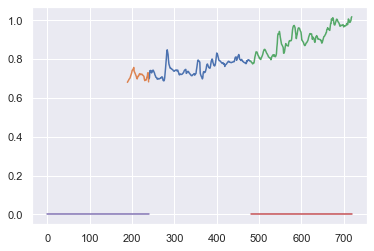

In [24]:
SEGMENT_IX = 50
p005_labelled = p005_labelled.reset_index(drop=True)
central_segments = p005_labelled.iloc[SEGMENT_IX][[f"x_{i}" for i in range(240)]]
left_buffers = p005_labelled.iloc[SEGMENT_IX][[f"x_left_buffer_{i}" for i in range(240)]]
right_buffers = p005_labelled.iloc[SEGMENT_IX][[f"x_right_buffer_{i}" for i in range(240)]]
plt.plot([i for i in range(240, 480, 1)], central_segments)
plt.plot([i for i in range(0, 240, 1)], left_buffers)
plt.plot([i for i in range(480, 720, 1)], right_buffers)
plt.plot([i for i in range(480, 720, 1)], np.zeros_like(right_buffers))
plt.plot([i for i in range(0, 240, 1)], np.zeros_like(right_buffers))

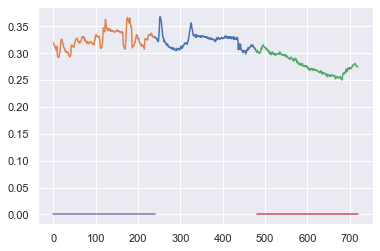

In [25]:
SEGMENT_IX = np.random.randint(low=0, high=p005_unlabelled.shape[0]-1)
p005_unlabelled = p005_unlabelled.reset_index(drop=True)
central_segments = p005_unlabelled.iloc[SEGMENT_IX][[f"x_{i}" for i in range(240)]]
left_buffers = p005_unlabelled.iloc[SEGMENT_IX][[f"x_left_buffer_{i}" for i in range(240)]]
right_buffers = p005_unlabelled.iloc[SEGMENT_IX][[f"x_right_buffer_{i}" for i in range(240)]]
plt.plot([i for i in range(240, 480, 1)], central_segments)
plt.plot([i for i in range(0, 240, 1)], left_buffers)
plt.plot([i for i in range(480, 720, 1)], right_buffers)
plt.plot([i for i in range(480, 720, 1)], np.zeros_like(right_buffers))
plt.plot([i for i in range(0, 240, 1)], np.zeros_like(right_buffers))

## Process all of the VerBIO data

In [28]:
for ix, row in participant_list.iterrows():
    all_segmented_eda_data = process_subject_data(row.PID, "VERBIO_processed_20092023/")

Processing data for pid='P001'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=943, len(eda_df)=1277
using right fill, i=944, len(eda_df)=1277
using right fill, i=945, len(eda_df)=1277
using right fill, i=946, len(eda_df)=1277
using right fill, i=947, len(eda_df)=1277
using right fill, i=948, len(eda_df)=1277
using right fill, i=949, len(eda_df)=1277
using right fill, i=950, len(eda_df)=1277
using right fill, i=951, len(eda_df)=1277
using right fill, i=952, len(eda_df)=1277
using right fill, i=953, len(eda_df)=1277
using right fill, i=954, len(eda_df)=1277
using right fill, i=955, len(eda_df)=1277
using right fill, i=956, len(eda_df)=1277
using right fill, i=957, len(eda_df)=1277
using right fill, i=958, len(eda_df)=1277
using right fill, i=959, len(eda_df)=1277
using right fill, i=960, len(eda_df)=1277
using right fill, i=961, len(eda_df)=1277
using right fill, i=962, len(eda_df)=1277
using right fill, i=963, len(eda_df)=1277
using right fill, i=964, len(eda_df)=1277
using right fill, i=965, len(eda_df)=1277
using right fill, i=966, len(eda_d

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=576, len(eda_df)=967
using right fill, i=577, len(eda_df)=967
using right fill, i=578, len(eda_df)=967
using right fill, i=579, len(eda_df)=967
using right fill, i=580, len(eda_df)=967
using right fill, i=581, len(eda_df)=967
using right fill, i=582, len(eda_df)=967
using right fill, i=583, len(eda_df)=967
using right fill, i=584, len(eda_df)=967
using right fill, i=585, len(eda_df)=967
using right fill, i=586, len(eda_df)=967
using right fill, i=587, len(eda_df)=967
using right fill, i=588, len(eda_df)=967
using right fill, i=589, len(eda_df)=967
using right fill, i=590, len(eda_df)=967
using right fill, i=591, len(eda_df)=967
using right fill, i=592, len(eda_df)=967
using right fill, i=593, len(eda_df)=967
using right fill, i=594, len(eda_df)=967
using right fill, i=595, len(eda_df)=967
using right fill, i=596, len(eda_df)=967
using right fill, i=597, len(eda_df)=967
using right fill, i=598, len(eda_df)=967
using right fill, i=599, len(eda_df)=967
using right fill

using right fill, i=252, len(eda_df)=728
using right fill, i=253, len(eda_df)=728
using right fill, i=254, len(eda_df)=728
using right fill, i=255, len(eda_df)=728
using right fill, i=256, len(eda_df)=728
using right fill, i=257, len(eda_df)=728
using right fill, i=258, len(eda_df)=728
using right fill, i=259, len(eda_df)=728
using right fill, i=260, len(eda_df)=728
using right fill, i=261, len(eda_df)=728
using right fill, i=262, len(eda_df)=728
using right fill, i=263, len(eda_df)=728
using right fill, i=264, len(eda_df)=728
using right fill, i=265, len(eda_df)=728
using right fill, i=266, len(eda_df)=728
using right fill, i=267, len(eda_df)=728
using right fill, i=268, len(eda_df)=728
using right fill, i=269, len(eda_df)=728
using right fill, i=270, len(eda_df)=728
using right fill, i=271, len(eda_df)=728
using right fill, i=272, len(eda_df)=728
using right fill, i=273, len(eda_df)=728
using right fill, i=274, len(eda_df)=728
using right fill, i=275, len(eda_df)=728
using right fill

using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

Processing data for pid='P003'
Cannot load TEST files for pid='P003' as do not exist
Cannot load TEST files for pid='P003' as do not exist
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left f

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=707, len(eda_df)=954
using right fill, i=708, len(eda_df)=954
using right fill, i=709, len(eda_df)=954
using right fill, i=710, len(eda_df)=954
using right fill, i=711, len(eda_df)=954
using right fill, i=712, len(eda_df)=954
using right fill, i=713, len(eda_df)=954
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i

using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using lef

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=712, len(eda_df)=954
using right fill, i=713, len(eda_df)=954
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
usi

Processing data for pid='P004'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=569, len(eda_df)=1049
using right fill, i=570, len(eda_df)=1049
using right fill, i=571, len(eda_df)=1049
using right fill, i=572, len(eda_df)=1049
using right fill, i=573, len(eda_df)=1049
using right fill, i=574, len(eda_df)=1049
using right fill, i=575, len(eda_df)=1049
using right fill, i=576, len(eda_df)=1049
using right fill, i=577, len(eda_df)=1049
using right fill, i=578, len(eda_df)=1049
using right fill, i=579, len(eda_df)=1049
using right fill, i=580, len(eda_df)=1049
using right fill, i=581, len(eda_df)=1049
using right fill, i=582, len(eda_df)=1049
using right fill, i=583, len(eda_df)=1049
using right fill, i=584, len(eda_df)=1049
using right fill, i=585, len(eda_df)=1049
using right fill, i=586, len(eda_df)=1049
using right fill, i=587, len(eda_df)=1049
using right fill, i=588, len(eda_df)=1049
using right fill, i=589, len(eda_df)=1049
usi

using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=731, len(eda_df)=1077
using right fill, i=732, len(eda_df)=1077
using right fill, i=733, len(eda_df)=1077
using right fill, i=734, len(eda_df)=1077
using right fill, i=735, len(eda_df)=1077
using right fill, i=736, len(eda_df)=1077
using right fill, i=737, len(eda_df)=1077
using right fill, i=738, len(eda_df)=1077
using right fill, i=739, len(eda_df)=1077
using right fill, i=740, len(eda_df)=1077
using right fill, i=741, len(eda_df)=1077
using right fill, i=742, len(eda_df)=1077
using right fill, i=743, len(eda_df)=1077
using right fill, i=744, len(eda_df)=1077
using right fill, i=745, len(eda_df)=1077
using right fill, i=746, len(eda_df)=1077
using right fill, i=747, len(eda_df)=1077
using right fill, i=748, len(eda_df)=1077
using right fill, i=749, len(eda_df)=1077
using right fill, i=750, len(eda_df)=1077
using right fill, i=751, len(eda_df)=1077
using right fill, i=752, len(eda_df)=1077
using right fill, i=753, len(eda_df)=1077
using right fill, i=754, len(eda_d

using right fill, i=971, len(eda_df)=1451
using right fill, i=972, len(eda_df)=1451
using right fill, i=973, len(eda_df)=1451
using right fill, i=974, len(eda_df)=1451
using right fill, i=975, len(eda_df)=1451
using right fill, i=976, len(eda_df)=1451
using right fill, i=977, len(eda_df)=1451
using right fill, i=978, len(eda_df)=1451
using right fill, i=979, len(eda_df)=1451
using right fill, i=980, len(eda_df)=1451
using right fill, i=981, len(eda_df)=1451
using right fill, i=982, len(eda_df)=1451
using right fill, i=983, len(eda_df)=1451
using right fill, i=984, len(eda_df)=1451
using right fill, i=985, len(eda_df)=1451
using right fill, i=986, len(eda_df)=1451
using right fill, i=987, len(eda_df)=1451
using right fill, i=988, len(eda_df)=1451
using right fill, i=989, len(eda_df)=1451
using right fill, i=990, len(eda_df)=1451
using right fill, i=991, len(eda_df)=1451
using right fill, i=992, len(eda_df)=1451
using right fill, i=993, len(eda_df)=1451
using right fill, i=994, len(eda_d

using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left

using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=11

using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=831, len(eda_df)=1311
using right fill, i=832, len(eda_df)=1311
using right fill, i=833, len(eda_df)=1311
using right fill, i=834, len(eda_df)=1311
using right fill, i=835, len(eda_df)=1311
using right fill, i=836, len(eda_df)=1311
using right fill, i=837, len(eda_df)=1311
using right fill, i=838, len(eda_df)=1311
using right fill, i=839, len(eda_df)=1311
using right fill, i=840, len(eda_df)=1311
using right fill, i=841, len(eda_df)=1311
using right fill, i=842, len(eda_df)=1311
using right fill, i=843, len(eda_df)=1311
using right fill, i=844, len(eda_df)=1311
using right fill, i=845, len(eda_df)=1311
using right fill, i=846, len(eda_df)=1311
using right fill, i=847, len(eda_df)=1311
using right fill, i=848, len(eda_df)=1311
using right fill, i=849, len(eda_df)=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=1936, len(eda_df)=2317
using right fill, i=1937, len(eda_df)=2317
using right fill, i=1938, len(eda_df)=2317
using right fill, i=1939, len(eda_df)=2317
using right fill, i=1940, len(eda_df)=2317
using right fill, i=1941, len(eda_df)=2317
using right fill, i=1942, len(eda_df)=2317
using right fill, i=1943, len(eda_df)=2317
using right fill, i=1944, len(eda_df)=2317
using right fill, i=1945, len(eda_df)=2317
using right fill, i=1946, len(eda_df)=2317
using right fill, i=1947, len(eda_df)=2317
using right fill, i=1948, len(eda_df)=2317
using right fill, i=1949, len(eda_df)=2317
using right fill, i=1950, len(eda_df)=2317
using right fill, i=1951, len(eda_df)=2317
using right fill, i=1952, len(eda_df)=2317
using right fill, i=1953, len(eda_df)=2317
using right fill, i=1954, len(eda_df)=2317
using right fill, i=1955, len(eda_df)=2317
using right fill, i=1956, len(eda_df)=2317
using right fill, i=1957, len(eda_df)=2317
using right fill, i=1958, len(eda_df)=2317
using right

using right fill, i=780, len(eda_df)=1173
using right fill, i=781, len(eda_df)=1173
using right fill, i=782, len(eda_df)=1173
using right fill, i=783, len(eda_df)=1173
using right fill, i=784, len(eda_df)=1173
using right fill, i=785, len(eda_df)=1173
using right fill, i=786, len(eda_df)=1173
using right fill, i=787, len(eda_df)=1173
using right fill, i=788, len(eda_df)=1173
using right fill, i=789, len(eda_df)=1173
using right fill, i=790, len(eda_df)=1173
using right fill, i=791, len(eda_df)=1173
using right fill, i=792, len(eda_df)=1173
using right fill, i=793, len(eda_df)=1173
using right fill, i=794, len(eda_df)=1173
using right fill, i=795, len(eda_df)=1173
using right fill, i=796, len(eda_df)=1173
using right fill, i=797, len(eda_df)=1173
using right fill, i=798, len(eda_df)=1173
using right fill, i=799, len(eda_df)=1173
using right fill, i=800, len(eda_df)=1173
using right fill, i=801, len(eda_df)=1173
using right fill, i=802, len(eda_df)=1173
using right fill, i=803, len(eda_d

using left fill, i=138
using right fill, i=138, len(eda_df)=481
using left fill, i=139
using right fill, i=139, len(eda_df)=481
using left fill, i=140
using right fill, i=140, len(eda_df)=481
using left fill, i=141
using right fill, i=141, len(eda_df)=481
using left fill, i=142
using right fill, i=142, len(eda_df)=481
using left fill, i=143
using right fill, i=143, len(eda_df)=481
using left fill, i=144
using right fill, i=144, len(eda_df)=481
using left fill, i=145
using right fill, i=145, len(eda_df)=481
using left fill, i=146
using right fill, i=146, len(eda_df)=481
using left fill, i=147
using right fill, i=147, len(eda_df)=481
using left fill, i=148
using right fill, i=148, len(eda_df)=481
using left fill, i=149
using right fill, i=149, len(eda_df)=481
using left fill, i=150
using right fill, i=150, len(eda_df)=481
using left fill, i=151
using right fill, i=151, len(eda_df)=481
using left fill, i=152
using right fill, i=152, len(eda_df)=481
using left fill, i=153
using right fill,

using right fill, i=1929, len(eda_df)=2409
using right fill, i=1930, len(eda_df)=2409
using right fill, i=1931, len(eda_df)=2409
using right fill, i=1932, len(eda_df)=2409
using right fill, i=1933, len(eda_df)=2409
using right fill, i=1934, len(eda_df)=2409
using right fill, i=1935, len(eda_df)=2409
using right fill, i=1936, len(eda_df)=2409
using right fill, i=1937, len(eda_df)=2409
using right fill, i=1938, len(eda_df)=2409
using right fill, i=1939, len(eda_df)=2409
using right fill, i=1940, len(eda_df)=2409
using right fill, i=1941, len(eda_df)=2409
using right fill, i=1942, len(eda_df)=2409
using right fill, i=1943, len(eda_df)=2409
using right fill, i=1944, len(eda_df)=2409
using right fill, i=1945, len(eda_df)=2409
using right fill, i=1946, len(eda_df)=2409
using right fill, i=1947, len(eda_df)=2409
using right fill, i=1948, len(eda_df)=2409
using right fill, i=1949, len(eda_df)=2409
using right fill, i=1950, len(eda_df)=2409
using right fill, i=1951, len(eda_df)=2409
using right

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left

using right fill, i=658, len(eda_df)=913
using right fill, i=659, len(eda_df)=913
using right fill, i=660, len(eda_df)=913
using right fill, i=661, len(eda_df)=913
using right fill, i=662, len(eda_df)=913
using right fill, i=663, len(eda_df)=913
using right fill, i=664, len(eda_df)=913
using right fill, i=665, len(eda_df)=913
using right fill, i=666, len(eda_df)=913
using right fill, i=667, len(eda_df)=913
using right fill, i=668, len(eda_df)=913
using right fill, i=669, len(eda_df)=913
using right fill, i=670, len(eda_df)=913
using right fill, i=671, len(eda_df)=913
using right fill, i=672, len(eda_df)=913
using left fill, i=1
using right fill, i=1, len(eda_df)=458
using left fill, i=2
using right fill, i=2, len(eda_df)=458
using left fill, i=3
using right fill, i=3, len(eda_df)=458
using left fill, i=4
using right fill, i=4, len(eda_df)=458
using left fill, i=5
using right fill, i=5, len(eda_df)=458
using left fill, i=6
using right fill, i=6, len(eda_df)=458
using left fill, i=7
usin

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=524, len(eda_df)=883
using right fill, i=525, len(eda_df)=883
using right fill, i=526, len(eda_df)=883
using right fill, i=527, len(eda_df)=883
using right fill, i=528, len(eda_df)=883
using right fill, i=529, len(eda_df)=883
using right fill, i=530, len(eda_df)=883
using right fill, i=531, len(eda_df)=883
using right fill, i=532, len(eda_df)=883
using right fill, i=533, len(eda_df)=883
using right fill, i=534, len(eda_df)=883
using right fill, i=535, len(eda_df)=883
using right fill, i=536, len(eda_df)=883
using right fill, i=537, len(eda_df)=883
using right fill, i=538, len(eda_df)=883
using right fill, i=539, len(eda_df)=883
using right fill, i=540, len(eda_df)=883
using right fill, i=541, len(eda_df)=883
using right fill, i=542, len(eda_df)=883
using right fill, i=543, len(eda_df)=883
using right fill, i=544, len(eda_df)=883
using right fill, i=545, len(eda_df)=883
using right fill, i=546, len(eda_df)=883
using right fill, i=547, len(eda_df)=883
using right fill

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=612, len(eda_df)=915
using right fill, i=613, len(eda_df)=915
using right fill, i=614, len(eda_df)=915
using right fill, i=615, len(eda_df)=915
using right fill, i=616, len(eda_df)=915
using right fill, i=617, len(eda_df)=915
using right fill, i=618, len(eda_df)=915
using right fill, i=619, len(eda_df)=915
using right fill, i=620, len(eda_df)=915
using right fill, i=621, len(eda_df)=915
using right fill, i=622, len(eda_df)=915
using right fill, i=623, len(eda_df)=915
using right fill, i=624, len(eda_df)=915
using right fill, i=625, len(eda_df)=915
using right fill, i=626, len(eda_df)=915
using right fill, i=627, len(eda_df)=915
using right fill, i=628, len(eda_df)=915
using right fill, i=629, len(eda_df)=915
using right fill, i=630, len(eda_df)=915
using right fill, i=631, len(eda_df)=915
using right fill, i=632, len(eda_df)=915
using right fill, i=633, len(eda_df)=915
using right fill, i=634, len(eda_df)=915
using right fill, i=635, len(eda_df)=915
using right fill

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=854, len(eda_df)=1181
using right fill, i=855, len(eda_df)=1181
using right fill, i=856, len(eda_df)=1181
using right fill, i=857, len(eda_df)=1181
using right fill, i=858, len(eda_df)=1181
using right fill, i=859, len(eda_df)=1181
using right fill, i=860, len(eda_df)=1181
using right fill, i=861, len(eda_df)=1181
using right fill, i=862, len(eda_df)=1181
using right fill, i=863, len(eda_df)=1181
using right fill, i=864, len(eda_df)=1181
using right fill, i=865, len(eda_df)=1181
using right fill, i=866, len(eda_df)=1181
using right fill, i=867, len(eda_df)=1181
using right fill, i=868, len(eda_df)=1181
using right fill, i=869, len(eda_df)=1181
using right fill, i=870, len(eda_df)=1181
using right fill, i=871, len(eda_df)=1181
using right fill, i=872, len(eda_df)=1181
using right fill, i=873, len(eda_df)=1181
using right fill, i=874, len(eda_df)=1181
using right fill, i=875, len(eda_df)=1181
using right fill, i=876, len(eda_df)=1181
using right fill, i=877, len(eda_d

using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=2153, len(eda_df)=2633
using right fill, i=2154, len(eda_df)=2633
using right fill, i=2155, len(eda_df)=2633
using right fill, i=2156, len(eda_df)=2633
using right fill, i=2157, len(eda_df)=2633
using right fill, i=2158, len(eda_df)=2633
using right fill, i=2159, len(eda_df)=2633
using right fill, i=2160, len(eda_df)=2633
using right fill, i=2161, len(eda_df)=2633
using right fill, i=2162, len(eda_df)=2633
using right fill, i=2163, len(eda_df)=2633
using right fill, i=2164, len(eda_df)=2633
using right fill, i=2165, len(eda_df)=2633
using right fill, i=2166, len(eda_df)=2633
using right fill, i=2167, len(

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fi

Processing data for pid='P006'
Cannot load TEST files for pid='P006' as do not exist
Cannot load TEST files for pid='P006' as do not exist
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left f

using right fill, i=714, len(eda_df)=1131
using right fill, i=715, len(eda_df)=1131
using right fill, i=716, len(eda_df)=1131
using right fill, i=717, len(eda_df)=1131
using right fill, i=718, len(eda_df)=1131
using right fill, i=719, len(eda_df)=1131
using right fill, i=720, len(eda_df)=1131
using right fill, i=721, len(eda_df)=1131
using right fill, i=722, len(eda_df)=1131
using right fill, i=723, len(eda_df)=1131
using right fill, i=724, len(eda_df)=1131
using right fill, i=725, len(eda_df)=1131
using right fill, i=726, len(eda_df)=1131
using right fill, i=727, len(eda_df)=1131
using right fill, i=728, len(eda_df)=1131
using right fill, i=729, len(eda_df)=1131
using right fill, i=730, len(eda_df)=1131
using right fill, i=731, len(eda_df)=1131
using right fill, i=732, len(eda_df)=1131
using right fill, i=733, len(eda_df)=1131
using right fill, i=734, len(eda_df)=1131
using right fill, i=735, len(eda_df)=1131
using right fill, i=736, len(eda_df)=1131
using right fill, i=737, len(eda_d

using right fill, i=713, len(eda_df)=1193
using right fill, i=714, len(eda_df)=1193
using right fill, i=715, len(eda_df)=1193
using right fill, i=716, len(eda_df)=1193
using right fill, i=717, len(eda_df)=1193
using right fill, i=718, len(eda_df)=1193
using right fill, i=719, len(eda_df)=1193
using right fill, i=720, len(eda_df)=1193
using right fill, i=721, len(eda_df)=1193
using right fill, i=722, len(eda_df)=1193
using right fill, i=723, len(eda_df)=1193
using right fill, i=724, len(eda_df)=1193
using right fill, i=725, len(eda_df)=1193
using right fill, i=726, len(eda_df)=1193
using right fill, i=727, len(eda_df)=1193
using right fill, i=728, len(eda_df)=1193
using right fill, i=729, len(eda_df)=1193
using right fill, i=730, len(eda_df)=1193
using right fill, i=731, len(eda_df)=1193
using right fill, i=732, len(eda_df)=1193
using right fill, i=733, len(eda_df)=1193
using right fill, i=734, len(eda_df)=1193
using right fill, i=735, len(eda_df)=1193
using right fill, i=736, len(eda_d

using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i

using right fill, i=781, len(eda_df)=1131
using right fill, i=782, len(eda_df)=1131
using right fill, i=783, len(eda_df)=1131
using right fill, i=784, len(eda_df)=1131
using right fill, i=785, len(eda_df)=1131
using right fill, i=786, len(eda_df)=1131
using right fill, i=787, len(eda_df)=1131
using right fill, i=788, len(eda_df)=1131
using right fill, i=789, len(eda_df)=1131
using right fill, i=790, len(eda_df)=1131
using right fill, i=791, len(eda_df)=1131
using right fill, i=792, len(eda_df)=1131
using right fill, i=793, len(eda_df)=1131
using right fill, i=794, len(eda_df)=1131
using right fill, i=795, len(eda_df)=1131
using right fill, i=796, len(eda_df)=1131
using right fill, i=797, len(eda_df)=1131
using right fill, i=798, len(eda_df)=1131
using right fill, i=799, len(eda_df)=1131
using right fill, i=800, len(eda_df)=1131
using right fill, i=801, len(eda_df)=1131
using right fill, i=802, len(eda_df)=1131
using right fill, i=803, len(eda_df)=1131
using right fill, i=804, len(eda_d

using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left 

Processing data for pid='P007'
Cannot load TEST files for pid='P007' as do not exist
Cannot load TEST files for pid='P007' as do not exist
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left f

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=1005, len(eda_df)=1277
using right fill, i=1006, len(eda_df)=1277
using right fill, i=1007, len(eda_df)=1277
using right fill, i=1008, len(eda_df)=1277
using right fill, i=1009, len(eda_df)=1277
using right fill, i=1010, len(eda_df)=1277
using right fill, i=1011, len(eda_df)=1277
using right fill, i=1012, len(eda_df)=1277
using right fill, i=1013, len(eda_df)=1277
using right fill, i=1014, len(eda_df)=1277
using right fill, i=1015, len(eda_df)=1277
using right fill, i=1016, len(eda_df)=1277
using right fill, i=1017, len(eda_df)=1277
using right fill, i=1018, len(eda_df)=1277
using right fill, i=1019, len(eda_df)=1277
using right fill, i=1020, len(eda_df)=1277
using right fill, i=1021, len(eda_df)=1277
using right fill, i=1022, len(eda_df)=1277
using right fill, i=1023, len(eda_df)=1277
using right fill, i=1024, len(eda_df)=1277
using right fill, i=1025, len(eda_df)=1277
using right fill, i=1026, len(eda_df)=1277
using right fill, i=1027, len(eda_df)=1277
using right

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill

Processing data for pid='P008'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=781, len(eda_df)=1154
using right fill, i=782, len(eda_df)=1154
using right fill, i=783, len(eda_df)=1154
using right fill, i=784, len(eda_df)=1154
using right fill, i=785, len(eda_df)=1154
using right fill, i=786, len(eda_df)=1154
using right fill, i=787, len(eda_df)=1154
using right fill, i=788, len(eda_df)=1154
using right fill, i=789, len(eda_df)=1154
using right fill, i=790, len(eda_df)=1154
using right fill, i=791, len(eda_df)=1154
using right fill, i=792, len(eda_df)=1154
using right fill, i=793, len(eda_df)=1154
using right fill, i=794, len(eda_df)=1154
using right fill, i=795, len(eda_df)=1154
using right fill, i=796, len(eda_df)=1154
using right fill, i=797, len(eda_df)=1154
using right fill, i=798, len(eda_df)=1154
using right fill, i=799, len(eda_df)=1154
using right fill, i=800, len(eda_df)=1154
using right fill, i=801, len(eda_df)=1154
using right fill, i=802, len(eda_df)=1154
using right fill, i=803, len(eda_df)=1154
using right fill, i=804, len(eda_d

using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left 

using right fill, i=811, len(eda_df)=1077
using right fill, i=812, len(eda_df)=1077
using right fill, i=813, len(eda_df)=1077
using right fill, i=814, len(eda_df)=1077
using right fill, i=815, len(eda_df)=1077
using right fill, i=816, len(eda_df)=1077
using right fill, i=817, len(eda_df)=1077
using right fill, i=818, len(eda_df)=1077
using right fill, i=819, len(eda_df)=1077
using right fill, i=820, len(eda_df)=1077
using right fill, i=821, len(eda_df)=1077
using right fill, i=822, len(eda_df)=1077
using right fill, i=823, len(eda_df)=1077
using right fill, i=824, len(eda_df)=1077
using right fill, i=825, len(eda_df)=1077
using right fill, i=826, len(eda_df)=1077
using right fill, i=827, len(eda_df)=1077
using right fill, i=828, len(eda_df)=1077
using right fill, i=829, len(eda_df)=1077
using right fill, i=830, len(eda_df)=1077
using right fill, i=831, len(eda_df)=1077
using right fill, i=832, len(eda_df)=1077
using right fill, i=833, len(eda_df)=1077
using right fill, i=834, len(eda_d

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=771, len(eda_df)=1154
using right fill, i=772, len(eda_df)=1154
using right fill, i=773, len(eda_df)=1154
using right fill, i=774, len(eda_df)=1154
using right fill, i=775, len(eda_df)=1154
using right fill, i=776, len(eda_df)=1154
using right fill, i=777, len(eda_df)=1154
using right fill, i=778, len(eda_df)=1154
using right fill, i=779, len(eda_df)=1154
using right fill, i=780, len(eda_df)=1154
using right fill, i=781, len(eda_df)=1154
using right fill, i=782, len(eda_df)=1154
using right fill, i=783, len(eda_df)=1154
using right fill, i=784, len(eda_df)=1154
using right fill, i=785, len(eda_df)=1154
using right fill, i=786, len(eda_df)=1154
using right fill, i=787, len(eda_df)=1154
using right fill, i=788, len(eda_df)=1154
using right fill, i=789, len(eda_df)=1154
using right fill, i=790, len(eda_df)=1154
using right fill, i=791, len(eda_df)=1154
using right fill, i=792, len(eda_df)=1154
using right fill, i=793, len(eda_df)=1154
using right fill, i=794, len(eda_d

using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=597, len(eda_df)=1077
using right fill, i=598, len(eda_df)=1077
using right fill, i=599, len(eda_df)=1077
using right fill, i=600, len(eda_df)=1077
using right fill, i=601, len(eda_df)=1077
using right fill, i=602, len(eda_df)=1077
using right fill, i=603, len(eda_df)=1077
using right fill, i=604, len(eda_df)=1077
using right fill, i=605, len(eda_df)=1077
using right fill, i=606, len(eda_df)=1077
using

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left 

using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left

using right fill, i=665, len(eda_df)=974
using right fill, i=666, len(eda_df)=974
using right fill, i=667, len(eda_df)=974
using right fill, i=668, len(eda_df)=974
using right fill, i=669, len(eda_df)=974
using right fill, i=670, len(eda_df)=974
using right fill, i=671, len(eda_df)=974
using right fill, i=672, len(eda_df)=974
using right fill, i=673, len(eda_df)=974
using right fill, i=674, len(eda_df)=974
using right fill, i=675, len(eda_df)=974
using right fill, i=676, len(eda_df)=974
using right fill, i=677, len(eda_df)=974
using right fill, i=678, len(eda_df)=974
using right fill, i=679, len(eda_df)=974
using right fill, i=680, len(eda_df)=974
using right fill, i=681, len(eda_df)=974
using right fill, i=682, len(eda_df)=974
using right fill, i=683, len(eda_df)=974
using right fill, i=684, len(eda_df)=974
using right fill, i=685, len(eda_df)=974
using right fill, i=686, len(eda_df)=974
using right fill, i=687, len(eda_df)=974
using right fill, i=688, len(eda_df)=974
using right fill

using right fill, i=1881, len(eda_df)=2361
using right fill, i=1882, len(eda_df)=2361
using right fill, i=1883, len(eda_df)=2361
using right fill, i=1884, len(eda_df)=2361
using right fill, i=1885, len(eda_df)=2361
using right fill, i=1886, len(eda_df)=2361
using right fill, i=1887, len(eda_df)=2361
using right fill, i=1888, len(eda_df)=2361
using right fill, i=1889, len(eda_df)=2361
using right fill, i=1890, len(eda_df)=2361
using right fill, i=1891, len(eda_df)=2361
using right fill, i=1892, len(eda_df)=2361
using right fill, i=1893, len(eda_df)=2361
using right fill, i=1894, len(eda_df)=2361
using right fill, i=1895, len(eda_df)=2361
using right fill, i=1896, len(eda_df)=2361
using right fill, i=1897, len(eda_df)=2361
using right fill, i=1898, len(eda_df)=2361
using right fill, i=1899, len(eda_df)=2361
using right fill, i=1900, len(eda_df)=2361
using right fill, i=1901, len(eda_df)=2361
using right fill, i=1902, len(eda_df)=2361
using right fill, i=1903, len(eda_df)=2361
using right

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=759, len(eda_df)=1141
using right fill, i=760, len(eda_df)=1141
using right fill, i=761, len(eda_df)=1141
using right fill, i=762, len(eda_df)=1141
using right fill, i=763, len(eda_df)=1141
using right fill, i=764, len(eda_df)=1141
using right fill, i=765, len(eda_df)=1141
using right fill, i=766, len(eda_df)=1141
using right fill, i=767, len(eda_df)=1141
using right fill, i=768, len(eda_df)=1141
using right fill, i=769, len(eda_df)=1141
using right fill, i=770, len(eda_df)=1141
using right fill, i=771, len(eda_df)=1141
using right fill, i=772, len(eda_df)=1141
using right fill, i=773, len(eda_df)=1141
using right fill, i=774, len(eda_df)=1141
using right fill, i=775, len(eda_df)=1141
using right fill, i=776, len(eda_df)=1141
using right fill, i=777, len(eda_df)=1141
using right fill, i=778, len(eda_df)=1141
using right fill, i=779, len(eda_df)=1141
using right fill, i=780, len(eda_df)=1141
using right fill, i=781, len(eda_df)=1141
using right fill, i=782, len(eda_d

using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=657, len(eda_df)=1137
using right fill, i=658, len(eda_df)=1137
using right fill, i=659, len(eda_df)=1137
using right fill, i=660, len(eda_df)=1137
using right fill, i=661, le

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=765, len(eda_df)=1077
using right fill, i=766, len(eda_df)=1077
using right fill, i=767, len(eda_df)=1077
using right fill, i=768, len(eda_df)=1077
using right fill, i=769, len(eda_df)=1077
using right fill, i=770, len(eda_df)=1077
using right fill, i=771, len(eda_df)=1077
using right fill, i=772, len(eda_df)=1077
using right fill, i=773, len(eda_df)=1077
using right fill, i=774, len(eda_df)=1077
using right fill, i=775, len(eda_df)=1077
using right fill, i=776, len(eda_df)=1077
using right fill, i=777, len(eda_df)=1077
using right fill, i=778, len(eda_df)=1077
using right fill, i=779, len(eda_df)=1077
using right fill, i=780, len(eda_df)=1077
using right fill, i=781, len(eda_df)=1077
using right fill, i=782, len(eda_df)=1077
using right fill, i=783, len(eda_df)=1077
using right fill, i=784, len(eda_df)=1077
using right fill, i=785, len(eda_df)=1077
using right fill, i=786, len(eda_df)=1077
using right fill, i=787, len(eda_df)=1077
using right fill, i=788, len(eda_d

using right fill, i=1509, len(eda_df)=1989
using right fill, i=1510, len(eda_df)=1989
using right fill, i=1511, len(eda_df)=1989
using right fill, i=1512, len(eda_df)=1989
using right fill, i=1513, len(eda_df)=1989
using right fill, i=1514, len(eda_df)=1989
using right fill, i=1515, len(eda_df)=1989
using right fill, i=1516, len(eda_df)=1989
using right fill, i=1517, len(eda_df)=1989
using right fill, i=1518, len(eda_df)=1989
using right fill, i=1519, len(eda_df)=1989
using right fill, i=1520, len(eda_df)=1989
using right fill, i=1521, len(eda_df)=1989
using right fill, i=1522, len(eda_df)=1989
using right fill, i=1523, len(eda_df)=1989
using right fill, i=1524, len(eda_df)=1989
using right fill, i=1525, len(eda_df)=1989
using right fill, i=1526, len(eda_df)=1989
using right fill, i=1527, len(eda_df)=1989
using right fill, i=1528, len(eda_df)=1989
using right fill, i=1529, len(eda_df)=1989
using right fill, i=1530, len(eda_df)=1989
using right fill, i=1531, len(eda_df)=1989
using right

Processing data for pid='P009'
Cannot load TEST files for pid='P009' as do not exist
Cannot load TEST files for pid='P009' as do not exist
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left f

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left 

using right fill, i=850, len(eda_df)=1201
using right fill, i=851, len(eda_df)=1201
using right fill, i=852, len(eda_df)=1201
using right fill, i=853, len(eda_df)=1201
using right fill, i=854, len(eda_df)=1201
using right fill, i=855, len(eda_df)=1201
using right fill, i=856, len(eda_df)=1201
using right fill, i=857, len(eda_df)=1201
using right fill, i=858, len(eda_df)=1201
using right fill, i=859, len(eda_df)=1201
using right fill, i=860, len(eda_df)=1201
using right fill, i=861, len(eda_df)=1201
using right fill, i=862, len(eda_df)=1201
using right fill, i=863, len(eda_df)=1201
using right fill, i=864, len(eda_df)=1201
using right fill, i=865, len(eda_df)=1201
using right fill, i=866, len(eda_df)=1201
using right fill, i=867, len(eda_df)=1201
using right fill, i=868, len(eda_df)=1201
using right fill, i=869, len(eda_df)=1201
using right fill, i=870, len(eda_df)=1201
using right fill, i=871, len(eda_df)=1201
using right fill, i=872, len(eda_df)=1201
using right fill, i=873, len(eda_d

using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

Processing data for pid='P011'
Cannot load TEST files for pid='P011' as do not exist
Cannot load TEST files for pid='P011' as do not exist
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left f

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=745, len(eda_df)=1005
using right fill, i=746, len(eda_df)=1005
using right fill, i=747, len(eda_df)=1005
using right fill, i=748, len(eda_df)=1005
using right fill, i=749, len(eda_df)=1005
using right fill, i=750, len(eda_df)=1005
using right fill, i=751, len(eda_df)=1005
using right fill, i=752, len(eda_df)=1005
using right fill, i=753, len(eda_df)=1005
using right fill, i=754, len(eda_df)=1005
using right fill, i=755, len(eda_df)=1005
using right fill, i=756, len(eda_df)=1005
using right fill, i=757, len(eda_df)=1005
using right fill, i=758, len(eda_df)=1005
using right fill, i=759, len(eda_df)=1005
using right fill, i=760, len(eda_df)=1005
using right fill, i=761, len(eda_df)=1005
using right fill, i=762, len(eda_df)=1005
using right fill, i=763, len(eda_df)=1005
using right fill, i=764, len(eda_df)=1005
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fi

using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=724, len(eda_df)=1005
using right fill, i=725, len(eda_df)=1005
using right fill, i=726, len(eda_df)=1005
using right fill, i=727, len(eda_df)=1005
using right fill, i=728, len(eda_df)=1005
using right fill, i=729, len(eda_df)=1005
using right fill, i=730, len(eda_df)=1005
using right fill, i=731, len(eda_df)=1005
using right fill, i=732, len(eda_df)=1005
using right fill, i=733, len(eda_df)=1005
using right fill, i=734, len(eda_df)=1005
using right fill, i=735, len(eda_df)=1005
using right fill, i=736, len(eda_df)=1005
using right fill, i=737, len(eda_df)=1005
using right fill, i=738, len(eda_df)=1005
using right fill, i=739, len(eda_df)=1005
using right fill, i=740, len(eda_df)=1005
using right fill, i=741, len(eda_df)=1005
using right fill, i=742, len(eda_df)=1005
using right fill, i=743, len(eda_df)=1005
using right fill, i=744, len(eda_df)=1005
using right fill, i=745, len(eda_df)=1005
using right fill, i=746, len(eda_df)=1005
using right fill, i=747, len(eda_d

Processing data for pid='P012'
Cannot load TEST files for pid='P012' as do not exist
Cannot load TEST files for pid='P012' as do not exist
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left f

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill

using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left fill, i=161
using left fill, i=162
using left fill, i=163
using left fill, i=164
using left fill, i=165
using left fill, i=166
using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left

Processing data for pid='P013'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=725, len(eda_df)=1205
using right fill, i=726, len(eda_df)=1205
using right fill, i=727, len(eda_df)=1205
using right fill, i=728, len(eda_df)=1205
using right fill, i=729, len(eda_df)=1205
using right fill, i=730, len(eda_df)=1205
using right fill, i=731, len(eda_df)=1205
using right fill, i=732, len(eda_df)=1205
using right fill, i=733, len(eda_df)=1205
using right fill, i=734, len(eda_df)=1205
using right fill, i=735, len(eda_df)=1205
using right fill, i=736, len(eda_df)=1205
using right fill, i=737, len(eda_df)=1205
using right fill, i=738, len(eda_df)=1205
using right fill, i=739, len(eda_df)=1205
using right fill, i=740, len(eda_df)=1205
using right fill, i=741, len(eda_df)=1205
using right fill, i=742, len(eda_df)=1205
using right fill, i=743, len(eda_df)=1205
using right fill, i=744, len(eda_df)=1205
using right fill, i=745, len(eda_df)=1205
using right fill, i=746, len(eda_df)=1205
using right fill, i=747, len(eda_df)=1205
using right fill, i=748, len(eda_d

using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left fill, i=161
using left fill, i=162
using left fill, i=163
using left fill, i=164
using left fill, i=165
using left fill, i=166
using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

Processing data for pid='P014'
Cannot load TEST files for pid='P014' as do not exist
Cannot load TEST files for pid='P014' as do not exist
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left f

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=663, len(eda_df)=1024
using right fill, i=664, len(eda_df)=1024
using right fill, i=665, len(eda_df)=1024
using right fill, i=666, len(eda_df)=1024
using right fill, i=667, len(eda_df)=1024
using right fill, i=668, len(eda_df)=1024
using right fill, i=669, len(eda_df)=1024
using right fill, i=670, len(eda_df)=1024
using right fill, i=671, len(eda_df)=1024
using right fill, i=672, len(eda_df)=1024
using right fill, i=673, len(eda_df)=1024
using right fill, i=674, len(eda_df)=1024
using right fill, i=675, len(eda_df)=1024
using right fill, i=676, len(eda_df)=1024
using right fill, i=677, len(eda_df)=1024
using right fill, i=678, len(eda_df)=1024
using right fill, i=679, len(eda_df)=1024
using right fill, i=680, len(eda_df)=1024
using right fill, i=681, len(eda_df)=1024
using right fill, i=682, len(eda_df)=1024
using right fill, i=683, len(eda_df)=1024
using right fill, i=684, len(eda_df)=1024
using right fill, i=685, len(eda_df)=1024
using right fill, i=686, len(eda_d

using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=401, len(eda_df)=881
using right fill, i=402, len(eda_df)=881
using right fill, i=403, len(eda_df)=881
using right fill, i=404, len(eda_df)=881
using right fill, i=405, len(eda_df)=881
using right fill, i=406, len(eda_df)=881
using right fill, i=407, len(eda_df)=881
using right fill, i=408

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

Processing data for pid='P016'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=783, len(eda_df)=1169
using right fill, i=784, len(eda_df)=1169
using right fill, i=785, len(eda_df)=1169
using right fill, i=786, len(eda_df)=1169
using right fill, i=787, len(eda_df)=1169
using right fill, i=788, len(eda_df)=1169
using right fill, i=789, len(eda_df)=1169
using right fill, i=790, len(eda_df)=1169
using right fill, i=791, len(eda_df)=1169
using right fill, i=792, len(eda_df)=1169
using right fill, i=793, len(eda_df)=1169
using right fill, i=794, len(eda_df)=1169
using right fill, i=795, len(eda_df)=1169
using right fill, i=796, len(eda_df)=1169
using right fill, i=797, len(eda_df)=1169
using right fill, i=798, len(eda_df)=1169
using right fill, i=799, len(eda_df)=1169
using right fill, i=800, len(eda_df)=1169
using right fill, i=801, len(eda_df)=1169
using right fill, i=802, len(eda_df)=1169
using right fill, i=803, len(eda_df)=1169
using right fill, i=804, len(eda_df)=1169
using right fill, i=805, len(eda_df)=1169
using right fill, i=806, len(eda_d

using right fill, i=457, len(eda_df)=937
using right fill, i=458, len(eda_df)=937
using right fill, i=459, len(eda_df)=937
using right fill, i=460, len(eda_df)=937
using right fill, i=461, len(eda_df)=937
using right fill, i=462, len(eda_df)=937
using right fill, i=463, len(eda_df)=937
using right fill, i=464, len(eda_df)=937
using right fill, i=465, len(eda_df)=937
using right fill, i=466, len(eda_df)=937
using right fill, i=467, len(eda_df)=937
using right fill, i=468, len(eda_df)=937
using right fill, i=469, len(eda_df)=937
using right fill, i=470, len(eda_df)=937
using right fill, i=471, len(eda_df)=937
using right fill, i=472, len(eda_df)=937
using right fill, i=473, len(eda_df)=937
using right fill, i=474, len(eda_df)=937
using right fill, i=475, len(eda_df)=937
using right fill, i=476, len(eda_df)=937
using right fill, i=477, len(eda_df)=937
using right fill, i=478, len(eda_df)=937
using right fill, i=479, len(eda_df)=937
using right fill, i=480, len(eda_df)=937
using right fill

using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left

using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using l

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=13

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=754, len(eda_df)=1081
using right fill, i=755, len(eda_df)=1081
using right fill, i=756, len(eda_df)=1081
using right fill, i=757, len(eda_df)=1081
using right fill, i=758, len(eda_df)=1081
using right fill, i=759, len(eda_df)=1081
using right fill, i=760, len(eda_df)=1081
using right fill, i=761, len(eda_df)=1081
using right fill, i=762, len(eda_df)=1081
using right fill, i=763, len(eda_df)=1081
using right fill, i=764, len(eda_df)=1081
using right fill, i=765, len(eda_df)=1081
using right fill, i=766, len(eda_df)=1081
using right fill, i=767, len(eda_df)=1081
using right fill, i=768, len(eda_df)=1081
using right fill, i=769, len(eda_df)=1081
using right fill, i=770, len(eda_df)=1081
using right fill, i=771, len(eda_df)=1081
using right fill, i=772, len(eda_df)=1081
using right fill, i=773, len(eda_df)=1081
using right fill, i=774, len(eda_df)=1081
using right fill, i=775, len(eda_df)=1081
using right fill, i=776, len(eda_df)=1081
using right fill, i=777, len(eda_d

using right fill, i=1741, len(eda_df)=2221
using right fill, i=1742, len(eda_df)=2221
using right fill, i=1743, len(eda_df)=2221
using right fill, i=1744, len(eda_df)=2221
using right fill, i=1745, len(eda_df)=2221
using right fill, i=1746, len(eda_df)=2221
using right fill, i=1747, len(eda_df)=2221
using right fill, i=1748, len(eda_df)=2221
using right fill, i=1749, len(eda_df)=2221
using right fill, i=1750, len(eda_df)=2221
using right fill, i=1751, len(eda_df)=2221
using right fill, i=1752, len(eda_df)=2221
using right fill, i=1753, len(eda_df)=2221
using right fill, i=1754, len(eda_df)=2221
using right fill, i=1755, len(eda_df)=2221
using right fill, i=1756, len(eda_df)=2221
using right fill, i=1757, len(eda_df)=2221
using right fill, i=1758, len(eda_df)=2221
using right fill, i=1759, len(eda_df)=2221
using right fill, i=1760, len(eda_df)=2221
using right fill, i=1761, len(eda_df)=2221
using right fill, i=1762, len(eda_df)=2221
using right fill, i=1763, len(eda_df)=2221
using right

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=758, len(eda_df)=1053
using right fill, i=759, len(eda_df)=1053
using right fill, i=760, len(eda_df)=1053
using right fill, i=761, len(eda_df)=1053
using right fill, i=762, len(eda_df)=1053
using right fill, i=763, len(eda_df)=1053
using right fill, i=764, len(eda_df)=1053
using right fill, i=765, len(eda_df)=1053
using right fill, i=766, len(eda_df)=1053
using right fill, i=767, len(eda_df)=1053
using right fill, i=768, len(eda_df)=1053
using right fill, i=769, len(eda_df)=1053
using right fill, i=770, len(eda_df)=1053
using right fill, i=771, len(eda_df)=1053
using right fill, i=772, len(eda_df)=1053
using right fill, i=773, len(eda_df)=1053
using right fill, i=774, len(eda_df)=1053
using right fill, i=775, len(eda_df)=1053
using right fill, i=776, len(eda_df)=1053
using right fill, i=777, len(eda_df)=1053
using right fill, i=778, len(eda_df)=1053
using right fill, i=779, len(eda_df)=1053
using right fill, i=780, len(eda_df)=1053
using right fill, i=781, len(eda_d

Processing data for pid='P017'
Cannot load TEST files for pid='P017' as do not exist
Cannot load TEST files for pid='P017' as do not exist
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left f

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using right fill, i=34, len(eda_df)=514
using left fill, i=35
using right fill, i=35, len(eda_df)=514
using left fill, i=36
using right fill, i=36, len(eda_df)=514
using left fill, i=37
using right fill, i=37, len(eda_df)=514
using left fill, i=38
using right f

using right fill, i=393, len(eda_df)=873
using right fill, i=394, len(eda_df)=873
using right fill, i=395, len(eda_df)=873
using right fill, i=396, len(eda_df)=873
using right fill, i=397, len(eda_df)=873
using right fill, i=398, len(eda_df)=873
using right fill, i=399, len(eda_df)=873
using right fill, i=400, len(eda_df)=873
using right fill, i=401, len(eda_df)=873
using right fill, i=402, len(eda_df)=873
using right fill, i=403, len(eda_df)=873
using right fill, i=404, len(eda_df)=873
using right fill, i=405, len(eda_df)=873
using right fill, i=406, len(eda_df)=873
using right fill, i=407, len(eda_df)=873
using right fill, i=408, len(eda_df)=873
using right fill, i=409, len(eda_df)=873
using right fill, i=410, len(eda_df)=873
using right fill, i=411, len(eda_df)=873
using right fill, i=412, len(eda_df)=873
using right fill, i=413, len(eda_df)=873
using right fill, i=414, len(eda_df)=873
using right fill, i=415, len(eda_df)=873
using right fill, i=416, len(eda_df)=873
using right fill

using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=1873, len(eda_df)=2353
using right fill, i=1874, len(eda_df)=2353
using right fill, i=1875, len(eda_df)=2353
using right fill, i=1876, len(eda_df)=2353
using right fill, i=1877, len(eda_df)=2353
usi

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using right fill, i=34, len(eda_df)=514
using left fill, i=35
using right fill, i=35, len(eda_df)=514
using left fill, i=36
using right fill, i=36, len(eda_df)=514
using left fill, i=37
using right fill, i=37, len(eda_df)=514
using left fill, i=38
using right f

using right fill, i=393, len(eda_df)=873
using right fill, i=394, len(eda_df)=873
using right fill, i=395, len(eda_df)=873
using right fill, i=396, len(eda_df)=873
using right fill, i=397, len(eda_df)=873
using right fill, i=398, len(eda_df)=873
using right fill, i=399, len(eda_df)=873
using right fill, i=400, len(eda_df)=873
using right fill, i=401, len(eda_df)=873
using right fill, i=402, len(eda_df)=873
using right fill, i=403, len(eda_df)=873
using right fill, i=404, len(eda_df)=873
using right fill, i=405, len(eda_df)=873
using right fill, i=406, len(eda_df)=873
using right fill, i=407, len(eda_df)=873
using right fill, i=408, len(eda_df)=873
using right fill, i=409, len(eda_df)=873
using right fill, i=410, len(eda_df)=873
using right fill, i=411, len(eda_df)=873
using right fill, i=412, len(eda_df)=873
using right fill, i=413, len(eda_df)=873
using right fill, i=414, len(eda_df)=873
using right fill, i=415, len(eda_df)=873
using right fill, i=416, len(eda_df)=873
using right fill

Processing data for pid='P018'
Cannot load TEST files for pid='P018' as do not exist
Cannot load TEST files for pid='P018' as do not exist
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left f

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=781, len(eda_df)=1166
using right fill, i=782, len(eda_df)=1166
using right fill, i=783, len(eda_df)=1166
using right fill, i=784, len(eda_df)=1166
using right fill, i=785, len(eda_df)=1166
using right fill, i=786, len(eda_df)=1166
using right fill, i=787, len(eda_df)=1166
using right fill, i=788, len(eda_df)=1166
using right fill, i=789, len(eda_df)=1166
using right fill, i=790, len(eda_df)=1166
using right fill, i=791, len(eda_df)=1166
using right fill, i=792, len(eda_df)=1166
using right fill, i=793, len(eda_df)=1166
using right fill, i=794, len(eda_df)=1166
using right fill, i=795, len(eda_df)=1166
using right fill, i=796, len(eda_df)=1166
using right fill, i=797, len(eda_df)=1166
using right fill, i=798, len(eda_df)=1166
using right fill, i=799, len(eda_df)=1166
using right fill, i=800, len(eda_df)=1166
using right fill, i=801, len(eda_df)=1166
using right fill, i=802, len(eda_df)=1166
using right fill, i=803, len(eda_df)=1166
using right fill, i=804, len(eda_d

using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=782, len(eda_df)=1166
using right fill, i=783, len(eda_df)=1166
using right fill, i=784, len(eda_df)=1166
using right fill, i=785, len(eda_df)=1166
using right fill, i=786, len(eda_df)=1166
using right fill, i=787, len(eda_df)=1166
using right fill, i=788, len(eda_df)=1166
using right fill, i=789, len(eda_df)=1166
using right fill, i=790, len(eda_df)=1166
using right fill, i=791, len(eda_df)=1166
using right fill, i=792, len(eda_df)=1166
using right fill, i=793, len(eda_df)=1166
using right fill, i=794, len(eda_df)=1166
using right fill, i=795, len(eda_df)=1166
using right fill, i=796, len(eda_df)=1166
using right fill, i=797, len(eda_df)=1166
using right fill, i=798, len(eda_df)=1166
using right fill, i=799, len(eda_df)=1166
using right fill, i=800, len(eda_df)=1166
using right fill, i=801, len(eda_df)=1166
using right fill, i=802, len(eda_df)=1166
using right fill, i=803, len(eda_df)=1166
using right fill, i=804, len(eda_df)=1166
using right fill, i=805, len(eda_d

using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=533, len(eda_df)=1013
using right fill, i=534, len(eda_df)=1013
using right fill, i=535, len(eda_df)=1013
using right fill, i=536, len(eda_df)=1013
using right fill, i=537, len(eda_df)=1013
using right fill, i=538, len(eda_df)=1013
using right fill, i=539, len(eda_df)=1013
using right fill, i=540, len(eda_df)=1013
using right fill, i=541, len(eda_df)=1013
using right fill, i=542,

Processing data for pid='P020'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=238
using left fill, i=239
using right fill, i=557, len(eda_df)=1037
using right fill, i=558, len(eda_df)=1037
using right fill, i=559, len(eda_df)=1037
using right fill, i=560, len(eda_df)=1037
using right fill, i=561, len(eda_df)=1037
using right fill, i=562, len(eda_df)=1037
using right fill, i=563, len(eda_df)=1037
using right fill, i=564, len(eda_df)=1037
using right fill, i=565, len(eda_df)=1037
using right fill, i=566, len(eda_df)=1037
using right fill, i=567, len(eda_df)=1037
using right fill, i=568, len(eda_df)=1037
using right fill, i=569, len(eda_df)=1037
using right fill, i=570, len(eda_df)=1037
using right fill, i=571, len(eda_df)=1037
using right fill, i=572, len(eda_df)=1037
using right fill, i=573, len(eda_df)=1037
using right fill, i=574, len(eda_df)=1037
using right fill, i=575, len(eda_df)=1037
using right fill, i=576, len(eda_df)=1037
using right fill, i=577, len(eda_df)=1037
using right fill, i=578, len(eda_df)=1037
using right fill, i=579, len(e

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=557, len(eda_df)=1037
using right fill, i=558, len(eda_df)=1037
using right fill, i=559, len(eda_df)=1037
using right fill, i=560, len(eda_df)=1037
using right fill, i=561, len(eda_df)=1037
using right fill, i=562, len(eda_df)=1037
using right fill, i=563, len(eda_df)=1037
using right fill, i=564, len(eda_df)=1037
using right fill, i=565, len(eda_df)=1037
using right fill, i=566, len(eda_df)=1037
using right fill, i=567, len(eda_df)=1037
using right fill, i=568, len(eda_df)=1037
using right fill, i=569, len(eda_df)=1037
using right fill, i=570, len(eda_df)=1037
using right fill, i=571, len(eda_df)=1037
using right fill, i=572, len(eda_df)=1037
using right fill, i=573, len(eda_df)=1037
using right fill, i=574, len(eda_df)=1037
using right fill, i=575, len(eda_df)=1037
using right fill, i=576, len(eda_df)=1037
using right fill, i=577, len(eda_df)=1037
using right fill, i=578, len(eda_df)=1037
using right fill, i=579, len(eda_df)=1037
using right fill, i=580, len(eda_d

using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left 

using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left 

using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fi

using right fill, i=622, len(eda_df)=926
using right fill, i=623, len(eda_df)=926
using right fill, i=624, len(eda_df)=926
using right fill, i=625, len(eda_df)=926
using right fill, i=626, len(eda_df)=926
using right fill, i=627, len(eda_df)=926
using right fill, i=628, len(eda_df)=926
using right fill, i=629, len(eda_df)=926
using right fill, i=630, len(eda_df)=926
using right fill, i=631, len(eda_df)=926
using right fill, i=632, len(eda_df)=926
using right fill, i=633, len(eda_df)=926
using right fill, i=634, len(eda_df)=926
using right fill, i=635, len(eda_df)=926
using right fill, i=636, len(eda_df)=926
using right fill, i=637, len(eda_df)=926
using right fill, i=638, len(eda_df)=926
using right fill, i=639, len(eda_df)=926
using right fill, i=640, len(eda_df)=926
using right fill, i=641, len(eda_df)=926
using right fill, i=642, len(eda_df)=926
using right fill, i=643, len(eda_df)=926
using right fill, i=644, len(eda_df)=926
using right fill, i=645, len(eda_df)=926
using right fill

using right fill, i=335, len(eda_df)=723
using right fill, i=336, len(eda_df)=723
using right fill, i=337, len(eda_df)=723
using right fill, i=338, len(eda_df)=723
using right fill, i=339, len(eda_df)=723
using right fill, i=340, len(eda_df)=723
using right fill, i=341, len(eda_df)=723
using right fill, i=342, len(eda_df)=723
using right fill, i=343, len(eda_df)=723
using right fill, i=344, len(eda_df)=723
using right fill, i=345, len(eda_df)=723
using right fill, i=346, len(eda_df)=723
using right fill, i=347, len(eda_df)=723
using right fill, i=348, len(eda_df)=723
using right fill, i=349, len(eda_df)=723
using right fill, i=350, len(eda_df)=723
using right fill, i=351, len(eda_df)=723
using right fill, i=352, len(eda_df)=723
using right fill, i=353, len(eda_df)=723
using right fill, i=354, len(eda_df)=723
using right fill, i=355, len(eda_df)=723
using right fill, i=356, len(eda_df)=723
using right fill, i=357, len(eda_df)=723
using right fill, i=358, len(eda_df)=723
using right fill

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill,

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109


using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fi

using right fill, i=729, len(eda_df)=1021
using right fill, i=730, len(eda_df)=1021
using right fill, i=731, len(eda_df)=1021
using right fill, i=732, len(eda_df)=1021
using right fill, i=733, len(eda_df)=1021
using right fill, i=734, len(eda_df)=1021
using right fill, i=735, len(eda_df)=1021
using right fill, i=736, len(eda_df)=1021
using right fill, i=737, len(eda_df)=1021
using right fill, i=738, len(eda_df)=1021
using right fill, i=739, len(eda_df)=1021
using right fill, i=740, len(eda_df)=1021
using right fill, i=741, len(eda_df)=1021
using right fill, i=742, len(eda_df)=1021
using right fill, i=743, len(eda_df)=1021
using right fill, i=744, len(eda_df)=1021
using right fill, i=745, len(eda_df)=1021
using right fill, i=746, len(eda_df)=1021
using right fill, i=747, len(eda_df)=1021
using right fill, i=748, len(eda_df)=1021
using right fill, i=749, len(eda_df)=1021
using right fill, i=750, len(eda_df)=1021
using right fill, i=751, len(eda_df)=1021
using right fill, i=752, len(eda_d

using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left fill, i=161
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=717, len(eda_df)=997
using right fill, i=718, len(eda_df)=997
using right fill, i=719, len(eda_df)=997
using right fill, i=720, len(eda_df)=997
using right fill, i=721, len(eda_df)=997
using right fill, i=722, len(eda_df)=997
using right fill, i=723, len(eda_df)=997
using right fill, i=724, len(eda_df)=997
using right fill, i=725, len(eda_df)=997
using right fill, i=726, len(eda_df)=997
using right fill, i=727, len(eda_df)=997
using right fill, i=728, len(eda_df)=997
using right fill, i=729, len(eda_df)=997
using right fill, i=730, len(eda_df)=997
using right fill, i=731, len(eda_df)=997
using right fill, i=732, len(eda_df)=997
using right fill, i=733, len(eda_df)=997
using right fill, i=734, len(eda_df)=997
using right fill, i=735, len(eda_df)=997
using right fill, i=736, len(eda_df)=997
using right fill, i=737, len(eda_df)=997
using right fill, i=738, len(eda_df)=997
using right fill, i=739, len(eda_df)=997
using right fill, i=740, len(eda_df)=997
using right fill

Processing data for pid='P021'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=721, len(eda_df)=1201
using right fill, i=722, len(eda_df)=1201
using right fill, i=723, len(eda_df)=1201
using right fill, i=724, len(eda_df)=1201
usin

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=721, len(eda_df)=1201
using right fill, i=722, len(eda_df)=1201
using right fill, i=723, len(eda_df)=1201
using right fill, i=724, len(eda_df)=1201
using right fill, i=725, len(eda_df)=1201
using right fill, i=726, len(ed

using right fill, i=959, len(eda_df)=1201
using right fill, i=960, len(eda_df)=1201
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
u

using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left fill, i=161
using left fill, i=162
using left fill, i=163
using left fill, i=164
using left fill, i=165
using left fill, i=166
using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left 

using left fill, i=55
using right fill, i=55, len(eda_df)=461
using left fill, i=56
using right fill, i=56, len(eda_df)=461
using left fill, i=57
using right fill, i=57, len(eda_df)=461
using left fill, i=58
using right fill, i=58, len(eda_df)=461
using left fill, i=59
using right fill, i=59, len(eda_df)=461
using left fill, i=60
using right fill, i=60, len(eda_df)=461
using left fill, i=61
using right fill, i=61, len(eda_df)=461
using left fill, i=62
using right fill, i=62, len(eda_df)=461
using left fill, i=63
using right fill, i=63, len(eda_df)=461
using left fill, i=64
using right fill, i=64, len(eda_df)=461
using left fill, i=65
using right fill, i=65, len(eda_df)=461
using left fill, i=66
using right fill, i=66, len(eda_df)=461
using left fill, i=67
using right fill, i=67, len(eda_df)=461
using left fill, i=68
using right fill, i=68, len(eda_df)=461
using left fill, i=69
using right fill, i=69, len(eda_df)=461
using left fill, i=70
using right fill, i=70, len(eda_df)=461
using le

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=112
using right fill, i=112, len(eda_df)=535
using left fill, i=113
using right fill, i=113, len(eda_df)=535
using left fill, i=114
using right fill, i=114, len(eda_df)=535
using left fill, i=115
using right fill, i=115, len(eda_df)=535
using left fill, i=116
using right fill, i=116, len(eda_df)=535
using left fill, i=117
using right fill, i=117, len(eda_df)=535
using left fill, i=118
using right fill, i=118, len(eda_df)=535
using left fill, i=119
using right fill, i=119, len(eda_df)=535
using left fill, i=120
using right fill, i=120, len(eda_df)=535
using left fill, i=121
using right fill, i=121, len(eda_df)=535
using left fill, i=122
using right fill, i=122, len(eda_df)=535
using left fill, i=123
using right fill, i=123, len(eda_df)=535
using left fill, i=124
using right fill, i=124, len(eda_df)=535
using left fill, i=125
using right fill, i=125, len(eda_df)=535
using left fill, i=126
using right fill, i=126, len(eda_df)=535
using left fill, i=127
using right fill,

using right fill, i=259, len(eda_df)=514
using right fill, i=260, len(eda_df)=514
using right fill, i=261, len(eda_df)=514
using right fill, i=262, len(eda_df)=514
using right fill, i=263, len(eda_df)=514
using right fill, i=264, len(eda_df)=514
using right fill, i=265, len(eda_df)=514
using right fill, i=266, len(eda_df)=514
using right fill, i=267, len(eda_df)=514
using right fill, i=268, len(eda_df)=514
using right fill, i=269, len(eda_df)=514
using right fill, i=270, len(eda_df)=514
using right fill, i=271, len(eda_df)=514
using right fill, i=272, len(eda_df)=514
using right fill, i=273, len(eda_df)=514
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=1

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=753, len(eda_df)=1081
using right fill, i=754, len(eda_df)=1081
using right fill, i=755, len(eda_df)=1081
using right fill, i=756, len(eda_df)=1081
using right fill, i=757, len(eda_df)=1081
using right fill, i=758, len(eda_df)=1081
using right fill, i=759, len(eda_df)=1081
using right fill, i=760, len(eda_df)=1081
using right fill, i=761, len(eda_df)=1081
using right fill, i=762, len(eda_df)=1081
using right fill, i=763, len(eda_df)=1081
using right fill, i=764, len(eda_df)=1081
using right fill, i=765, len(eda_df)=1081
using right fill, i=766, len(eda_df)=1081
using right fill, i=767, len(eda_df)=1081
using right fill, i=768, len(eda_df)=1081
using right fill, i=769, len(eda_df)=1081
using right fill, i=770, len(eda_df)=1081
using right fill, i=771, len(eda_df)=1081
using right fill, i=772, len(eda_df)=1081
using right fill, i=773, len(eda_df)=1081
using right fill, i=774, len(eda_df)=1081
using right fill, i=775, len(eda_df)=1081
using right fill, i=776, len(eda_d

using right fill, i=1805, len(eda_df)=2285
using right fill, i=1806, len(eda_df)=2285
using right fill, i=1807, len(eda_df)=2285
using right fill, i=1808, len(eda_df)=2285
using right fill, i=1809, len(eda_df)=2285
using right fill, i=1810, len(eda_df)=2285
using right fill, i=1811, len(eda_df)=2285
using right fill, i=1812, len(eda_df)=2285
using right fill, i=1813, len(eda_df)=2285
using right fill, i=1814, len(eda_df)=2285
using right fill, i=1815, len(eda_df)=2285
using right fill, i=1816, len(eda_df)=2285
using right fill, i=1817, len(eda_df)=2285
using right fill, i=1818, len(eda_df)=2285
using right fill, i=1819, len(eda_df)=2285
using right fill, i=1820, len(eda_df)=2285
using right fill, i=1821, len(eda_df)=2285
using right fill, i=1822, len(eda_df)=2285
using right fill, i=1823, len(eda_df)=2285
using right fill, i=1824, len(eda_df)=2285
using right fill, i=1825, len(eda_df)=2285
using right fill, i=1826, len(eda_df)=2285
using right fill, i=1827, len(eda_df)=2285
using right

Processing data for pid='P023'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=713, len(eda_df)=1006
using right fill, i=714, len(eda_df)=1006
using right fill, i=715, len(eda_df)=1006
using right fill, i=716, len(eda_df)=1006
using right fill, i=717, len(eda_df)=1006
using right fill, i=718, len(eda_df)=1006
using right fill, i=719, len(eda_df)=1006
using right fill, i=720, len(eda_df)=1006
using right fill, i=721, len(eda_df)=1006
using right fill, i=722, len(eda_df)=1006
using right fill, i=723, len(eda_df)=1006
using right fill, i=724, len(eda_df)=1006
using right fill, i=725, len(eda_df)=1006
using right fill, i=726, len(eda_df)=1006
using right fill, i=727, len(eda_df)=1006
using right fill, i=728, len(eda_df)=1006
using right fill, i=729, len(eda_df)=1006
using right fill, i=730, len(eda_df)=1006
using right fill, i=731, len(eda_df)=1006
using right fill, i=732, len(eda_df)=1006
using right fill, i=733, len(eda_df)=1006
using right fill, i=734, len(eda_df)=1006
using right fill, i=735, len(eda_df)=1006
using right fill, i=736, len(eda_d

using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=736, len(eda_df)=1006
using right fill, i=737, len(eda_df)=1006
using right fill, i=738, len(eda_df)=1006
using right fill, i=739, len(eda_df)=1006
using right fill, i=740, len(eda_df)=1006
using right fill, i=741, len(eda_df)=1006
using right fill, i=742, len(eda_df)=1006
using right fill, i=743, len(eda_df)=1006
using right fill, i=744, len(eda_df)=1006
using right fill, i=745, len(eda_df)=1006
using right fill, i=746, len(eda_df)=1006
using right fill, i=747, len(eda_df)=1006
using right fill, i=748, len(eda_df)=1006
using right fill, i=749, len(eda_df)=1006
using right fill, i=750, len(eda_df)=1006
using right fill, i=751, len(eda_df)=1006
using right fill, i=752, len(eda_df)=1006
using right fill, i=753, len(eda_df)=1006
using right fill, i=754, len(eda_df)=1006
using right fill, i=755, len(eda_df)=1006
using right fill, i=756, len(eda_df)=1006
using right fill, i=757, len(eda_df)=1006
using right fill, i=758, len(eda_df)=1006
using right fill, i=759, len(eda_d

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=753, len(eda_df)=1116
using right fill, i=754, len(eda_df)=1116
using right fill, i=755, len(eda_df)=1116
using right fill, i=756, len(eda_df)=1116
using right fill, i=757, len(eda_df)=1116
using right fill, i=758, len(eda_df)=1116
using right fill, i=759, len(eda_df)=1116
using right fill, i=760, len(eda_df)=1116
using right fill, i=761, len(eda_df)=1116
using right fill, i=762, len(eda_df)=1116
using right fill, i=763, len(eda_df)=1116
using right fill, i=764, len(eda_df)=1116
using right fill, i=765, len(eda_df)=1116
using right fill, i=766, len(eda_df)=1116
using right fill, i=767, len(eda_df)=1116
using right fill, i=768, len(eda_df)=1116
using right fill, i=769, len(eda_df)=1116
using right fill, i=770, len(eda_df)=1116
using right fill, i=771, len(eda_df)=1116
using right fill, i=772, len(eda_df)=1116
using right fill, i=773, len(eda_df)=1116
using right fill, i=774, len(eda_df)=1116
using right fill, i=775, len(eda_df)=1116
using right fill, i=776, len(eda_d

using right fill, i=471, len(eda_df)=951
using right fill, i=472, len(eda_df)=951
using right fill, i=473, len(eda_df)=951
using right fill, i=474, len(eda_df)=951
using right fill, i=475, len(eda_df)=951
using right fill, i=476, len(eda_df)=951
using right fill, i=477, len(eda_df)=951
using right fill, i=478, len(eda_df)=951
using right fill, i=479, len(eda_df)=951
using right fill, i=480, len(eda_df)=951
using right fill, i=481, len(eda_df)=951
using right fill, i=482, len(eda_df)=951
using right fill, i=483, len(eda_df)=951
using right fill, i=484, len(eda_df)=951
using right fill, i=485, len(eda_df)=951
using right fill, i=486, len(eda_df)=951
using right fill, i=487, len(eda_df)=951
using right fill, i=488, len(eda_df)=951
using right fill, i=489, len(eda_df)=951
using right fill, i=490, len(eda_df)=951
using right fill, i=491, len(eda_df)=951
using right fill, i=492, len(eda_df)=951
using right fill, i=493, len(eda_df)=951
using right fill, i=494, len(eda_df)=951
using right fill

using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left

using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=730, len(eda_df)=1037
using right fill, i=731, len(eda_df)=1037
using right fill, i=732, len(eda_df)=1037
using right fill, i=733, len(eda_df)=1037
using right fill, i=734, len(eda_df)=1037
using right fill, i=735, len(eda_df)=1037
using right fill, i=736, len(eda_df)=1037
using right fill, i=737, len(eda_df)=1037
using right fill, i=738, len(eda_df)=1037
using right fill, i=739, len(eda_df)=1037
using right fill, i=740, len(eda_df)=1037
using right fill, i=741, len(eda_df)=1037
using right fill, i=742, len(eda_df)=1037
using right fill, i=743, len(eda_df)=1037
using right fill, i=744, len(eda_df)=1037
using right fill, i=745, len(eda_df)=1037
using right fill, i=746, len(eda_df)=1037
using right fill, i=747, len(eda_df)=1037
using right fill, i=748, len(eda_df)=1037
using right fill, i=749, len(eda_df)=1037
using right fill, i=750, len(eda_df)=1037
using right fill, i=751, len(eda_df)=1037
using right fill, i=752, len(eda_df)=1037
using right fill, i=753, len(eda_d

using right fill, i=1621, len(eda_df)=2101
using right fill, i=1622, len(eda_df)=2101
using right fill, i=1623, len(eda_df)=2101
using right fill, i=1624, len(eda_df)=2101
using right fill, i=1625, len(eda_df)=2101
using right fill, i=1626, len(eda_df)=2101
using right fill, i=1627, len(eda_df)=2101
using right fill, i=1628, len(eda_df)=2101
using right fill, i=1629, len(eda_df)=2101
using right fill, i=1630, len(eda_df)=2101
using right fill, i=1631, len(eda_df)=2101
using right fill, i=1632, len(eda_df)=2101
using right fill, i=1633, len(eda_df)=2101
using right fill, i=1634, len(eda_df)=2101
using right fill, i=1635, len(eda_df)=2101
using right fill, i=1636, len(eda_df)=2101
using right fill, i=1637, len(eda_df)=2101
using right fill, i=1638, len(eda_df)=2101
using right fill, i=1639, len(eda_df)=2101
using right fill, i=1640, len(eda_df)=2101
using right fill, i=1641, len(eda_df)=2101
using right fill, i=1642, len(eda_df)=2101
using right fill, i=1643, len(eda_df)=2101
using right

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left fill, i=161
using left fill, i=162
using left fill, i=163
using left fill, i=164
using left fill, i=165
using left fill, i=166
using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=720, len(eda_df)=997
using right fill, i=721, len(eda_df)=997
using right fill, i=722, len(eda_df)=997
using right fill, i=723, len(eda_df)=997
using right fill, i=724, len(eda_df)=997
using right fill, i=725, len(eda_df)=997
using right fill, i=726, len(eda_df)=997
using right fill, i=727, len(eda_df)=997
using right fill, i=728, len(eda_df)=997
using right fill, i=729, len(eda_df)=997
using right fill, i=730, len(eda_df)=997
using right fill, i=731, len(eda_df)=997
using right fill, i=732, len(eda_df)=997
using right fill, i=733, len(eda_df)=997
using right fill, i=734, len(eda_df)=997
using right fill, i=735, len(eda_df)=997
using right fill, i=736, len(eda_df)=997
using right fill, i=737, len(eda_df)=997
using right fill, i=738, len(eda_df)=997
using right fill, i=739, len(eda_df)=997
using right fill, i=740, len(eda_df)=997
using right fill, i=741, len(eda_df)=997
using right fill, i=742, len(eda_df)=997
using right fill, i=743, len(eda_df)=997
using right fill

using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

Processing data for pid='P026'
Cannot load TEST files for pid='P026' as do not exist
Cannot load TEST files for pid='P026' as do not exist
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left f

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=772, len(eda_df)=1177
using right fill, i=773, len(eda_df)=1177
using right fill, i=774, len(eda_df)=1177
using right fill, i=775, len(eda_df)=1177
using right fill, i=776, len(eda_df)=1177
using right fill, i=777, len(eda_df)=1177
using right fill, i=778, len(eda_df)=1177
using right fill, i=779, len(eda_df)=1177
using right fill, i=780, len(eda_df)=1177
using right fill, i=781, len(eda_df)=1177
using right fill, i=782, len(eda_df)=1177
using right fill, i=783, len(eda_df)=1177
using right fill, i=784, len(eda_df)=1177
using right fill, i=785, len(eda_df)=1177
using right fill, i=786, len(eda_df)=1177
using right fill, i=787, len(eda_df)=1177
using right fill, i=788, len(eda_df)=1177
using right fill, i=789, len(eda_df)=1177
using right fill, i=790, len(eda_df)=1177
using right fill, i=791, len(eda_df)=1177
using right fill, i=792, len(eda_df)=1177
using right fill, i=793, len(eda_df)=1177
using right fill, i=794, len(eda_df)=1177
using right fill, i=795, len(eda_d

using right fill, i=589, len(eda_df)=1069
using right fill, i=590, len(eda_df)=1069
using right fill, i=591, len(eda_df)=1069
using right fill, i=592, len(eda_df)=1069
using right fill, i=593, len(eda_df)=1069
using right fill, i=594, len(eda_df)=1069
using right fill, i=595, len(eda_df)=1069
using right fill, i=596, len(eda_df)=1069
using right fill, i=597, len(eda_df)=1069
using right fill, i=598, len(eda_df)=1069
using right fill, i=599, len(eda_df)=1069
using right fill, i=600, len(eda_df)=1069
using right fill, i=601, len(eda_df)=1069
using right fill, i=602, len(eda_df)=1069
using right fill, i=603, len(eda_df)=1069
using right fill, i=604, len(eda_df)=1069
using right fill, i=605, len(eda_df)=1069
using right fill, i=606, len(eda_df)=1069
using right fill, i=607, len(eda_df)=1069
using right fill, i=608, len(eda_df)=1069
using right fill, i=609, len(eda_df)=1069
using right fill, i=610, len(eda_df)=1069
using right fill, i=611, len(eda_df)=1069
using right fill, i=612, len(eda_d

using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left fill, i=161
using left fill, i=162
using left fill, i=163
using left fill, i=164
using left fill, i=165
using left fill, i=166
using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=767, len(eda_df)=1177
using right fill, i=768, len(eda_df)=1177
using right fill, i=769, len(eda_df)=1177
using right fill, i=770, len(eda_df)=1177
using right fill, i=771, len(eda_df)=1177
using right fill, i=772, len(eda_df)=1177
using right fill, i=773, len(eda_df)=1177
using right fill, i=774, len(eda_df)=1177
using right fill, i=775, len(eda_df)=1177
using right fill, i=776, len(eda_df)=1177
using right fill, i=777, len(eda_df)=1177
using right fill, i=778, len(eda_df)=1177
using right fill, i=779, len(eda_df)=1177
using right fill, i=780, len(eda_df)=1177
using right fill, i=781, len(eda_df)=1177
using right fill, i=782, len(eda_df)=1177
using right fill, i=783, len(eda_df)=1177
using right fill, i=784, len(eda_df)=1177
using right fill, i=785, len(eda_df)=1177
using right fill, i=786, len(eda_df)=1177
using right fill, i=787, len(eda_df)=1177
using right fill, i=788, len(eda_df)=1177
using right fill, i=789, len(eda_df)=1177
using right fill, i=790, len(eda_d

using right fill, i=589, len(eda_df)=1069
using right fill, i=590, len(eda_df)=1069
using right fill, i=591, len(eda_df)=1069
using right fill, i=592, len(eda_df)=1069
using right fill, i=593, len(eda_df)=1069
using right fill, i=594, len(eda_df)=1069
using right fill, i=595, len(eda_df)=1069
using right fill, i=596, len(eda_df)=1069
using right fill, i=597, len(eda_df)=1069
using right fill, i=598, len(eda_df)=1069
using right fill, i=599, len(eda_df)=1069
using right fill, i=600, len(eda_df)=1069
using right fill, i=601, len(eda_df)=1069
using right fill, i=602, len(eda_df)=1069
using right fill, i=603, len(eda_df)=1069
using right fill, i=604, len(eda_df)=1069
using right fill, i=605, len(eda_df)=1069
using right fill, i=606, len(eda_df)=1069
using right fill, i=607, len(eda_df)=1069
using right fill, i=608, len(eda_df)=1069
using right fill, i=609, len(eda_df)=1069
using right fill, i=610, len(eda_df)=1069
using right fill, i=611, len(eda_df)=1069
using right fill, i=612, len(eda_d

Processing data for pid='P027'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=807, len(eda_df)=1165
using right fill, i=808, len(eda_df)=1165
using right fill, i=809, len(eda_df)=1165
using right fill, i=810, len(eda_df)=1165
using right fill, i=811, len(eda_df)=1165
using right fill, i=812, len(eda_df)=1165
using right fill, i=813, len(eda_df)=1165
using right fill, i=814, len(eda_df)=1165
using right fill, i=815, len(eda_df)=1165
using right fill, i=816, len(eda_df)=1165
using right fill, i=817, len(eda_df)=1165
using right fill, i=818, len(eda_df)=1165
using right fill, i=819, len(eda_df)=1165
using right fill, i=820, len(eda_df)=1165
using right fill, i=821, len(eda_df)=1165
using right fill, i=822, len(eda_df)=1165
using right fill, i=823, len(eda_df)=1165
using right fill, i=824, len(eda_df)=1165
using right fill, i=825, len(eda_df)=1165
using right fill, i=826, len(eda_df)=1165
using right fill, i=827, len(eda_df)=1165
using right fill, i=828, len(eda_df)=1165
using right fill, i=829, len(eda_df)=1165
using right fill, i=830, len(eda_d

using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=573, len(eda_df)=1053
using right fill, i=574, len(eda_df)=1053
using right fill, i=575, len(eda_df)=1053
using right fill, i=576, len(eda_df)=1053
using right fill, i=577, len(eda_df)=1053
using right fill, i=578, len(eda_df)=1053
using right fill, i=579, len(eda_df)=1053
using right fill, i=580, len(eda_df)=1053
using right fill, i=581, len(eda_df)=1053
using right fill, i=582, len(eda_df)=1053
using right fill, i=583, len(eda_df)=1053
using right fill, i=584, len(eda_df)=1053
using right fill, i=585, len(eda_df)=1053
using right fill, i=586, len(eda_df)=1053
using right fill, i=587, len(eda_df)=1053
using right fill, i=588, len(eda_df)=1053
using right fill, i=589, len(eda_df)=1053
using right fill, i=590, len(eda_df)=1053
using right fill, i=591, len(eda_df)=1053
using right fill, i=592, len(eda_df)=1053
using right fill, i=593, len(eda_df)=1053
using right fill, i=594, len(eda_df)=1053
using right fill, i=595, len(eda_df)=1053
using right fill, i=596, len(eda_d

using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left fill, i=161
using left fill, i=162
using left fill, i=163
using left fill, i=164
using left fill, i=165
using left fill, i=166
using left fill, i=167
using left fill, i=168
using left fill, i=169
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=645, len(eda_df)=919
using right fill, i=646, len(eda_df)=919
using right fill, i=647, len(eda_df)=919
using right fill, i=648, len(eda_df)=919
using right fill, i=649, len(eda_df)=919
using right fill, i=650, len(eda_df)=919
using right fill, i=651, len(eda_df)=919
using right fill, i=652, len(eda_df)=919
using right fill, i=653, len(eda_df)=919
using right fill, i=654, len(eda_df)=919
using right fill, i=655, len(eda_df)=919
using right fill, i=656, len(eda_df)=919
using right fill, i=657, len(eda_df)=919
using right fill, i=658, len(eda_df)=919
using right fill, i=659, len(eda_df)=919
using right fill, i=660, len(eda_df)=919
using right fill, i=661, len(eda_df)=919
using right fill, i=662, len(eda_df)=919
using right fill, i=663, len(eda_df)=919
using right fill, i=664, len(eda_df)=919
using right fill, i=665, len(eda_df)=919
using right fill, i=666, len(eda_df)=919
using right fill, i=667, len(eda_df)=919
using right fill, i=668, len(eda_df)=919
using right fill

using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left f

using right fill, i=831, len(eda_df)=1201
using right fill, i=832, len(eda_df)=1201
using right fill, i=833, len(eda_df)=1201
using right fill, i=834, len(eda_df)=1201
using right fill, i=835, len(eda_df)=1201
using right fill, i=836, len(eda_df)=1201
using right fill, i=837, len(eda_df)=1201
using right fill, i=838, len(eda_df)=1201
using right fill, i=839, len(eda_df)=1201
using right fill, i=840, len(eda_df)=1201
using right fill, i=841, len(eda_df)=1201
using right fill, i=842, len(eda_df)=1201
using right fill, i=843, len(eda_df)=1201
using right fill, i=844, len(eda_df)=1201
using right fill, i=845, len(eda_df)=1201
using right fill, i=846, len(eda_df)=1201
using right fill, i=847, len(eda_df)=1201
using right fill, i=848, len(eda_df)=1201
using right fill, i=849, len(eda_df)=1201
using right fill, i=850, len(eda_df)=1201
using right fill, i=851, len(eda_df)=1201
using right fill, i=852, len(eda_df)=1201
using right fill, i=853, len(eda_df)=1201
using right fill, i=854, len(eda_d

using right fill, i=797, len(eda_df)=1161
using right fill, i=798, len(eda_df)=1161
using right fill, i=799, len(eda_df)=1161
using right fill, i=800, len(eda_df)=1161
using right fill, i=801, len(eda_df)=1161
using right fill, i=802, len(eda_df)=1161
using right fill, i=803, len(eda_df)=1161
using right fill, i=804, len(eda_df)=1161
using right fill, i=805, len(eda_df)=1161
using right fill, i=806, len(eda_df)=1161
using right fill, i=807, len(eda_df)=1161
using right fill, i=808, len(eda_df)=1161
using right fill, i=809, len(eda_df)=1161
using right fill, i=810, len(eda_df)=1161
using right fill, i=811, len(eda_df)=1161
using right fill, i=812, len(eda_df)=1161
using right fill, i=813, len(eda_df)=1161
using right fill, i=814, len(eda_df)=1161
using right fill, i=815, len(eda_df)=1161
using right fill, i=816, len(eda_df)=1161
using right fill, i=817, len(eda_df)=1161
using right fill, i=818, len(eda_df)=1161
using right fill, i=819, len(eda_df)=1161
using right fill, i=820, len(eda_d

using right fill, i=1589, len(eda_df)=2069
using right fill, i=1590, len(eda_df)=2069
using right fill, i=1591, len(eda_df)=2069
using right fill, i=1592, len(eda_df)=2069
using right fill, i=1593, len(eda_df)=2069
using right fill, i=1594, len(eda_df)=2069
using right fill, i=1595, len(eda_df)=2069
using right fill, i=1596, len(eda_df)=2069
using right fill, i=1597, len(eda_df)=2069
using right fill, i=1598, len(eda_df)=2069
using right fill, i=1599, len(eda_df)=2069
using right fill, i=1600, len(eda_df)=2069
using right fill, i=1601, len(eda_df)=2069
using right fill, i=1602, len(eda_df)=2069
using right fill, i=1603, len(eda_df)=2069
using right fill, i=1604, len(eda_df)=2069
using right fill, i=1605, len(eda_df)=2069
using right fill, i=1606, len(eda_df)=2069
using right fill, i=1607, len(eda_df)=2069
using right fill, i=1608, len(eda_df)=2069
using right fill, i=1609, len(eda_df)=2069
using right fill, i=1610, len(eda_df)=2069
using right fill, i=1611, len(eda_df)=2069
using right

Cannot create complete windows for file of length (0, 1) therefore skipping. Min = (segment_length)=240
Cannot create complete windows for file of length (0, 1) therefore skipping. Min = (segment_length)=240
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using lef

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

Processing data for pid='P031'
Cannot load TEST files for pid='P031' as do not exist
Cannot load TEST files for pid='P031' as do not exist
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left f

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=742, len(eda_df)=1093
using right fill, i=743, len(eda_df)=1093
using right fill, i=744, len(eda_df)=1093
using right fill, i=745, len(eda_df)=1093
using right fill, i=746, len(eda_df)=1093
using right fill, i=747, len(eda_df)=1093
using right fill, i=748, len(eda_df)=1093
using right fill, i=749, len(eda_df)=1093
using right fill, i=750, len(eda_df)=1093
using right fill, i=751, len(eda_df)=1093
using right fill, i=752, len(eda_df)=1093
using right fill, i=753, len(eda_df)=1093
using right fill, i=754, len(eda_df)=1093
using right fill, i=755, len(eda_df)=1093
using right fill, i=756, len(eda_df)=1093
using right fill, i=757, len(eda_df)=1093
using right fill, i=758, len(eda_df)=1093
using right fill, i=759, len(eda_df)=1093
using right fill, i=760, len(eda_df)=1093
using right fill, i=761, len(eda_df)=1093
using right fill, i=762, len(eda_df)=1093
using right fill, i=763, len(eda_df)=1093
using right fill, i=764, len(eda_df)=1093
using right fill, i=765, len(eda_d

using right fill, i=669, len(eda_df)=1149
using right fill, i=670, len(eda_df)=1149
using right fill, i=671, len(eda_df)=1149
using right fill, i=672, len(eda_df)=1149
using right fill, i=673, len(eda_df)=1149
using right fill, i=674, len(eda_df)=1149
using right fill, i=675, len(eda_df)=1149
using right fill, i=676, len(eda_df)=1149
using right fill, i=677, len(eda_df)=1149
using right fill, i=678, len(eda_df)=1149
using right fill, i=679, len(eda_df)=1149
using right fill, i=680, len(eda_df)=1149
using right fill, i=681, len(eda_df)=1149
using right fill, i=682, len(eda_df)=1149
using right fill, i=683, len(eda_df)=1149
using right fill, i=684, len(eda_df)=1149
using right fill, i=685, len(eda_df)=1149
using right fill, i=686, len(eda_df)=1149
using right fill, i=687, len(eda_df)=1149
using right fill, i=688, len(eda_df)=1149
using right fill, i=689, len(eda_df)=1149
using right fill, i=690, len(eda_df)=1149
using right fill, i=691, len(eda_df)=1149
using right fill, i=692, len(eda_d

using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill,

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=721, len(eda_df)=1093
using right fill, i=722, len(eda_df)=1093
using right fill, i=723, len(eda_df)=1093
using right fill, i=724, len(eda_df)=1093
using right fill, i=725, len(eda_df)=1093
using right fill, i=726, len(eda_df)=1093
using right fill, i=727, len(eda_df)=1093
using right fill, i=728, len(eda_df)=1093
using right fill, i=729, len(eda_df)=1093
using right fill, i=730, len(eda_df)=1093
using right fill, i=731, len(eda_df)=1093
using right fill, i=732, len(eda_df)=1093
using right fill, i=733, len(eda_df)=1093
using right fill, i=734, len(eda_df)=1093
using right fill, i=735, len(eda_df)=1093
using right fill, i=736, len(eda_df)=1093
using right fill, i=737, len(eda_df)=1093
using right fill, i=738, len(eda_df)=1093
using right fill, i=739, len(eda_df)=1093
using right fill, i=740, len(eda_df)=1093
using right fill, i=741, len(eda_df)=1093
using right fill, i=742, len(eda_df)=1093
using right fill, i=743, len(eda_df)=1093
using right fill, i=744, len(eda_d

using right fill, i=669, len(eda_df)=1149
using right fill, i=670, len(eda_df)=1149
using right fill, i=671, len(eda_df)=1149
using right fill, i=672, len(eda_df)=1149
using right fill, i=673, len(eda_df)=1149
using right fill, i=674, len(eda_df)=1149
using right fill, i=675, len(eda_df)=1149
using right fill, i=676, len(eda_df)=1149
using right fill, i=677, len(eda_df)=1149
using right fill, i=678, len(eda_df)=1149
using right fill, i=679, len(eda_df)=1149
using right fill, i=680, len(eda_df)=1149
using right fill, i=681, len(eda_df)=1149
using right fill, i=682, len(eda_df)=1149
using right fill, i=683, len(eda_df)=1149
using right fill, i=684, len(eda_df)=1149
using right fill, i=685, len(eda_df)=1149
using right fill, i=686, len(eda_df)=1149
using right fill, i=687, len(eda_df)=1149
using right fill, i=688, len(eda_df)=1149
using right fill, i=689, len(eda_df)=1149
using right fill, i=690, len(eda_df)=1149
using right fill, i=691, len(eda_df)=1149
using right fill, i=692, len(eda_d

Processing data for pid='P032'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=790, len(eda_df)=1168
using right fill, i=791, len(eda_df)=1168
using right fill, i=792, len(eda_df)=1168
using right fill, i=793, len(eda_df)=1168
using right fill, i=794, len(eda_df)=1168
using right fill, i=795, len(eda_df)=1168
using right fill, i=796, len(eda_df)=1168
using right fill, i=797, len(eda_df)=1168
using right fill, i=798, len(eda_df)=1168
using right fill, i=799, len(eda_df)=1168
using right fill, i=800, len(eda_df)=1168
using right fill, i=801, len(eda_df)=1168
using right fill, i=802, len(eda_df)=1168
using right fill, i=803, len(eda_df)=1168
using right fill, i=804, len(eda_df)=1168
using right fill, i=805, len(eda_df)=1168
using right fill, i=806, len(eda_df)=1168
using right fill, i=807, len(eda_df)=1168
using right fill, i=808, len(eda_df)=1168
using right fill, i=809, len(eda_df)=1168
using right fill, i=810, len(eda_df)=1168
using right fill, i=811, len(eda_df)=1168
using right fill, i=812, len(eda_df)=1168
using right fill, i=813, len(eda_d

using right fill, i=601, len(eda_df)=1081
using right fill, i=602, len(eda_df)=1081
using right fill, i=603, len(eda_df)=1081
using right fill, i=604, len(eda_df)=1081
using right fill, i=605, len(eda_df)=1081
using right fill, i=606, len(eda_df)=1081
using right fill, i=607, len(eda_df)=1081
using right fill, i=608, len(eda_df)=1081
using right fill, i=609, len(eda_df)=1081
using right fill, i=610, len(eda_df)=1081
using right fill, i=611, len(eda_df)=1081
using right fill, i=612, len(eda_df)=1081
using right fill, i=613, len(eda_df)=1081
using right fill, i=614, len(eda_df)=1081
using right fill, i=615, len(eda_df)=1081
using right fill, i=616, len(eda_df)=1081
using right fill, i=617, len(eda_df)=1081
using right fill, i=618, len(eda_df)=1081
using right fill, i=619, len(eda_df)=1081
using right fill, i=620, len(eda_df)=1081
using right fill, i=621, len(eda_df)=1081
using right fill, i=622, len(eda_df)=1081
using right fill, i=623, len(eda_df)=1081
using right fill, i=624, len(eda_d

using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=777, len(eda_df)=1168
using right fill, i=778, len(eda_df)=1168
using right fill, i=779, len(eda_df)=1168
using right fill, i=780, len(eda_df)=1168
using right fill, i=781, len(eda_df)=1168
using right fill, i=782, len(eda_df)=1168
using right fill, i=783, len(eda_df)=1168
using right fill, i=784, len(eda_df)=1168
using right fill, i=785, len(eda_df)=1168
using right fill, i=786, len(eda_df)=1168
using right fill, i=787, len(eda_df)=1168
using right fill, i=788, len(eda_df)=1168
using right fill, i=789, len(eda_df)=1168
using right fill, i=790, len(eda_df)=1168
using right fill, i=791, len(eda_df)=1168
using right fill, i=792, len(eda_df)=1168
using right fill, i=793, len(eda_df)=1168
using right fill, i=794, len(eda_df)=1168
using right fill, i=795, len(eda_df)=1168
using right fill, i=796, len(eda_df)=1168
using right fill, i=797, len(eda_df)=1168
using right fill, i=798, len(eda_df)=1168
using right fill, i=799, len(eda_df)=1168
using right fill, i=800, len(eda_d

using right fill, i=601, len(eda_df)=1081
using right fill, i=602, len(eda_df)=1081
using right fill, i=603, len(eda_df)=1081
using right fill, i=604, len(eda_df)=1081
using right fill, i=605, len(eda_df)=1081
using right fill, i=606, len(eda_df)=1081
using right fill, i=607, len(eda_df)=1081
using right fill, i=608, len(eda_df)=1081
using right fill, i=609, len(eda_df)=1081
using right fill, i=610, len(eda_df)=1081
using right fill, i=611, len(eda_df)=1081
using right fill, i=612, len(eda_df)=1081
using right fill, i=613, len(eda_df)=1081
using right fill, i=614, len(eda_df)=1081
using right fill, i=615, len(eda_df)=1081
using right fill, i=616, len(eda_df)=1081
using right fill, i=617, len(eda_df)=1081
using right fill, i=618, len(eda_df)=1081
using right fill, i=619, len(eda_df)=1081
using right fill, i=620, len(eda_df)=1081
using right fill, i=621, len(eda_df)=1081
using right fill, i=622, len(eda_df)=1081
using right fill, i=623, len(eda_df)=1081
using right fill, i=624, len(eda_d

using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left fill, i=161
using left fill, i=162
using left fill, i=163
using left fill, i=164
using left fill, i=165
using left fill, i=166
using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left 

using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=755, len(eda_df)=1155
using right fill, i=756, len(eda_df)=1155
using right fill, i=757, len(eda_df)=1155
using right fill, i=758, len(eda_df)=1155
using right fill, i=759, len(eda_df)=1155
using right fill, i=760, len(eda_df)=1155
using right fill, i=761, len(eda_df)=1155
using right fill, i=762, len(eda_df)=1155
using right fill, i=763, len(eda_df)=1155
using right fill, i=764, len(eda_df)=1155
using right fill, i=765, len(eda_df)=1155
using right fill, i=766, len(eda_df)=1155
using right fill, i=767, len(eda_df)=1155
using right fill, i=768, len(eda_df)=1155
using right fill, i=769, len(eda_df)=1155
using right fill, i=770, len(eda_df)=1155
using right fill, i=771, len(eda_df)=1155
using right fill, i=772, len(eda_df)=1155
using right fill, i=773, len(eda_df)=1155
using right fill, i=774, len(eda_df)=1155
using right fill, i=775, len(eda_df)=1155
using right fill, i=776, len(eda_df)=1155
using right fill, i=777, len(eda_df)=1155
using right fill, i=778, len(eda_d

using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left 

using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=420, len(eda_df)=900
using right fill, i=421, len(eda_df)=900
using right fill, i=422, len(eda_df)=900
using right fill, i=423, len(eda_df)=900
using right fill, i=424, len(eda_df)=900
using right fill, i=425, len(eda_df)

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left

using right fill, i=773, len(eda_df)=1133
using right fill, i=774, len(eda_df)=1133
using right fill, i=775, len(eda_df)=1133
using right fill, i=776, len(eda_df)=1133
using right fill, i=777, len(eda_df)=1133
using right fill, i=778, len(eda_df)=1133
using right fill, i=779, len(eda_df)=1133
using right fill, i=780, len(eda_df)=1133
using right fill, i=781, len(eda_df)=1133
using right fill, i=782, len(eda_df)=1133
using right fill, i=783, len(eda_df)=1133
using right fill, i=784, len(eda_df)=1133
using right fill, i=785, len(eda_df)=1133
using right fill, i=786, len(eda_df)=1133
using right fill, i=787, len(eda_df)=1133
using right fill, i=788, len(eda_df)=1133
using right fill, i=789, len(eda_df)=1133
using right fill, i=790, len(eda_df)=1133
using right fill, i=791, len(eda_df)=1133
using right fill, i=792, len(eda_df)=1133
using right fill, i=793, len(eda_df)=1133
using right fill, i=794, len(eda_df)=1133
using right fill, i=795, len(eda_df)=1133
using right fill, i=796, len(eda_d

using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=1545, len(eda_df)=2025
using right fill, i=1546, len(eda_df)=2025
using right fill, i=1547, len(eda_df)=2025
using right fill, i=1548, len(eda_df)=2025
using right fill, i=1549, len(eda_df)=2025
using right fill, i=1550, len(eda_df)=2025
using right fill, i=1551, len(eda_df)=2025
using right fill, i=1552, len(eda_df)=2025
using right fill, i=1553, len(eda_df)=2025
using right fill, i=1554, len(eda_df)=2025
using right fill, i=1555, len(eda_df)=2025
using right fill, i=1556, len(eda_df)=2025
using right fill, i=1557, len(eda_df)=2025
using right fill, i=1558, l

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left 

Processing data for pid='P035'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using right fill, i=2082, len(eda_df)=2421
using right fill, i=2083, len(eda_df)=2421
using right fill, i=2084, len(eda_df)=2421
using right fill, i=2085, len(eda_df)=2421
using right fill, i=2086, len(eda_df)=2421
using right fill, i=2087, len(eda_df)=2421
using right fill, i=2088, len(eda_df)=2421
using right fill, i=2089, len(eda_df)=2421
using right fill, i=2090, len(eda_df)=2421
using right fill, i=2091, len(eda_df)=2421
using right fill, i=2092, len(eda_df)=2421
using right fill, i=2093, len(eda_df)=2421
using right fill, i=2094, len(eda_df)=2421
using right fill, i=2095, len(eda_df)=2421
using right fill, i=2096, len(eda_df)=2421
using right fill, i=2097, len(eda_df)=2421
using right fill, i=2098, len(eda_df)=2421
using right fill, i=2099, len(eda_df)=2421
using right fill, i=2100, len(eda_df)=2421
using right fill, i=2101, len(eda_df)=2421
using right fill, i=2102, len(eda_df)=2421
using right fill, i=2103, len(eda_df)=2421
using right fill, i=2104, len(eda_df)=2421
using right

using right fill, i=705, len(eda_df)=1185
using right fill, i=706, len(eda_df)=1185
using right fill, i=707, len(eda_df)=1185
using right fill, i=708, len(eda_df)=1185
using right fill, i=709, len(eda_df)=1185
using right fill, i=710, len(eda_df)=1185
using right fill, i=711, len(eda_df)=1185
using right fill, i=712, len(eda_df)=1185
using right fill, i=713, len(eda_df)=1185
using right fill, i=714, len(eda_df)=1185
using right fill, i=715, len(eda_df)=1185
using right fill, i=716, len(eda_df)=1185
using right fill, i=717, len(eda_df)=1185
using right fill, i=718, len(eda_df)=1185
using right fill, i=719, len(eda_df)=1185
using right fill, i=720, len(eda_df)=1185
using right fill, i=721, len(eda_df)=1185
using right fill, i=722, len(eda_df)=1185
using right fill, i=723, len(eda_df)=1185
using right fill, i=724, len(eda_df)=1185
using right fill, i=725, len(eda_df)=1185
using right fill, i=726, len(eda_df)=1185
using right fill, i=727, len(eda_df)=1185
using right fill, i=728, len(eda_d

using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left

using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fi

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=1

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fil

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left

using right fill, i=802, len(eda_df)=1201
using right fill, i=803, len(eda_df)=1201
using right fill, i=804, len(eda_df)=1201
using right fill, i=805, len(eda_df)=1201
using right fill, i=806, len(eda_df)=1201
using right fill, i=807, len(eda_df)=1201
using right fill, i=808, len(eda_df)=1201
using right fill, i=809, len(eda_df)=1201
using right fill, i=810, len(eda_df)=1201
using right fill, i=811, len(eda_df)=1201
using right fill, i=812, len(eda_df)=1201
using right fill, i=813, len(eda_df)=1201
using right fill, i=814, len(eda_df)=1201
using right fill, i=815, len(eda_df)=1201
using right fill, i=816, len(eda_df)=1201
using right fill, i=817, len(eda_df)=1201
using right fill, i=818, len(eda_df)=1201
using right fill, i=819, len(eda_df)=1201
using right fill, i=820, len(eda_df)=1201
using right fill, i=821, len(eda_df)=1201
using right fill, i=822, len(eda_df)=1201
using right fill, i=823, len(eda_df)=1201
using right fill, i=824, len(eda_df)=1201
using right fill, i=825, len(eda_d

using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left 

Processing data for pid='P037'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left 

using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=771, len(eda_df)=1094
using right fill, i=772, len(eda_df)=1094
using right fill, i=773, len(eda_df)=1094
using right fill, i=774, len(eda_df)=1094
using right fill, i=775, len(eda_df)=1094
using right fill, i=776, len(eda_df)=1094
using right fill, i=777, len(eda_df)=1094
using right fill, i=778, len(eda_df)=1094
using right fill, i=779, len(eda_df)=1094
using right fill, i=780, len(eda_df)=1094
using right fill, i=781, len(eda_df)=1094
using right fill, i=782, len(eda_df)=1094
using right fill, i=783, len(eda_df)=1094
using right fill, i=784, len(eda_df)=1094
using right fill, i=785, len(eda_df)=1094
using right fill, i=786, len(eda_df)=1094
using right fill, i=787, len(eda_df)=1094
using right fill, i=788, len(eda_df)=1094
using right fill, i=789, len(eda_df)=1094
using right fill, i=790, len(eda_df)=1094
using right fill, i=791, len(eda_df)=1094
using right fill, i=792, len(eda_df)=1094
using right fill, i=793, len(eda_df)=1094
using right fill, i=794, len(eda_d

using right fill, i=464, len(eda_df)=944
using right fill, i=465, len(eda_df)=944
using right fill, i=466, len(eda_df)=944
using right fill, i=467, len(eda_df)=944
using right fill, i=468, len(eda_df)=944
using right fill, i=469, len(eda_df)=944
using right fill, i=470, len(eda_df)=944
using right fill, i=471, len(eda_df)=944
using right fill, i=472, len(eda_df)=944
using right fill, i=473, len(eda_df)=944
using right fill, i=474, len(eda_df)=944
using right fill, i=475, len(eda_df)=944
using right fill, i=476, len(eda_df)=944
using right fill, i=477, len(eda_df)=944
using right fill, i=478, len(eda_df)=944
using right fill, i=479, len(eda_df)=944
using right fill, i=480, len(eda_df)=944
using right fill, i=481, len(eda_df)=944
using right fill, i=482, len(eda_df)=944
using right fill, i=483, len(eda_df)=944
using right fill, i=484, len(eda_df)=944
using right fill, i=485, len(eda_df)=944
using right fill, i=486, len(eda_df)=944
using right fill, i=487, len(eda_df)=944
using right fill

using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, 

using right fill, i=909, len(eda_df)=1193
using right fill, i=910, len(eda_df)=1193
using right fill, i=911, len(eda_df)=1193
using right fill, i=912, len(eda_df)=1193
using right fill, i=913, len(eda_df)=1193
using right fill, i=914, len(eda_df)=1193
using right fill, i=915, len(eda_df)=1193
using right fill, i=916, len(eda_df)=1193
using right fill, i=917, len(eda_df)=1193
using right fill, i=918, len(eda_df)=1193
using right fill, i=919, len(eda_df)=1193
using right fill, i=920, len(eda_df)=1193
using right fill, i=921, len(eda_df)=1193
using right fill, i=922, len(eda_df)=1193
using right fill, i=923, len(eda_df)=1193
using right fill, i=924, len(eda_df)=1193
using right fill, i=925, len(eda_df)=1193
using right fill, i=926, len(eda_df)=1193
using right fill, i=927, len(eda_df)=1193
using right fill, i=928, len(eda_df)=1193
using right fill, i=929, len(eda_df)=1193
using right fill, i=930, len(eda_df)=1193
using right fill, i=931, len(eda_df)=1193
using right fill, i=932, len(eda_d

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=796, len(eda_df)=1057
using right fill, i=797, len(eda_df)=1057
using right fill, i=798, len(eda_df)=1057
using right fill, i=799, len(eda_df)=1057
using right fill, i=800, len(eda_df)=1057
using right fill, i=801, len(eda_df)=1057
using right fill, i=802, len(eda_df)=1057
using right fill, i=803, len(eda_df)=1057
using right fill, i=804, len(eda_df)=1057
using right fill, i=805, len(eda_df)=1057
using right fill, i=806, len(eda_df)=1057
using right fill, i=807, len(eda_df)=1057
using right fill, i=808, len(eda_df)=1057
using right fill, i=809, len(eda_df)=1057
using right fill, i=810, len(eda_df)=1057
using right fill, i=811, len(eda_df)=1057
using right fill, i=812, len(eda_df)=1057
using right fill, i=813, len(eda_df)=1057
using right fill, i=814, len(eda_df)=1057
using right fill, i=815, len(eda_df)=1057
using right fill, i=816, len(eda_df)=1057
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fi

Processing data for pid='P038'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using right fill, i=24, len(eda_df)=504
using left fill, i=25
using right fill, i=25, len(eda_df)=504
using left fill, i=26
using right fill, i=26, len(eda_df)=504
using left fill, i=27
using right fill, i=27, len(eda_df)=504
using left fill, i=28
using right fill, i=28, len(eda_df)=504
using left fill, i=29
using right fill, i=29, len(eda_df)=504
using left fill, i=30
using right fill, i=30, len(eda_df)=504
using left fill, i=31
using right fill, i=31, len(eda_df)=504
using l

using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=617, len(eda_df)=1097
using right fill, i=618, len(eda_df)=1097
using right fill, i=619, len(eda_df)=1097
using right fill, i=620, len(eda_df)=1097
using right fill, i=621, len(eda_df)=1097
using right fill, i=622, len(eda_df)=1097
using right fill, i=623, len(eda_df)=1097
using right fill, i=624, len(eda_df)=1097
using right fill, i=625, len(eda_df)=1097
using right fill, i=626, len(eda_df)=1097
using right fill, i=627, len(eda_df)=1097
using right fill, i=628, len(eda

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using right fill, i=24, len(eda_df)=504
using left fill, i=25
using right fill, i=25, len(eda_df)=504
using left fill, i=26
using right fill, i=26, len(eda_df)=504
using left fill, i=27
using right fill, i=27, len(eda_df)=504
using left fill, i=28
using right fill, i=28, len(eda_df)=504
using left fill, i=29
using right fill, i=29, len(eda_df)=504
using left fill, i=30
using right fill, i=30, len(eda_df)=504
using left fill, i=31
using right fill, i=31, len(eda_df)=504
using l

using right fill, i=617, len(eda_df)=1097
using right fill, i=618, len(eda_df)=1097
using right fill, i=619, len(eda_df)=1097
using right fill, i=620, len(eda_df)=1097
using right fill, i=621, len(eda_df)=1097
using right fill, i=622, len(eda_df)=1097
using right fill, i=623, len(eda_df)=1097
using right fill, i=624, len(eda_df)=1097
using right fill, i=625, len(eda_df)=1097
using right fill, i=626, len(eda_df)=1097
using right fill, i=627, len(eda_df)=1097
using right fill, i=628, len(eda_df)=1097
using right fill, i=629, len(eda_df)=1097
using right fill, i=630, len(eda_df)=1097
using right fill, i=631, len(eda_df)=1097
using right fill, i=632, len(eda_df)=1097
using right fill, i=633, len(eda_df)=1097
using right fill, i=634, len(eda_df)=1097
using right fill, i=635, len(eda_df)=1097
using right fill, i=636, len(eda_df)=1097
using right fill, i=637, len(eda_df)=1097
using right fill, i=638, len(eda_df)=1097
using right fill, i=639, len(eda_df)=1097
using right fill, i=640, len(eda_d

using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=368, len(eda_df)=848
using right fill, i=369, len(eda_df)=848
using right fill, i=370, len(eda_df)=848
usi

using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left

using right fill, i=689, len(eda_df)=978
using right fill, i=690, len(eda_df)=978
using right fill, i=691, len(eda_df)=978
using right fill, i=692, len(eda_df)=978
using right fill, i=693, len(eda_df)=978
using right fill, i=694, len(eda_df)=978
using right fill, i=695, len(eda_df)=978
using right fill, i=696, len(eda_df)=978
using right fill, i=697, len(eda_df)=978
using right fill, i=698, len(eda_df)=978
using right fill, i=699, len(eda_df)=978
using right fill, i=700, len(eda_df)=978
using right fill, i=701, len(eda_df)=978
using right fill, i=702, len(eda_df)=978
using right fill, i=703, len(eda_df)=978
using right fill, i=704, len(eda_df)=978
using right fill, i=705, len(eda_df)=978
using right fill, i=706, len(eda_df)=978
using right fill, i=707, len(eda_df)=978
using right fill, i=708, len(eda_df)=978
using right fill, i=709, len(eda_df)=978
using right fill, i=710, len(eda_df)=978
using right fill, i=711, len(eda_df)=978
using right fill, i=712, len(eda_df)=978
using right fill

using right fill, i=309, len(eda_df)=742
using right fill, i=310, len(eda_df)=742
using right fill, i=311, len(eda_df)=742
using right fill, i=312, len(eda_df)=742
using right fill, i=313, len(eda_df)=742
using right fill, i=314, len(eda_df)=742
using right fill, i=315, len(eda_df)=742
using right fill, i=316, len(eda_df)=742
using right fill, i=317, len(eda_df)=742
using right fill, i=318, len(eda_df)=742
using right fill, i=319, len(eda_df)=742
using right fill, i=320, len(eda_df)=742
using right fill, i=321, len(eda_df)=742
using right fill, i=322, len(eda_df)=742
using right fill, i=323, len(eda_df)=742
using right fill, i=324, len(eda_df)=742
using right fill, i=325, len(eda_df)=742
using right fill, i=326, len(eda_df)=742
using right fill, i=327, len(eda_df)=742
using right fill, i=328, len(eda_df)=742
using right fill, i=329, len(eda_df)=742
using right fill, i=330, len(eda_df)=742
using right fill, i=331, len(eda_df)=742
using right fill, i=332, len(eda_df)=742
using right fill

using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left fill, i=161
using left fill, i=162
using left fill, i=163
using left fill, i=164
using left fill, i=165
using left fill, i=166
using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left 

using right fill, i=908, len(eda_df)=1180
using right fill, i=909, len(eda_df)=1180
using right fill, i=910, len(eda_df)=1180
using right fill, i=911, len(eda_df)=1180
using right fill, i=912, len(eda_df)=1180
using right fill, i=913, len(eda_df)=1180
using right fill, i=914, len(eda_df)=1180
using right fill, i=915, len(eda_df)=1180
using right fill, i=916, len(eda_df)=1180
using right fill, i=917, len(eda_df)=1180
using right fill, i=918, len(eda_df)=1180
using right fill, i=919, len(eda_df)=1180
using right fill, i=920, len(eda_df)=1180
using right fill, i=921, len(eda_df)=1180
using right fill, i=922, len(eda_df)=1180
using right fill, i=923, len(eda_df)=1180
using right fill, i=924, len(eda_df)=1180
using right fill, i=925, len(eda_df)=1180
using right fill, i=926, len(eda_df)=1180
using right fill, i=927, len(eda_df)=1180
using right fill, i=928, len(eda_df)=1180
using right fill, i=929, len(eda_df)=1180
using right fill, i=930, len(eda_df)=1180
using right fill, i=931, len(eda_d

using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=2244, len(eda_df)=2513
using right fill, i=2245, len(eda_df)=2513
using right fill, i=2246, len(eda_df)=2513
using right fill, i=2247, len(eda_df)=2513
using right fill, i=2248, len(eda_df)=2513
using right fill, i=2249, len(eda_df)=2513
using right fill, i=2250, len(eda_df)=2513
using right fill, i=2251, len(eda_df)=2513
using right fill, i=2252, len(eda_df)=2513
using right fill, i=2253, len(eda_df)=2513
using right fill, i=2254, len(eda_df)=2513
using right fill, i=2255, len(eda_df)=2513
using right fill, i=2256, len(eda_df)=2513
using right fill, i=2257, len(eda_df)=2513
using right fill, i=2258, len(eda_df)=2513
using right fill, i=2259, len(eda_df)=2513
using right fill, i=2260, len(eda_df)=2513
using right fill, i=2261, len(eda_df)=2513
using right fill, i=2262, len(eda_df)=2513
using right fill, i=2263, len(eda_df)=2513
using right fill, i=2264, len(eda_df)=2513
using right fill, i=2265, len(eda_df)=2513
using right fill, i=2266, len(eda_df)=2513
using right

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=669, len(eda_df)=1053
using right fill, i=670, len(eda_df)=1053
using right fill, i=671, len(eda_df)=1053
using right fill, i=672, len(eda_df)=1053
using right fill, i=673, len(eda_df)=1053
using right fill, i=674, len(eda_df)=1053
using right fill, i=675, len(eda_df)=1053
using right fill, i=676, len(eda_df)=1053
using right fill, i=677, len(eda_df)=1053
using right fill, i=678, len(eda_df)=1053
using right fill, i=679, len(eda_df)=1053
using right fill, i=680, len(eda_df)=1053
using right fill, i=681, len(eda_df)=1053
using right fill, i=682, len(eda_df)=1053
using right fill, i=683, len(eda_df)=1053
using right fill, i=684, len(eda_df)=1053
using right fill, i=685, len(eda_df)=1053
using right fill, i=686, len(eda_df)=1053
using right fill, i=687, len(eda_df)=1053
using right fill, i=688, len(eda_df)=1053
using right fill, i=689, len(eda_df)=1053
using right fill, i=690, len(eda_df)=1053
using right fill, i=691, len(eda_df)=1053
using right fill, i=692, len(eda_d

using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left fill, i=161
using left 

using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
usi

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=813, len(eda_df)=1201
using right fill, i=814, len(eda_df)=1201
using right fill, i=815, len(eda_df)=1201
using right fill, i=816, len(eda_df)=1201
using right fill, i=817, len(eda_df)=1201
using right fill, i=818, len(eda_df)=1201
using right fill, i=819, len(eda_df)=1201
using right fill, i=820, len(eda_df)=1201
using right fill, i=821, len(eda_df)=1201
using right fill, i=822, len(eda_df)=1201
using right fill, i=823, len(eda_df)=1201
using right fill, i=824, len(eda_df)=1201
using right fill, i=825, len(eda_df)=1201
using right fill, i=826, len(eda_df)=1201
using right fill, i=827, len(eda_df)=1201
using right fill, i=828, len(eda_df)=1201
using right fill, i=829, len(eda_df)=1201
using right fill, i=830, len(eda_df)=1201
using right fill, i=831, len(eda_df)=1201
using right fill, i=832, len(eda_df)=1201
using right fill, i=833, len(eda_df)=1201
using right fill, i=834, len(eda_df)=1201
using right fill, i=835, len(eda_df)=1201
using right fill, i=836, len(eda_d

using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left 

Processing data for pid='P039'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=765, len(eda_df)=1177
using right fill, i=766, len(eda_df)=1177
using right fill, i=767, len(eda_df)=1177
using right fill, i=768, len(eda_df)=1177
using right fill, i=769, len(eda_df)=1177
using right fill, i=770, len(eda_df)=1177
using right fill, i=771, len(eda_df)=1177
using right fill, i=772, len(eda_df)=1177
using right fill, i=773, len(eda_df)=1177
using right fill, i=774, len(eda_df)=1177
using right fill, i=775, len(eda_df)=1177
using right fill, i=776, len(eda_df)=1177
using right fill, i=777, len(eda_df)=1177
using right fill, i=778, len(eda_df)=1177
using right fill, i=779, len(eda_df)=1177
using right fill, i=780, len(eda_df)=1177
using right fill, i=781, len(eda_df)=1177
using right fill, i=782, len(eda_df)=1177
using right fill, i=783, len(eda_df)=1177
using right fill, i=784, len(eda_df)=1177
using right fill, i=785, len(eda_df)=1177
using right fill, i=786, len(eda_df)=1177
using right fill, i=787, len(eda_df)=1177
using right fill, i=788, len(eda_d

using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=909, len(eda_df)=1389
using right fill, i=910, len(eda_df)=1389
using right fill, i=911, len(eda_df)=1389
using right fill, i=912, len(eda_df)=1389
using right fill, i=913, len(eda_df)=1389
using right fill, i=914, len(eda_df)=1389
using right fill, i=915, len(eda_df)=1389
using right fill

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left

using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left

using right fill, i=666, len(eda_df)=912
using right fill, i=667, len(eda_df)=912
using right fill, i=668, len(eda_df)=912
using right fill, i=669, len(eda_df)=912
using right fill, i=670, len(eda_df)=912
using right fill, i=671, len(eda_df)=912
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left

using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left

using right fill, i=655, len(eda_df)=943
using right fill, i=656, len(eda_df)=943
using right fill, i=657, len(eda_df)=943
using right fill, i=658, len(eda_df)=943
using right fill, i=659, len(eda_df)=943
using right fill, i=660, len(eda_df)=943
using right fill, i=661, len(eda_df)=943
using right fill, i=662, len(eda_df)=943
using right fill, i=663, len(eda_df)=943
using right fill, i=664, len(eda_df)=943
using right fill, i=665, len(eda_df)=943
using right fill, i=666, len(eda_df)=943
using right fill, i=667, len(eda_df)=943
using right fill, i=668, len(eda_df)=943
using right fill, i=669, len(eda_df)=943
using right fill, i=670, len(eda_df)=943
using right fill, i=671, len(eda_df)=943
using right fill, i=672, len(eda_df)=943
using right fill, i=673, len(eda_df)=943
using right fill, i=674, len(eda_df)=943
using right fill, i=675, len(eda_df)=943
using right fill, i=676, len(eda_df)=943
using right fill, i=677, len(eda_df)=943
using right fill, i=678, len(eda_df)=943
using right fill

using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left

using right fill, i=477, len(eda_df)=722
using right fill, i=478, len(eda_df)=722
using right fill, i=479, len(eda_df)=722
using right fill, i=480, len(eda_df)=722
using right fill, i=481, len(eda_df)=722
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left f

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=766, len(eda_df)=1037
using right fill, i=767, len(eda_df)=1037
using right fill, i=768, len(eda_df)=1037
using right fill, i=769, len(eda_df)=1037
using right fill, i=770, len(eda_df)=1037
using right fill, i=771, len(eda_df)=1037
using right fill, i=772, len(eda_df)=1037
using right fill, i=773, len(eda_df)=1037
using right fill, i=774, len(eda_df)=1037
using right fill, i=775, len(eda_df)=1037
using right fill, i=776, len(eda_df)=1037
using right fill, i=777, len(eda_df)=1037
using right fill, i=778, len(eda_df)=1037
using right fill, i=779, len(eda_df)=1037
using right fill, i=780, len(eda_df)=1037
using right fill, i=781, len(eda_df)=1037
using right fill, i=782, len(eda_df)=1037
using right fill, i=783, len(eda_df)=1037
using right fill, i=784, len(eda_df)=1037
using right fill, i=785, len(eda_df)=1037
using right fill, i=786, len(eda_df)=1037
using right fill, i=787, len(eda_df)=1037
using right fill, i=788, len(eda_df)=1037
using right fill, i=789, len(eda_d

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

Processing data for pid='P040'
Cannot load TEST files for pid='P040' as do not exist
Cannot load TEST files for pid='P040' as do not exist
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left f

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=993, len(eda_df)=1473
using right fill, i=994, len(eda_df)=1473
using right fill, i=995, len(eda_df)=1473
using right fill, i=996, len(eda_df)=1473
using right fill, i=997, len(eda_df)=1473
using right fill, i=998, len(eda_df)=1473
using right fill, i=999, len(eda_df)=1473
using right fill, i=1000, len(eda_df)=1473
using right fill, i=1001, len(eda_df)=1473
using right fill, i=1002, len(eda_df)=1473
using right fill, i=1003, len(eda_df)=1473
using right fill, i=1004, len(eda_df)=1473
using right fill, i=1005, len(eda_df)=1473
using right fill, i=1006, len(eda_df)=1473
using right fill, i=1007, len(eda_df)=1473
using right fill, i=1008, len(eda_df)=1473
using right fill, i=1009, len(eda_df)=1473
using right fill, i=1010, len(eda_df)=1473
using right fill, i=1011, len(eda_df)=1473
using right fill, i=1012, len(eda_df)=1473
using right fill, i=1013, len(eda_df)=1473
using right fill, i=1014, len(eda_df)=1473
using right fill, i=1015, len(eda_df)=1473
using right fill, 

using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=993, len(eda_df)=1473
using right fill, i=994, len(eda_df)=1473
using right fill, i=995, len(eda_df)=1473
using right fill, i=996, len(eda_df)=1473
using right fill, i=997, len(eda_df)=1473
using right fill, i=998, len(eda_df)=1473
using right fill, i=999, len(eda_df)=1473
using right fill, i=1000, len(eda_df)=1473
using right fill, i=1001, len(eda_df)=1473
using right fill, i=1002, len(eda_df)=1473
using right fill, i=1003, len(eda_df)=1473
using right fill, i=1004, len(eda_df)=1473
using right fill, i=1005, len(eda_df)=1473
using right fill, i=1006, len(eda_df)=1473
using right fill, i=1007, len(eda_df)=1473
using right fill, i=1008, len(eda_df)=1473
using right fill, i=1009, len(eda_df)=1473
using right fill, i=1010, len(eda_df)=1473
using right fill, i=1011, len(eda_df)=1473
using right fill, i=1012, len(eda_df)=1473
using right fill, i=1013, len(eda_df)=1473
using right fill, i=1014, len(eda_df)=1473
using right fill, i=1015, len(eda_df)=1473
using right fill, 

Processing data for pid='P041'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=874, len(eda_df)=1132
using right fill, i=875, len(eda_df)=1132
using right fill, i=876, len(eda_df)=1132
using right fill, i=877, len(eda_df)=1132
using right fill, i=878, len(eda_df)=1132
using right fill, i=879, len(eda_df)=1132
using right fill, i=880, len(eda_df)=1132
using right fill, i=881, len(eda_df)=1132
using right fill, i=882, len(eda_df)=1132
using right fill, i=883, len(eda_df)=1132
using right fill, i=884, len(eda_df)=1132
using right fill, i=885, len(eda_df)=1132
using right fill, i=886, len(eda_df)=1132
using right fill, i=887, len(eda_df)=1132
using right fill, i=888, len(eda_df)=1132
using right fill, i=889, len(eda_df)=1132
using right fill, i=890, len(eda_df)=1132
using right fill, i=891, len(eda_df)=1132
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left 

using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=1801, len(eda_df)=2281
using right fill, i=1802, len(eda_df)=2281
using right fill, i=1803, len(eda_df)=2281
using right fill, i=1804, len(eda_df)=2281
using right fill, i=1805, len(eda_df)=2281
using right fill, i=1806, len(eda_df)=2281
using right fill, i=1807, len(eda_df)=2281
using right fill, i=1808, len(eda_df)=2281
using right fill, i=1809, len(eda_df)=2281
using right fill, i=1810, len(eda_df)=2281
using right fill, i=1811, len(eda_df)=2281
using right fill, i=1812, len(eda_df)=2281
using right fill, i=1813, len(eda_df)=2281
using right fill, i=1814, len(eda_df)=2281
using right fill, i=1815, len(eda_df)=2281
using right fill, i=1816, len(eda_df)=2281
using right fill, i=1817, len(eda_df)=2281
using right fill, i=1818, len(eda_df)=2281
using right fill, i=1819, len(eda_df)=2281
using right fill, i=1820, len(eda_df)=2281
using right fill, i=1821, len(eda_df)=2281
using right fill, i=1822, le

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=846, len(eda_df)=1132
using right fill, i=847, len(eda_df)=1132
using right fill, i=848, len(eda_df)=1132
using right fill, i=849, len(eda_df)=1132
using right fill, i=850, len(eda_df)=1132
using right fill, i=851, len(eda_df)=1132
using right fill, i=852, len(eda_df)=1132
using right fill, i=853, len(eda_df)=1132
using right fill, i=854, len(eda_df)=1132
using right fill, i=855, len(eda_df)=1132
using right fill, i=856, len(eda_df)=1132
using right fill, i=857, len(eda_df)=1132
using right fill, i=858, len(eda_df)=1132
using right fill, i=859, len(eda_df)=1132
using right fill, i=860, len(eda_df)=1132
using right fill, i=861, len(eda_df)=1132
using right fill, i=862, len(eda_df)=1132
using right fill, i=863, len(eda_df)=1132
using right fill, i=864, len(eda_df)=1132
using right fill, i=865, len(eda_df)=1132
using right fill, i=866, len(eda_df)=1132
using right fill, i=867, len(eda_df)=1132
using right fill, i=868, len(eda_df)=1132
using right fill, i=869, len(eda_d

using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=773, len(eda_df)=1053
using right fill, i=774, len(eda_df)=1053
using right fill, i=775, len(eda_df)=1053
using right fill, i=776, len(eda_df)=1053
using right fill, i=777, len(eda_df)=1053
using right fill, i=778, len(eda_df)=1053
using right fill, i=779, len(eda_df)=1053
using right fill, i=780, len(eda_df)=1053
using right fill, i=781, len(eda_df)=1053
using right fill, i=782, len(eda_df)=1053
using right fill, i=783, len(eda_df)=1053
using right fill, i=784, len(eda_df)=1053
using right fill, i=785, len(eda_df)=1053
using right fill, i=786, len(eda_df)=1053
using right fill, i=787, len(eda_df)=1053
using right fill, i=788, len(eda_df)=1053
using right fill, i=789, len(eda_df)=1053
using right fill, i=790, len(eda_df)=1053
using right fill, i=791, len(eda_df)=1053
using right fill, i=792, len(eda_df)=1053
using right fill, i=793, len(eda_df)=1053
using right fill, i=794, len(eda_df)=1053
using right fill, i=795, len(eda_df)=1053
using right fill, i=796, len(eda_d

using left fill, i=103
using right fill, i=103, len(eda_df)=518
using left fill, i=104
using right fill, i=104, len(eda_df)=518
using left fill, i=105
using right fill, i=105, len(eda_df)=518
using left fill, i=106
using right fill, i=106, len(eda_df)=518
using left fill, i=107
using right fill, i=107, len(eda_df)=518
using left fill, i=108
using right fill, i=108, len(eda_df)=518
using left fill, i=109
using right fill, i=109, len(eda_df)=518
using left fill, i=110
using right fill, i=110, len(eda_df)=518
using left fill, i=111
using right fill, i=111, len(eda_df)=518
using left fill, i=112
using right fill, i=112, len(eda_df)=518
using left fill, i=113
using right fill, i=113, len(eda_df)=518
using left fill, i=114
using right fill, i=114, len(eda_df)=518
using left fill, i=115
using right fill, i=115, len(eda_df)=518
using left fill, i=116
using right fill, i=116, len(eda_df)=518
using left fill, i=117
using right fill, i=117, len(eda_df)=518
using left fill, i=118
using right fill,

using right fill, i=311, len(eda_df)=705
using right fill, i=312, len(eda_df)=705
using right fill, i=313, len(eda_df)=705
using right fill, i=314, len(eda_df)=705
using right fill, i=315, len(eda_df)=705
using right fill, i=316, len(eda_df)=705
using right fill, i=317, len(eda_df)=705
using right fill, i=318, len(eda_df)=705
using right fill, i=319, len(eda_df)=705
using right fill, i=320, len(eda_df)=705
using right fill, i=321, len(eda_df)=705
using right fill, i=322, len(eda_df)=705
using right fill, i=323, len(eda_df)=705
using right fill, i=324, len(eda_df)=705
using right fill, i=325, len(eda_df)=705
using right fill, i=326, len(eda_df)=705
using right fill, i=327, len(eda_df)=705
using right fill, i=328, len(eda_df)=705
using right fill, i=329, len(eda_df)=705
using right fill, i=330, len(eda_df)=705
using right fill, i=331, len(eda_df)=705
using right fill, i=332, len(eda_df)=705
using right fill, i=333, len(eda_df)=705
using right fill, i=334, len(eda_df)=705
using right fill

using right fill, i=335, len(eda_df)=754
using right fill, i=336, len(eda_df)=754
using right fill, i=337, len(eda_df)=754
using right fill, i=338, len(eda_df)=754
using right fill, i=339, len(eda_df)=754
using right fill, i=340, len(eda_df)=754
using right fill, i=341, len(eda_df)=754
using right fill, i=342, len(eda_df)=754
using right fill, i=343, len(eda_df)=754
using right fill, i=344, len(eda_df)=754
using right fill, i=345, len(eda_df)=754
using right fill, i=346, len(eda_df)=754
using right fill, i=347, len(eda_df)=754
using right fill, i=348, len(eda_df)=754
using right fill, i=349, len(eda_df)=754
using right fill, i=350, len(eda_df)=754
using right fill, i=351, len(eda_df)=754
using right fill, i=352, len(eda_df)=754
using right fill, i=353, len(eda_df)=754
using right fill, i=354, len(eda_df)=754
using right fill, i=355, len(eda_df)=754
using right fill, i=356, len(eda_df)=754
using right fill, i=357, len(eda_df)=754
using right fill, i=358, len(eda_df)=754
using right fill

using right fill, i=443, len(eda_df)=923
using right fill, i=444, len(eda_df)=923
using right fill, i=445, len(eda_df)=923
using right fill, i=446, len(eda_df)=923
using right fill, i=447, len(eda_df)=923
using right fill, i=448, len(eda_df)=923
using right fill, i=449, len(eda_df)=923
using right fill, i=450, len(eda_df)=923
using right fill, i=451, len(eda_df)=923
using right fill, i=452, len(eda_df)=923
using right fill, i=453, len(eda_df)=923
using right fill, i=454, len(eda_df)=923
using right fill, i=455, len(eda_df)=923
using right fill, i=456, len(eda_df)=923
using right fill, i=457, len(eda_df)=923
using right fill, i=458, len(eda_df)=923
using right fill, i=459, len(eda_df)=923
using right fill, i=460, len(eda_df)=923
using right fill, i=461, len(eda_df)=923
using right fill, i=462, len(eda_df)=923
using right fill, i=463, len(eda_df)=923
using right fill, i=464, len(eda_df)=923
using right fill, i=465, len(eda_df)=923
using right fill, i=466, len(eda_df)=923
using right fill

using right fill, i=388, len(eda_df)=868
using right fill, i=389, len(eda_df)=868
using right fill, i=390, len(eda_df)=868
using right fill, i=391, len(eda_df)=868
using right fill, i=392, len(eda_df)=868
using right fill, i=393, len(eda_df)=868
using right fill, i=394, len(eda_df)=868
using right fill, i=395, len(eda_df)=868
using right fill, i=396, len(eda_df)=868
using right fill, i=397, len(eda_df)=868
using right fill, i=398, len(eda_df)=868
using right fill, i=399, len(eda_df)=868
using right fill, i=400, len(eda_df)=868
using right fill, i=401, len(eda_df)=868
using right fill, i=402, len(eda_df)=868
using right fill, i=403, len(eda_df)=868
using right fill, i=404, len(eda_df)=868
using right fill, i=405, len(eda_df)=868
using right fill, i=406, len(eda_df)=868
using right fill, i=407, len(eda_df)=868
using right fill, i=408, len(eda_df)=868
using right fill, i=409, len(eda_df)=868
using right fill, i=410, len(eda_df)=868
using right fill, i=411, len(eda_df)=868
using right fill

using left fill, i=238
using left fill, i=239
using right fill, i=1441, len(eda_df)=1921
using right fill, i=1442, len(eda_df)=1921
using right fill, i=1443, len(eda_df)=1921
using right fill, i=1444, len(eda_df)=1921
using right fill, i=1445, len(eda_df)=1921
using right fill, i=1446, len(eda_df)=1921
using right fill, i=1447, len(eda_df)=1921
using right fill, i=1448, len(eda_df)=1921
using right fill, i=1449, len(eda_df)=1921
using right fill, i=1450, len(eda_df)=1921
using right fill, i=1451, len(eda_df)=1921
using right fill, i=1452, len(eda_df)=1921
using right fill, i=1453, len(eda_df)=1921
using right fill, i=1454, len(eda_df)=1921
using right fill, i=1455, len(eda_df)=1921
using right fill, i=1456, len(eda_df)=1921
using right fill, i=1457, len(eda_df)=1921
using right fill, i=1458, len(eda_df)=1921
using right fill, i=1459, len(eda_df)=1921
using right fill, i=1460, len(eda_df)=1921
using right fill, i=1461, len(eda_df)=1921
using right fill, i=1462, len(eda_df)=1921
using ri

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=901, len(eda_df)=1293
using right fill, i=902, len(eda_df)=1293
using right fill, i=903, len(eda_df)=1293
using right fill, i=904, len(eda_df)=1293
using right fill, i=905, len(eda_df)=1293
using right fill, i=906, len(eda_df)=1293
using right fill, i=907, len(eda_df)=1293
using right fill, i=908, len(eda_df)=1293
using right fill, i=909, len(eda_df)=1293
using right fill, i=910, len(eda_df)=1293
using right fill, i=911, len(eda_df)=1293
using right fill, i=912, len(eda_df)=1293
using right fill, i=913, len(eda_df)=1293
using right fill, i=914, len(eda_df)=1293
using right fill, i=915, len(eda_df)=1293
using right fill, i=916, len(eda_df)=1293
using right fill, i=917, len(eda_df)=1293
using right fill, i=918, len(eda_df)=1293
using right fill, i=919, len(eda_df)=1293
using right fill, i=920, len(eda_df)=1293
using right fill, i=921, len(eda_df)=1293
using right fill, i=922, len(eda_df)=1293
using right fill, i=923, len(eda_df)=1293
using right fill, i=924, len(eda_d

using right fill, i=961, len(eda_df)=1441
using right fill, i=962, len(eda_df)=1441
using right fill, i=963, len(eda_df)=1441
using right fill, i=964, len(eda_df)=1441
using right fill, i=965, len(eda_df)=1441
using right fill, i=966, len(eda_df)=1441
using right fill, i=967, len(eda_df)=1441
using right fill, i=968, len(eda_df)=1441
using right fill, i=969, len(eda_df)=1441
using right fill, i=970, len(eda_df)=1441
using right fill, i=971, len(eda_df)=1441
using right fill, i=972, len(eda_df)=1441
using right fill, i=973, len(eda_df)=1441
using right fill, i=974, len(eda_df)=1441
using right fill, i=975, len(eda_df)=1441
using right fill, i=976, len(eda_df)=1441
using right fill, i=977, len(eda_df)=1441
using right fill, i=978, len(eda_df)=1441
using right fill, i=979, len(eda_df)=1441
using right fill, i=980, len(eda_df)=1441
using right fill, i=981, len(eda_df)=1441
using right fill, i=982, len(eda_df)=1441
using right fill, i=983, len(eda_df)=1441
using right fill, i=984, len(eda_d

using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left

using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

Processing data for pid='P042'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using right fill, i=873, len(eda_df)=1186
using right fill, i=874, len(eda_df)=1186
using right fill, i=875, len(eda_df)=1186
using right fill, i=876, len(eda_df)=1186
using right fill, i=877, len(eda_df)=1186
using right fill, i=878, len(eda_df)=1186
using right fill, i=879, len(eda_df)=1186
using right fill, i=880, len(eda_df)=1186
using right fill, i=881, len(eda_df)=1186
using right fill, i=882, len(eda_df)=1186
using right fill, i=883, len(eda_df)=1186
using right fill, i=884, len(eda_df)=1186
using right fill, i=885, len(eda_df)=1186
using right fill, i=886, len(eda_df)=1186
using right fill, i=887, len(eda_df)=1186
using right fill, i=888, len(eda_df)=1186
using right fill, i=889, len(eda_df)=1186
using right fill, i=890, len(eda_df)=1186
using right fill, i=891, len(eda_df)=1186
using right fill, i=892, len(eda_df)=1186
using right fill, i=893, len(eda_df)=1186
using right fill, i=894, len(eda_df)=1186
using right fill, i=895, len(eda_df)=1186
using right fill, i=896, len(eda_d

using right fill, i=673, len(eda_df)=1153
using right fill, i=674, len(eda_df)=1153
using right fill, i=675, len(eda_df)=1153
using right fill, i=676, len(eda_df)=1153
using right fill, i=677, len(eda_df)=1153
using right fill, i=678, len(eda_df)=1153
using right fill, i=679, len(eda_df)=1153
using right fill, i=680, len(eda_df)=1153
using right fill, i=681, len(eda_df)=1153
using right fill, i=682, len(eda_df)=1153
using right fill, i=683, len(eda_df)=1153
using right fill, i=684, len(eda_df)=1153
using right fill, i=685, len(eda_df)=1153
using right fill, i=686, len(eda_df)=1153
using right fill, i=687, len(eda_df)=1153
using right fill, i=688, len(eda_df)=1153
using right fill, i=689, len(eda_df)=1153
using right fill, i=690, len(eda_df)=1153
using right fill, i=691, len(eda_df)=1153
using right fill, i=692, len(eda_df)=1153
using right fill, i=693, len(eda_df)=1153
using right fill, i=694, len(eda_df)=1153
using right fill, i=695, len(eda_df)=1153
using right fill, i=696, len(eda_d

using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=810, len(eda_df)=1153
using right fill, i=811, len(eda_df)=1153
using right fill, i=812, len(eda_df)=1153
using right fill, i=813, len(eda_df)=1153
using right fill, i=814, len(eda_df)=1153
using right fill, i=815, len(eda_df)=1153
using right fill, i=816, len(eda_df)=1153
using right fill, i=817, len(eda_df)=1153
using right fill, i=818, len(eda_df)=1153
using right fill, i=819, len(eda_df)=1153
using right fill, i=820, len(eda_df)=1153
using right fill, i=821, len(eda_df)=1153
using right fill, i=822, len(eda_df)=1153
using right fill, i=823, len(eda_df)=1153
using right fill, i=824, len(eda_df)=1153
using right fill, i=825, len(eda_df)=1153
using right fill, i=826, len(eda_df)=1153
using right fill, i=827, len(eda_df)=1153
using right fill, i=828, len(eda_df)=1153
using right fill, i=829, len(eda_df)=1153
using right fill, i=830, len(eda_df)=1153
using right fill, i=831, len(eda_df)=1153
using right fill, i=832, len(eda_df)=1153
using right fill, i=833, len(eda_d

using right fill, i=544, len(eda_df)=1024
using right fill, i=545, len(eda_df)=1024
using right fill, i=546, len(eda_df)=1024
using right fill, i=547, len(eda_df)=1024
using right fill, i=548, len(eda_df)=1024
using right fill, i=549, len(eda_df)=1024
using right fill, i=550, len(eda_df)=1024
using right fill, i=551, len(eda_df)=1024
using right fill, i=552, len(eda_df)=1024
using right fill, i=553, len(eda_df)=1024
using right fill, i=554, len(eda_df)=1024
using right fill, i=555, len(eda_df)=1024
using right fill, i=556, len(eda_df)=1024
using right fill, i=557, len(eda_df)=1024
using right fill, i=558, len(eda_df)=1024
using right fill, i=559, len(eda_df)=1024
using right fill, i=560, len(eda_df)=1024
using right fill, i=561, len(eda_df)=1024
using right fill, i=562, len(eda_df)=1024
using right fill, i=563, len(eda_df)=1024
using right fill, i=564, len(eda_df)=1024
using right fill, i=565, len(eda_df)=1024
using right fill, i=566, len(eda_df)=1024
using right fill, i=567, len(eda_d

using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=562, len(eda_df)=1042
using right fill, i=563, len(eda_df)=1042
using right fill, i=564, len(eda_df)=1042
using right fill, i=565, len(eda_df)=1042
using right fill, i=566, len(eda_df)=1042
using right fill, i=567, len(eda_df)=1042
using right fill, i=568, len(eda_df)=1042
using right fill, i=569, len(eda_df)=1042
using right fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=671, len(eda_df)=935
using right fill, i=672, len(eda_df)=935
using right fill, i=673, len(eda_df)=935
using right fill, i=674, len(eda_df)=935
using right fill, i=675, len(eda_df)=935
using right fill, i=676, len(eda_df)=935
using right fill, i=677, len(eda_df)=935
using right fill, i=678, len(eda_df)=935
using right fill, i=679, len(eda_df)=935
using right fill, i=680, len(eda_df)=935
using right fill, i=681, len(eda_df)=935
using right fill, i=682, len(eda_df)=935
using right fill, i=683, len(eda_df)=935
using right fill, i=684, len(eda_df)=935
using right fill, i=685, len(eda_df)=935
using right fill, i=686, len(eda_df)=935
using right fill, i=687, len(eda_df)=935
using right fill, i=688, len(eda_df)=935
using right fill, i=689, len(eda_df)=935
using right fill, i=690, len(eda_df)=935
using right fill, i=691, len(eda_df)=935
using right fill, i=692, len(eda_df)=935
using right fill, i=693, len(eda_df)=935
using right fill, i=694, len(eda_df)=935
using left fill,

using right fill, i=383, len(eda_df)=802
using right fill, i=384, len(eda_df)=802
using right fill, i=385, len(eda_df)=802
using right fill, i=386, len(eda_df)=802
using right fill, i=387, len(eda_df)=802
using right fill, i=388, len(eda_df)=802
using right fill, i=389, len(eda_df)=802
using right fill, i=390, len(eda_df)=802
using right fill, i=391, len(eda_df)=802
using right fill, i=392, len(eda_df)=802
using right fill, i=393, len(eda_df)=802
using right fill, i=394, len(eda_df)=802
using right fill, i=395, len(eda_df)=802
using right fill, i=396, len(eda_df)=802
using right fill, i=397, len(eda_df)=802
using right fill, i=398, len(eda_df)=802
using right fill, i=399, len(eda_df)=802
using right fill, i=400, len(eda_df)=802
using right fill, i=401, len(eda_df)=802
using right fill, i=402, len(eda_df)=802
using right fill, i=403, len(eda_df)=802
using right fill, i=404, len(eda_df)=802
using right fill, i=405, len(eda_df)=802
using right fill, i=406, len(eda_df)=802
using right fill

using right fill, i=643, len(eda_df)=1123
using right fill, i=644, len(eda_df)=1123
using right fill, i=645, len(eda_df)=1123
using right fill, i=646, len(eda_df)=1123
using right fill, i=647, len(eda_df)=1123
using right fill, i=648, len(eda_df)=1123
using right fill, i=649, len(eda_df)=1123
using right fill, i=650, len(eda_df)=1123
using right fill, i=651, len(eda_df)=1123
using right fill, i=652, len(eda_df)=1123
using right fill, i=653, len(eda_df)=1123
using right fill, i=654, len(eda_df)=1123
using right fill, i=655, len(eda_df)=1123
using right fill, i=656, len(eda_df)=1123
using right fill, i=657, len(eda_df)=1123
using right fill, i=658, len(eda_df)=1123
using right fill, i=659, len(eda_df)=1123
using right fill, i=660, len(eda_df)=1123
using right fill, i=661, len(eda_df)=1123
using right fill, i=662, len(eda_df)=1123
using right fill, i=663, len(eda_df)=1123
using right fill, i=664, len(eda_df)=1123
using right fill, i=665, len(eda_df)=1123
using right fill, i=666, len(eda_d

using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=396, len(eda_df)=876
using right fill, i=397, len(eda_df)=876
using right fill, i=398, len(eda_df)=876
using right fill, i=399, len(eda_df)=876
using ri

using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=422, len(eda_d

using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left f

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=871, len(eda_df)=1277
using right fill, i=872, len(eda_df)=1277
using right fill, i=873, len(eda_df)=1277
using right fill, i=874, len(eda_df)=1277
using right fill, i=875, len(eda_df)=1277
using right fill, i=876, len(eda_df)=1277
using right fill, i=877, len(eda_df)=1277
using right fill, i=878, len(eda_df)=1277
using right fill, i=879, len(eda_df)=1277
using right fill, i=880, len(eda_df)=1277
using right fill, i=881, len(eda_df)=1277
using right fill, i=882, len(eda_df)=1277
using right fill, i=883, len(eda_df)=1277
using right fill, i=884, len(eda_df)=1277
using right fill, i=885, len(eda_df)=1277
using right fill, i=886, len(eda_df)=1277
using right fill, i=887, len(eda_df)=1277
using right fill, i=888, len(eda_df)=1277
using right fill, i=889, len(eda_df)=1277
using right fill, i=890, len(eda_df)=1277
using right fill, i=891, len(eda_df)=1277
using right fill, i=892, len(eda_df)=1277
using right fill, i=893, len(eda_df)=1277
using right fill, i=894, len(eda_d

using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=864, len(eda_df)=1217
using right fill, i=865, len(eda_df)=1217
using right fill, i=866, len(eda_df)=1217
using right fill, i=867, len(eda_df)=1217
using right fill, i=868, len(eda_df)=1217
using right fill, i=869, len(eda_df)=1217
using right fill, i=870, len(eda_df)=1217
using right fill, i=871, len(eda_df)=1217
using right fill, i=872, len(eda_df)=1217
using right fill, i=873, len(eda_df)=1217
using right fill, i=874, len(eda_df)=1217
using right fill, i=875, len(eda_df)=1217
using right fill, i=876, len(eda_df)=1217
using right fill, i=877, len(eda_df)=1217
using right fill, i=878, len(eda_df)=1217
using right fill, i=879, len(eda_df)=1217
using right fill, i=880, len(eda_df)=1217
using right fill, i=881, len(eda_df)=1217
using right fill, i=882, len(eda_df)=1217
using right fill, i=883, len(eda_df)=1217
using right fill, i=884, len(eda_df)=1217
using right fill, i=885, len(eda_df)=1217
using right fill, i=886, len(eda_df)=1217
using right fill, i=887, len(eda_d

using right fill, i=1685, len(eda_df)=2165
using right fill, i=1686, len(eda_df)=2165
using right fill, i=1687, len(eda_df)=2165
using right fill, i=1688, len(eda_df)=2165
using right fill, i=1689, len(eda_df)=2165
using right fill, i=1690, len(eda_df)=2165
using right fill, i=1691, len(eda_df)=2165
using right fill, i=1692, len(eda_df)=2165
using right fill, i=1693, len(eda_df)=2165
using right fill, i=1694, len(eda_df)=2165
using right fill, i=1695, len(eda_df)=2165
using right fill, i=1696, len(eda_df)=2165
using right fill, i=1697, len(eda_df)=2165
using right fill, i=1698, len(eda_df)=2165
using right fill, i=1699, len(eda_df)=2165
using right fill, i=1700, len(eda_df)=2165
using right fill, i=1701, len(eda_df)=2165
using right fill, i=1702, len(eda_df)=2165
using right fill, i=1703, len(eda_df)=2165
using right fill, i=1704, len(eda_df)=2165
using right fill, i=1705, len(eda_df)=2165
using right fill, i=1706, len(eda_df)=2165
using right fill, i=1707, len(eda_df)=2165
using right

Processing data for pid='P043'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left fill, i=161
using left fill, i=162
using left fill, i=163
using left fill, i=164
using left fill, i=165
using left fill, i=166
using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left 

using right fill, i=768, len(eda_df)=1013
using right fill, i=769, len(eda_df)=1013
using right fill, i=770, len(eda_df)=1013
using right fill, i=771, len(eda_df)=1013
using right fill, i=772, len(eda_df)=1013
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using l

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left

using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left fill, i=161
using left fill, i=162
using left fill, i=163
using left fill, i=164
using left fill, i=165
using left fill, i=166
using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left 

using right fill, i=793, len(eda_df)=1273
using right fill, i=794, len(eda_df)=1273
using right fill, i=795, len(eda_df)=1273
using right fill, i=796, len(eda_df)=1273
using right fill, i=797, len(eda_df)=1273
using right fill, i=798, len(eda_df)=1273
using right fill, i=799, len(eda_df)=1273
using right fill, i=800, len(eda_df)=1273
using right fill, i=801, len(eda_df)=1273
using right fill, i=802, len(eda_df)=1273
using right fill, i=803, len(eda_df)=1273
using right fill, i=804, len(eda_df)=1273
using right fill, i=805, len(eda_df)=1273
using right fill, i=806, len(eda_df)=1273
using right fill, i=807, len(eda_df)=1273
using right fill, i=808, len(eda_df)=1273
using right fill, i=809, len(eda_df)=1273
using right fill, i=810, len(eda_df)=1273
using right fill, i=811, len(eda_df)=1273
using right fill, i=812, len(eda_df)=1273
using right fill, i=813, len(eda_df)=1273
using right fill, i=814, len(eda_df)=1273
using right fill, i=815, len(eda_df)=1273
using right fill, i=816, len(eda_d

using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left fill, i=161
using left fill, i=162
using left fill, i=163
using left fill, i=164
using left fill, i=165
using left fill, i=166
using left fill, i=167
using left 

using left fill, i=239
using right fill, i=364, len(eda_df)=844
using right fill, i=365, len(eda_df)=844
using right fill, i=366, len(eda_df)=844
using right fill, i=367, len(eda_df)=844
using right fill, i=368, len(eda_df)=844
using right fill, i=369, len(eda_df)=844
using right fill, i=370, len(eda_df)=844
using right fill, i=371, len(eda_df)=844
using right fill, i=372, len(eda_df)=844
using right fill, i=373, len(eda_df)=844
using right fill, i=374, len(eda_df)=844
using right fill, i=375, len(eda_df)=844
using right fill, i=376, len(eda_df)=844
using right fill, i=377, len(eda_df)=844
using right fill, i=378, len(eda_df)=844
using right fill, i=379, len(eda_df)=844
using right fill, i=380, len(eda_df)=844
using right fill, i=381, len(eda_df)=844
using right fill, i=382, len(eda_df)=844
using right fill, i=383, len(eda_df)=844
using right fill, i=384, len(eda_df)=844
using right fill, i=385, len(eda_df)=844
using right fill, i=386, len(eda_df)=844
using right fill, i=387, len(eda_d

using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=716, len(eda_df)=997
using right fill, i=717, len(eda_df)=997
using right fill, i=718, len(eda_df)=997
using right fill, i=719, len(eda_df)=997
using right fill, i=720, len(eda_df)=997
using right fill, i=721, len(eda_df)=997
using right fill, i=722, len(eda_df)=997
using right fill, i=723, len(eda_df)=997
using right fill, i=724, len(eda_df)=997
using right fill, i=725, len(eda_df)=997
using right fill, i=726, len(eda_df)=997
using right fill, i=727, len(eda_df)=997
using right fill, i=728, len(eda_df)=997
using right fill, i=729, len(eda_df)=997
using right fill, i=730, len(eda_df)=997
using right fill, i=731, len(eda_df)=997
using right fill, i=732, len(eda_df)=997
using right fill, i=733, len(eda_df)=997
using right fill, i=734, len(eda_df)=997
using right fill, i=735, len(eda_df)=997
using right fill, i=736, len(eda_df)=997
using right fill, i=737, len(eda_df)=997
using right fill, i=738, len(eda_df)=997
using right fill, i=739, len(eda_df)=997
using right fill

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=847, len(eda_df)=1110
using right fill, i=848, len(eda_df)=1110
using right fill, i=849, len(eda_df)=1110
using right fill, i=850, len(eda_df)=1110
using right fill, i=851, len(eda_df)=1110
using right fill, i=852, len(eda_df)=1110
using right fill, i=853, len(eda_df)=1110
using right fill, i=854, len(eda_df)=1110
using right fill, i=855, len(eda_df)=1110
using right fill, i=856, len(eda_df)=1110
using right fill, i=857, len(eda_df)=1110
using right fill, i=858, len(eda_df)=1110
using right fill, i=859, len(eda_df)=1110
using right fill, i=860, len(eda_df)=1110
using right fill, i=861, len(eda_df)=1110
using right fill, i=862, len(eda_df)=1110
using right fill, i=863, len(eda_df)=1110
using right fill, i=864, len(eda_df)=1110
using right fill, i=865, len(eda_df)=1110
using right fill, i=866, len(eda_df)=1110
using right fill, i=867, len(eda_df)=1110
using right fill, i=868, len(eda_df)=1110
using right fill, i=869, len(eda_df)=1110
using left fill, i=1
using left fi

using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left fill, i=161
using left fill, i=162
using left fill, i=163
using left fill, i=164
using left fill, i=165
using left fill, i=166
using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=820, len(eda_df)=1157
using right fill, i=821, len(eda_df)=1157
using right fill, i=822, len(eda_df)=1157
using right fill, i=823, len(eda_df)=1157
using right fill, i=824, len(eda_df)=1157
using right fill, i=825, len(eda_df)=1157
using right fill, i=826, len(eda_df)=1157
using right fill, i=827, len(eda_df)=1157
using right fill, i=828, len(eda_df)=1157
using right fill, i=829, len(eda_df)=1157
using right fill, i=830, len(eda_df)=1157
using right fill, i=831, len(eda_df)=1157
using right fill, i=832, len(eda_df)=1157
using right fill, i=833, len(eda_df)=1157
using right fill, i=834, len(eda_df)=1157
using right fill, i=835, len(eda_df)=1157
using right fill, i=836, len(eda_df)=1157
using right fill, i=837, len(eda_df)=1157
using right fill, i=838, len(eda_df)=1157
using right fill, i=839, len(eda_df)=1157
using right fill, i=840, len(eda_df)=1157
using right fill, i=841, len(eda_df)=1157
using right fill, i=842, len(eda_df)=1157
using right fill, i=843, len(eda_d

using right fill, i=302, len(eda_df)=665
using right fill, i=303, len(eda_df)=665
using right fill, i=304, len(eda_df)=665
using right fill, i=305, len(eda_df)=665
using right fill, i=306, len(eda_df)=665
using right fill, i=307, len(eda_df)=665
using right fill, i=308, len(eda_df)=665
using right fill, i=309, len(eda_df)=665
using right fill, i=310, len(eda_df)=665
using right fill, i=311, len(eda_df)=665
using right fill, i=312, len(eda_df)=665
using right fill, i=313, len(eda_df)=665
using right fill, i=314, len(eda_df)=665
using right fill, i=315, len(eda_df)=665
using right fill, i=316, len(eda_df)=665
using right fill, i=317, len(eda_df)=665
using right fill, i=318, len(eda_df)=665
using right fill, i=319, len(eda_df)=665
using right fill, i=320, len(eda_df)=665
using right fill, i=321, len(eda_df)=665
using right fill, i=322, len(eda_df)=665
using right fill, i=323, len(eda_df)=665
using right fill, i=324, len(eda_df)=665
using right fill, i=325, len(eda_df)=665
using right fill

using right fill, i=383, len(eda_df)=649
using right fill, i=384, len(eda_df)=649
using right fill, i=385, len(eda_df)=649
using right fill, i=386, len(eda_df)=649
using right fill, i=387, len(eda_df)=649
using right fill, i=388, len(eda_df)=649
using right fill, i=389, len(eda_df)=649
using right fill, i=390, len(eda_df)=649
using right fill, i=391, len(eda_df)=649
using right fill, i=392, len(eda_df)=649
using right fill, i=393, len(eda_df)=649
using right fill, i=394, len(eda_df)=649
using right fill, i=395, len(eda_df)=649
using right fill, i=396, len(eda_df)=649
using right fill, i=397, len(eda_df)=649
using right fill, i=398, len(eda_df)=649
using right fill, i=399, len(eda_df)=649
using right fill, i=400, len(eda_df)=649
using right fill, i=401, len(eda_df)=649
using right fill, i=402, len(eda_df)=649
using right fill, i=403, len(eda_df)=649
using right fill, i=404, len(eda_df)=649
using right fill, i=405, len(eda_df)=649
using right fill, i=406, len(eda_df)=649
using right fill

using right fill, i=506, len(eda_df)=799
using right fill, i=507, len(eda_df)=799
using right fill, i=508, len(eda_df)=799
using right fill, i=509, len(eda_df)=799
using right fill, i=510, len(eda_df)=799
using right fill, i=511, len(eda_df)=799
using right fill, i=512, len(eda_df)=799
using right fill, i=513, len(eda_df)=799
using right fill, i=514, len(eda_df)=799
using right fill, i=515, len(eda_df)=799
using right fill, i=516, len(eda_df)=799
using right fill, i=517, len(eda_df)=799
using right fill, i=518, len(eda_df)=799
using right fill, i=519, len(eda_df)=799
using right fill, i=520, len(eda_df)=799
using right fill, i=521, len(eda_df)=799
using right fill, i=522, len(eda_df)=799
using right fill, i=523, len(eda_df)=799
using right fill, i=524, len(eda_df)=799
using right fill, i=525, len(eda_df)=799
using right fill, i=526, len(eda_df)=799
using right fill, i=527, len(eda_df)=799
using right fill, i=528, len(eda_df)=799
using right fill, i=529, len(eda_df)=799
using right fill

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fi

using left fill, i=239
using right fill, i=239, len(eda_df)=619
using right fill, i=240, len(eda_df)=619
using right fill, i=241, len(eda_df)=619
using right fill, i=242, len(eda_df)=619
using right fill, i=243, len(eda_df)=619
using right fill, i=244, len(eda_df)=619
using right fill, i=245, len(eda_df)=619
using right fill, i=246, len(eda_df)=619
using right fill, i=247, len(eda_df)=619
using right fill, i=248, len(eda_df)=619
using right fill, i=249, len(eda_df)=619
using right fill, i=250, len(eda_df)=619
using right fill, i=251, len(eda_df)=619
using right fill, i=252, len(eda_df)=619
using right fill, i=253, len(eda_df)=619
using right fill, i=254, len(eda_df)=619
using right fill, i=255, len(eda_df)=619
using right fill, i=256, len(eda_df)=619
using right fill, i=257, len(eda_df)=619
using right fill, i=258, len(eda_df)=619
using right fill, i=259, len(eda_df)=619
using right fill, i=260, len(eda_df)=619
using right fill, i=261, len(eda_df)=619
using right fill, i=262, len(eda_d

using right fill, i=933, len(eda_df)=1413
using right fill, i=934, len(eda_df)=1413
using right fill, i=935, len(eda_df)=1413
using right fill, i=936, len(eda_df)=1413
using right fill, i=937, len(eda_df)=1413
using right fill, i=938, len(eda_df)=1413
using right fill, i=939, len(eda_df)=1413
using right fill, i=940, len(eda_df)=1413
using right fill, i=941, len(eda_df)=1413
using right fill, i=942, len(eda_df)=1413
using right fill, i=943, len(eda_df)=1413
using right fill, i=944, len(eda_df)=1413
using right fill, i=945, len(eda_df)=1413
using right fill, i=946, len(eda_df)=1413
using right fill, i=947, len(eda_df)=1413
using right fill, i=948, len(eda_df)=1413
using right fill, i=949, len(eda_df)=1413
using right fill, i=950, len(eda_df)=1413
using right fill, i=951, len(eda_df)=1413
using right fill, i=952, len(eda_df)=1413
using right fill, i=953, len(eda_df)=1413
using right fill, i=954, len(eda_df)=1413
using right fill, i=955, len(eda_df)=1413
using right fill, i=956, len(eda_d

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left fill, i=161
using left fill, i=162
using left fill, i=163
using left fill, i=164
using left fill, i=165
using left fill, i=166
using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=897, len(eda_df)=1257
using right fill, i=898, len(eda_df)=1257
using right fill, i=899, len(eda_df)=1257
using right fill, i=900, len(eda_df)=1257
using right fill, i=901, len(eda_df)=1257
using right fill, i=902, len(eda_df)=1257
using right fill, i=903, len(eda_df)=1257
using right fill, i=904, len(eda_df)=1257
using right fill, i=905, len(eda_df)=1257
using right fill, i=906, len(eda_df)=1257
using right fill, i=907, len(eda_df)=1257
using right fill, i=908, len(eda_df)=1257
using right fill, i=909, len(eda_df)=1257
using right fill, i=910, len(eda_df)=1257
using right fill, i=911, len(eda_df)=1257
using right fill, i=912, len(eda_df)=1257
using right fill, i=913, len(eda_df)=1257
using right fill, i=914, len(eda_df)=1257
using right fill, i=915, len(eda_df)=1257
using right fill, i=916, len(eda_df)=1257
using right fill, i=917, len(eda_df)=1257
using right fill, i=918, len(eda_df)=1257
using right fill, i=919, len(eda_df)=1257
using right fill, i=920, len(eda_d

using right fill, i=1273, len(eda_df)=1753
using right fill, i=1274, len(eda_df)=1753
using right fill, i=1275, len(eda_df)=1753
using right fill, i=1276, len(eda_df)=1753
using right fill, i=1277, len(eda_df)=1753
using right fill, i=1278, len(eda_df)=1753
using right fill, i=1279, len(eda_df)=1753
using right fill, i=1280, len(eda_df)=1753
using right fill, i=1281, len(eda_df)=1753
using right fill, i=1282, len(eda_df)=1753
using right fill, i=1283, len(eda_df)=1753
using right fill, i=1284, len(eda_df)=1753
using right fill, i=1285, len(eda_df)=1753
using right fill, i=1286, len(eda_df)=1753
using right fill, i=1287, len(eda_df)=1753
using right fill, i=1288, len(eda_df)=1753
using right fill, i=1289, len(eda_df)=1753
using right fill, i=1290, len(eda_df)=1753
using right fill, i=1291, len(eda_df)=1753
using right fill, i=1292, len(eda_df)=1753
using right fill, i=1293, len(eda_df)=1753
using right fill, i=1294, len(eda_df)=1753
using right fill, i=1295, len(eda_df)=1753
using right

using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using le

using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=747, len(eda_df)=997
using right fill, i=748, len(eda_df)=997
using right fill, i=749, len(eda_df)=997
using right fill, i=750, len(eda_df)=997
using right fill, i=751, len(eda_df)=997
using right fill, i=752, len(eda_df)=997
using right fill, i=753, len(eda_df)=997
using right fill, i=754, len(eda_df)=997
using right fill, i=755, len(eda_df)=997
using right fill, i=756, len(eda_df)=997
Processing data for pid='P045'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i

using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left f

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=855, len(eda_df)=1108
using right fill, i=856, len(eda_df)=1108
using right fill, i=857, len(eda_df)=1108
using right fill, i=858, len(eda_df)=1108
using right fill, i=859, len(eda_df)=1108
using right fill, i=860, len(eda_df)=1108
using right fill, i=861, len(eda_df)=1108
using right fill, i=862, len(eda_df)=1108
using right fill, i=863, len(eda_df)=1108
using right fill, i=864, len(eda_df)=1108
using right fill, i=865, len(eda_df)=1108
using right fill, i=866, len(eda_df)=1108
using right fill, i=867, len(eda_df)=1108
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
u

using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=418, len(eda_df)=898
using right fill, i=419, len(eda_df)=898
using right fill, i=420, len(eda_df)=898
using right fill, i=421, len(eda_df)=898
using right fill, i=422, len(eda_df)=898
using right fill, i=423, len(eda_df)=898
using right fill, i=424, len(eda_df)=898
using right fill, i=425, len(eda_df)=898
using right fill, i=426, len(eda_df)=898
using right fill, i=427, len(eda_df)=898
using right fill, i=428, len(eda_df)=898
using right fill, i=429, len(eda_df)=898
us

using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=801, len(eda_df)=1133
using right fill, i=802, len(eda_df)=1133
using right fill, i=803, len(eda_df)=1133
using right fill, i=804, len(eda_df)=1133
using right fill, i=805, len(eda_df)=1133
using right fill, i=806, len(eda_df)=1133
using right fill, i=807, len(eda_df)=1133
using right fill, i=808, len(eda_df)=1133
using right fill, i=809, len(eda_df)=1133
using right fill, i=810, len(eda_df)=1133
using right fill, i=811, len(eda_df)=1133
using right fill, i=812, len(eda_df)=1133
using right fill, i=813, len(eda_df)=1133
using right fill, i=814, len(eda_df)=1133
using right fill, i=815, len(eda_df)=1133
using right fill, i=816, len(eda_df)=1133
using right fill, i=817, len(eda_df)=1133
using right fill, i=818, len(eda_df)=1133
using right fill, i=819, len(eda_df)=1133
using right fill, i=820, len(eda_df)=1133
using right fill, i=821, len(eda_df)=1133
using right fill, i=822, len(eda_df)=1133
using right fill, i=823, len(eda_df)=1133
using right fill, i=824, len(eda_d

using right fill, i=1977, len(eda_df)=2457
using right fill, i=1978, len(eda_df)=2457
using right fill, i=1979, len(eda_df)=2457
using right fill, i=1980, len(eda_df)=2457
using right fill, i=1981, len(eda_df)=2457
using right fill, i=1982, len(eda_df)=2457
using right fill, i=1983, len(eda_df)=2457
using right fill, i=1984, len(eda_df)=2457
using right fill, i=1985, len(eda_df)=2457
using right fill, i=1986, len(eda_df)=2457
using right fill, i=1987, len(eda_df)=2457
using right fill, i=1988, len(eda_df)=2457
using right fill, i=1989, len(eda_df)=2457
using right fill, i=1990, len(eda_df)=2457
using right fill, i=1991, len(eda_df)=2457
using right fill, i=1992, len(eda_df)=2457
using right fill, i=1993, len(eda_df)=2457
using right fill, i=1994, len(eda_df)=2457
using right fill, i=1995, len(eda_df)=2457
using right fill, i=1996, len(eda_df)=2457
using right fill, i=1997, len(eda_df)=2457
using right fill, i=1998, len(eda_df)=2457
using right fill, i=1999, len(eda_df)=2457
using right

using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left

using right fill, i=881, len(eda_df)=1163
using right fill, i=882, len(eda_df)=1163
using right fill, i=883, len(eda_df)=1163
using right fill, i=884, len(eda_df)=1163
using right fill, i=885, len(eda_df)=1163
using right fill, i=886, len(eda_df)=1163
using right fill, i=887, len(eda_df)=1163
using right fill, i=888, len(eda_df)=1163
using right fill, i=889, len(eda_df)=1163
using right fill, i=890, len(eda_df)=1163
using right fill, i=891, len(eda_df)=1163
using right fill, i=892, len(eda_df)=1163
using right fill, i=893, len(eda_df)=1163
using right fill, i=894, len(eda_df)=1163
using right fill, i=895, len(eda_df)=1163
using right fill, i=896, len(eda_df)=1163
using right fill, i=897, len(eda_df)=1163
using right fill, i=898, len(eda_df)=1163
using right fill, i=899, len(eda_df)=1163
using right fill, i=900, len(eda_df)=1163
using right fill, i=901, len(eda_df)=1163
using right fill, i=902, len(eda_df)=1163
using right fill, i=903, len(eda_df)=1163
using right fill, i=904, len(eda_d

using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=896, len(eda_df)=1163
using right fill, i=897, len(eda_df)=1163
using right fill, i=898, len(eda_df)=1163
using right fill, i=899, len(eda_df)=1163
using right fill, i=900, len(eda_df)=1163
using right fill, i=901, len(eda_df)=1163
using right fill, i=902, len(eda_df)=1163
using right fill, i=903, len(eda_df)=1163
using right fill, i=904, len(eda_df)=1163
using right fill, i=905, len(eda_df)=1163
using right fill, i=906, len(eda_df)=1163
using right fill, i=907, len(eda_df)=1163
using right fill, i=908, len(eda_df)=1163
using right fill, i=909, len(eda_df)=1163
using right fill, i=910, len(eda_df)=1163
using right fill, i=911, len(eda_df)=1163
using right fill, i=912, len(eda_df)=1163
using right fill, i=913, len(eda_df)=1163
using right fill, i=914, len(eda_df)=1163
using right fill, i=915, len(eda_df)=1163
using right fill, i=916, len(eda_df)=1163
using right fill, i=917, len(eda_df)=1163
using right fill, i=918, len(eda_df)=1163
using right fill, i=919, len(eda_d

using right fill, i=686, len(eda_df)=1166
using right fill, i=687, len(eda_df)=1166
using right fill, i=688, len(eda_df)=1166
using right fill, i=689, len(eda_df)=1166
using right fill, i=690, len(eda_df)=1166
using right fill, i=691, len(eda_df)=1166
using right fill, i=692, len(eda_df)=1166
using right fill, i=693, len(eda_df)=1166
using right fill, i=694, len(eda_df)=1166
using right fill, i=695, len(eda_df)=1166
using right fill, i=696, len(eda_df)=1166
using right fill, i=697, len(eda_df)=1166
using right fill, i=698, len(eda_df)=1166
using right fill, i=699, len(eda_df)=1166
using right fill, i=700, len(eda_df)=1166
using right fill, i=701, len(eda_df)=1166
using right fill, i=702, len(eda_df)=1166
using right fill, i=703, len(eda_df)=1166
using right fill, i=704, len(eda_df)=1166
using right fill, i=705, len(eda_df)=1166
using right fill, i=706, len(eda_df)=1166
using right fill, i=707, len(eda_df)=1166
using right fill, i=708, len(eda_df)=1166
using right fill, i=709, len(eda_d

using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fil

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=935, len(eda_df)=1295
using right fill, i=936, len(eda_df)=1295
using right fill, i=937, len(eda_df)=1295
using right fill, i=938, len(eda_df)=1295
using right fill, i=939, len(eda_df)=1295
using right fill, i=940, len(eda_df)=1295
using right fill, i=941, len(eda_df)=1295
using right fill, i=942, len(eda_df)=1295
using right fill, i=943, len(eda_df)=1295
using right fill, i=944, len(eda_df)=1295
using right fill, i=945, len(eda_df)=1295
using right fill, i=946, len(eda_df)=1295
using right fill, i=947, len(eda_df)=1295
using right fill, i=948, len(eda_df)=1295
using right fill, i=949, len(eda_df)=1295
using right fill, i=950, len(eda_df)=1295
using right fill, i=951, len(eda_df)=1295
using right fill, i=952, len(eda_df)=1295
using right fill, i=953, len(eda_df)=1295
using right fill, i=954, len(eda_df)=1295
using right fill, i=955, len(eda_df)=1295
using right fill, i=956, len(eda_df)=1295
using right fill, i=957, len(eda_df)=1295
using right fill, i=958, len(eda_d

using right fill, i=1921, len(eda_df)=2401
using right fill, i=1922, len(eda_df)=2401
using right fill, i=1923, len(eda_df)=2401
using right fill, i=1924, len(eda_df)=2401
using right fill, i=1925, len(eda_df)=2401
using right fill, i=1926, len(eda_df)=2401
using right fill, i=1927, len(eda_df)=2401
using right fill, i=1928, len(eda_df)=2401
using right fill, i=1929, len(eda_df)=2401
using right fill, i=1930, len(eda_df)=2401
using right fill, i=1931, len(eda_df)=2401
using right fill, i=1932, len(eda_df)=2401
using right fill, i=1933, len(eda_df)=2401
using right fill, i=1934, len(eda_df)=2401
using right fill, i=1935, len(eda_df)=2401
using right fill, i=1936, len(eda_df)=2401
using right fill, i=1937, len(eda_df)=2401
using right fill, i=1938, len(eda_df)=2401
using right fill, i=1939, len(eda_df)=2401
using right fill, i=1940, len(eda_df)=2401
using right fill, i=1941, len(eda_df)=2401
using right fill, i=1942, len(eda_df)=2401
using right fill, i=1943, len(eda_df)=2401
using right

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=831, len(eda_df)=1109
using right fill, i=832, len(eda_df)=1109
using right fill, i=833, len(eda_df)=1109
using right fill, i=834, len(eda_df)=1109
using right fill, i=835, len(eda_df)=1109
using right fill, i=836, len(eda_df)=1109
using right fill, i=837, len(eda_df)=1109
using right fill, i=838, len(eda_df)=1109
using right fill, i=839, len(eda_df)=1109
using right fill, i=840, len(eda_df)=1109
using right fill, i=841, len(eda_df)=1109
using right fill, i=842, len(eda_df)=1109
using right fill, i=843, len(eda_df)=1109
using right fill, i=844, len(eda_df)=1109
using right fill, i=845, len(eda_df)=1109
using right fill, i=846, len(eda_df)=1109
using right fill, i=847, len(eda_df)=1109
using right fill, i=848, len(eda_df)=1109
using right fill, i=849, len(eda_df)=1109
using right fill, i=850, len(eda_df)=1109
using right fill, i=851, len(eda_df)=1109
using right fill, i=852, len(eda_df)=1109
using right fill, i=853, len(eda_df)=1109
using right fill, i=854, len(eda_d

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=829, len(eda_df)=1189
using right fill, i=830, len(eda_df)=1189
using right fill, i=831, len(eda_df)=1189
using right fill, i=832, len(eda_df)=1189
using right fill, i=833, len(eda_df)=1189
using right fill, i=834, len(eda_df)=1189
using right fill, i=835, len(eda_df)=1189
using right fill, i=836, len(eda_df)=1189
using right fill, i=837, len(eda_df)=1189
using right fill, i=838, len(eda_df)=1189
using right fill, i=839, len(eda_df)=1189
using right fill, i=840, len(eda_df)=1189
using right fill, i=841, len(eda_df)=1189
using right fill, i=842, len(eda_df)=1189
using right fill, i=843, len(eda_df)=1189
using right fill, i=844, len(eda_df)=1189
using right fill, i=845, len(eda_df)=1189
using right fill, i=846, len(eda_df)=1189
using right fill, i=847, len(eda_df)=1189
using right fill, i=848, len(eda_df)=1189
using right fill, i=849, len(eda_df)=1189
using right fill, i=850, len(eda_df)=1189
using right fill, i=851, len(eda_df)=1189
using right fill, i=852, len(eda_d

using right fill, i=1817, len(eda_df)=2297
using right fill, i=1818, len(eda_df)=2297
using right fill, i=1819, len(eda_df)=2297
using right fill, i=1820, len(eda_df)=2297
using right fill, i=1821, len(eda_df)=2297
using right fill, i=1822, len(eda_df)=2297
using right fill, i=1823, len(eda_df)=2297
using right fill, i=1824, len(eda_df)=2297
using right fill, i=1825, len(eda_df)=2297
using right fill, i=1826, len(eda_df)=2297
using right fill, i=1827, len(eda_df)=2297
using right fill, i=1828, len(eda_df)=2297
using right fill, i=1829, len(eda_df)=2297
using right fill, i=1830, len(eda_df)=2297
using right fill, i=1831, len(eda_df)=2297
using right fill, i=1832, len(eda_df)=2297
using right fill, i=1833, len(eda_df)=2297
using right fill, i=1834, len(eda_df)=2297
using right fill, i=1835, len(eda_df)=2297
using right fill, i=1836, len(eda_df)=2297
using right fill, i=1837, len(eda_df)=2297
using right fill, i=1838, len(eda_df)=2297
using right fill, i=1839, len(eda_df)=2297
using right

Processing data for pid='P047'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fi

using right fill, i=739, len(eda_df)=985
using right fill, i=740, len(eda_df)=985
using right fill, i=741, len(eda_df)=985
using right fill, i=742, len(eda_df)=985
using right fill, i=743, len(eda_df)=985
using right fill, i=744, len(eda_df)=985
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left 

using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=755, len(eda_df)=1042
using right fill, i=756, len(eda_df)=1042
using right fill, i=757, len(eda_df)=1042
using right fill, i=758, len(eda_df)=1042
using right fill, i=759, len(eda_df)=1042
using right fill, i=760, len(eda_df)=1042
using right fill, i=761, len(eda_df)=1042
using right fill, i=762, len(eda_df)=1042
using right fill, i=763, len(eda_df)=1042
using right fill, i=764, len(eda_df)=1042
using right fill, i=765, len(eda_df)=1042
using right fill, i=766, len(eda_df)=1042
using right fill, i=767, len(eda_df)=1042
using right fill, i=768, len(eda_df)=1042
using right fill, i=769, len(eda_df)=1042
using right fill, i=770, len(eda_df)=1042
using right fill, i=771, len(eda_df)=1042
using right fill, i=772, len(eda_df)=1042
using right fill, i=773, len(eda_df)=1042
using right fill, i=774, len(eda_df)=1042
using right fill, i=775, len(eda_df)=1042
using right fill, i=776, len(eda_df)=1042
using right fill, i=777, len(eda_df)=1042
using right fill, i=778, len(eda_d

using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left

using right fill, i=844, len(eda_df)=1109
using right fill, i=845, len(eda_df)=1109
using right fill, i=846, len(eda_df)=1109
using right fill, i=847, len(eda_df)=1109
using right fill, i=848, len(eda_df)=1109
using right fill, i=849, len(eda_df)=1109
using right fill, i=850, len(eda_df)=1109
using right fill, i=851, len(eda_df)=1109
using right fill, i=852, len(eda_df)=1109
using right fill, i=853, len(eda_df)=1109
using right fill, i=854, len(eda_df)=1109
using right fill, i=855, len(eda_df)=1109
using right fill, i=856, len(eda_df)=1109
using right fill, i=857, len(eda_df)=1109
using right fill, i=858, len(eda_df)=1109
using right fill, i=859, len(eda_df)=1109
using right fill, i=860, len(eda_df)=1109
using right fill, i=861, len(eda_df)=1109
using right fill, i=862, len(eda_df)=1109
using right fill, i=863, len(eda_df)=1109
using right fill, i=864, len(eda_df)=1109
using right fill, i=865, len(eda_df)=1109
using right fill, i=866, len(eda_df)=1109
using right fill, i=867, len(eda_d

using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=916, len(eda_df)=1300
using right fill, i=917, len(eda_df)=1300
using right fill, i=918, len(eda_df)=1300
using right fill, i=919, len(eda_df)=1300
using right fill, i=920, len(eda_df)=1300
using right fill, i=921, len(eda_df)=1300
using right fill, i=922, len(eda_df)=1300
using right fill, i=923, len(eda_df)=1300
using right fill, i=924, len(eda_df)=1300
using right fill, i=925, len(eda_df)=1300
using right fill, i=926, len(eda_df)=1300
using right fill, i=927, len(eda_df)=1300
using right fill, i=928, len(eda_df)=1300
using right fill, i=929, len(eda_df)=1300
using right fill, i=930, len(eda_df)=1300
using right fill, i=931, len(eda_df)=1300
using right fill, i=932, len(eda_df)=1300
using right fill, i=933, len(eda_df)=1300
using right fill, i=934, len(eda_df)=1300
using right fill, i=935, len(eda_df)=1300
using right fill, i=936, len(eda_df)=1300
using right fill, i=937, len(eda_df)=1300
using right fill, i=938, len(eda_df)=1300
using right fill, i=939, len(eda_d

using right fill, i=450, len(eda_df)=930
using right fill, i=451, len(eda_df)=930
using right fill, i=452, len(eda_df)=930
using right fill, i=453, len(eda_df)=930
using right fill, i=454, len(eda_df)=930
using right fill, i=455, len(eda_df)=930
using right fill, i=456, len(eda_df)=930
using right fill, i=457, len(eda_df)=930
using right fill, i=458, len(eda_df)=930
using right fill, i=459, len(eda_df)=930
using right fill, i=460, len(eda_df)=930
using right fill, i=461, len(eda_df)=930
using right fill, i=462, len(eda_df)=930
using right fill, i=463, len(eda_df)=930
using right fill, i=464, len(eda_df)=930
using right fill, i=465, len(eda_df)=930
using right fill, i=466, len(eda_df)=930
using right fill, i=467, len(eda_df)=930
using right fill, i=468, len(eda_df)=930
using right fill, i=469, len(eda_df)=930
using right fill, i=470, len(eda_df)=930
using right fill, i=471, len(eda_df)=930
using right fill, i=472, len(eda_df)=930
using right fill, i=473, len(eda_df)=930
using right fill

using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=1005, len(eda_df)=1485
using right fill, i=1006, len(eda_df)=1485
using right fill, i=1007, len(eda_df)=1485
using right fill, i=1008, len(eda_df)=1485
using right fill, i=1009, len(eda_df)=1485
using right fill, i=1010, len(eda_df)=1485
using right fill, i=1011, len(eda_df)=1485
using right fill, i=1012, len(eda_df)=1485
using right fill, i=1013, len(eda_d

using right fill, i=1009, len(eda_df)=1489
using right fill, i=1010, len(eda_df)=1489
using right fill, i=1011, len(eda_df)=1489
using right fill, i=1012, len(eda_df)=1489
using right fill, i=1013, len(eda_df)=1489
using right fill, i=1014, len(eda_df)=1489
using right fill, i=1015, len(eda_df)=1489
using right fill, i=1016, len(eda_df)=1489
using right fill, i=1017, len(eda_df)=1489
using right fill, i=1018, len(eda_df)=1489
using right fill, i=1019, len(eda_df)=1489
using right fill, i=1020, len(eda_df)=1489
using right fill, i=1021, len(eda_df)=1489
using right fill, i=1022, len(eda_df)=1489
using right fill, i=1023, len(eda_df)=1489
using right fill, i=1024, len(eda_df)=1489
using right fill, i=1025, len(eda_df)=1489
using right fill, i=1026, len(eda_df)=1489
using right fill, i=1027, len(eda_df)=1489
using right fill, i=1028, len(eda_df)=1489
using right fill, i=1029, len(eda_df)=1489
using right fill, i=1030, len(eda_df)=1489
using right fill, i=1031, len(eda_df)=1489
using right

using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fi

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

Processing data for pid='P048'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=578, len(eda_df)=893
using right fill, i=579, len(eda_df)=893
using right fill, i=580, len(eda_df)=893
using right fill, i=581, len(eda_df)=893
using right fill, i=582, len(eda_df)=893
using right fill, i=583, len(eda_df)=893
using right fill, i=584, len(eda_df)=893
using right fill, i=585, len(eda_df)=893
using right fill, i=586, len(eda_df)=893
using right fill, i=587, len(eda_df)=893
using right fill, i=588, len(eda_df)=893
using right fill, i=589, len(eda_df)=893
using right fill, i=590, len(eda_df)=893
using right fill, i=591, len(eda_df)=893
using right fill, i=592, len(eda_df)=893
using right fill, i=593, len(eda_df)=893
using right fill, i=594, len(eda_df)=893
using right fill, i=595, len(eda_df)=893
using right fill, i=596, len(eda_df)=893
using right fill, i=597, len(eda_df)=893
using right fill, i=598, len(eda_df)=893
using right fill, i=599, len(eda_df)=893
using right fill, i=600, len(eda_df)=893
using right fill, i=601, len(eda_df)=893
using right fill

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=771, len(eda_df)=1251
using right fill, i=772, len(eda_df)=1251
using right fill, i=773, len(eda_df)=1251
using right fill, i=774, len(eda_df)=1251
using right fill, i=775, len(eda_df)=1251
using right fill, i=776, len(eda_df)=1251
using right fill, i=777, len(eda_df)=1251
using right fill, i=778, len(eda_df)=1251
using right fill, i=779, len(eda_df)=1251
using right fill, i=780, len(eda_df)=1251
using right fill, i=781, len(eda_df)=1251
using rig

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=700, len(eda_df)=1089
using right fill, i=701, len(eda_df)=1089
using right fill, i=702, len(eda_df)=1089
using right fill, i=703, len(eda_df)=1089
using right fill, i=704, len(eda_df)=1089
using right fill, i=705, len(eda_df)=1089
using right fill, i=706, len(eda_df)=1089
using right fill, i=707, len(eda_df)=1089
using right fill, i=708, len(eda_df)=1089
using right fill, i=709, len(eda_df)=1089
using right fill, i=710, len(eda_df)=1089
using right fill, i=711, len(eda_df)=1089
using right fill, i=712, len(eda_df)=1089
using right fill, i=713, len(eda_df)=1089
using right fill, i=714, len(eda_df)=1089
using right fill, i=715, len(eda_df)=1089
using right fill, i=716, len(eda_df)=1089
using right fill, i=717, len(eda_df)=1089
using right fill, i=718, len(eda_df)=1089
using right fill, i=719, len(eda_df)=1089
using right fill, i=720, len(eda_df)=1089
using right fill, i=721, len(eda_df)=1089
using right fill, i=722, len(eda_df)=1089
using right fill, i=723, len(eda_d

using right fill, i=809, len(eda_df)=1289
using right fill, i=810, len(eda_df)=1289
using right fill, i=811, len(eda_df)=1289
using right fill, i=812, len(eda_df)=1289
using right fill, i=813, len(eda_df)=1289
using right fill, i=814, len(eda_df)=1289
using right fill, i=815, len(eda_df)=1289
using right fill, i=816, len(eda_df)=1289
using right fill, i=817, len(eda_df)=1289
using right fill, i=818, len(eda_df)=1289
using right fill, i=819, len(eda_df)=1289
using right fill, i=820, len(eda_df)=1289
using right fill, i=821, len(eda_df)=1289
using right fill, i=822, len(eda_df)=1289
using right fill, i=823, len(eda_df)=1289
using right fill, i=824, len(eda_df)=1289
using right fill, i=825, len(eda_df)=1289
using right fill, i=826, len(eda_df)=1289
using right fill, i=827, len(eda_df)=1289
using right fill, i=828, len(eda_df)=1289
using right fill, i=829, len(eda_df)=1289
using right fill, i=830, len(eda_df)=1289
using right fill, i=831, len(eda_df)=1289
using right fill, i=832, len(eda_d

Cannot create complete windows for file of length (0, 1) therefore skipping. Min = (segment_length)=240
Cannot create complete windows for file of length (0, 1) therefore skipping. Min = (segment_length)=240
Cannot create complete windows for file of length (0, 1) therefore skipping. Min = (segment_length)=240
Cannot create complete windows for file of length (0, 1) therefore skipping. Min = (segment_length)=240
Cannot create complete windows for file of length (0, 1) therefore skipping. Min = (segment_length)=240
Processing data for pid='P049'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=871, len(eda_df)=1191
using right fill, i=872, len(eda_df)=1191
using right fill, i=873, len(eda_df)=1191
using right fill, i=874, len(eda_df)=1191
using right fill, i=875, len(eda_df)=1191
using right fill, i=876, len(eda_df)=1191
using right fill, i=877, len(eda_df)=1191
using right fill, i=878, len(eda_df)=1191
using right fill, i=879, len(eda_df)=1191
using right fill, i=880, len(eda_df)=1191
using right fill, i=881, len(eda_df)=1191
using right fill, i=882, len(eda_df)=1191
using right fill, i=883, len(eda_df)=1191
using right fill, i=884, len(eda_df)=1191
using right fill, i=885, len(eda_df)=1191
using right fill, i=886, len(eda_df)=1191
using right fill, i=887, len(eda_df)=1191
using right fill, i=888, len(eda_df)=1191
using right fill, i=889, len(eda_df)=1191
using right fill, i=890, len(eda_df)=1191
using right fill, i=891, len(eda_df)=1191
using right fill, i=892, len(eda_df)=1191
using right fill, i=893, len(eda_df)=1191
using right fill, i=894, len(eda_d

using right fill, i=681, len(eda_df)=1161
using right fill, i=682, len(eda_df)=1161
using right fill, i=683, len(eda_df)=1161
using right fill, i=684, len(eda_df)=1161
using right fill, i=685, len(eda_df)=1161
using right fill, i=686, len(eda_df)=1161
using right fill, i=687, len(eda_df)=1161
using right fill, i=688, len(eda_df)=1161
using right fill, i=689, len(eda_df)=1161
using right fill, i=690, len(eda_df)=1161
using right fill, i=691, len(eda_df)=1161
using right fill, i=692, len(eda_df)=1161
using right fill, i=693, len(eda_df)=1161
using right fill, i=694, len(eda_df)=1161
using right fill, i=695, len(eda_df)=1161
using right fill, i=696, len(eda_df)=1161
using right fill, i=697, len(eda_df)=1161
using right fill, i=698, len(eda_df)=1161
using right fill, i=699, len(eda_df)=1161
using right fill, i=700, len(eda_df)=1161
using right fill, i=701, len(eda_df)=1161
using right fill, i=702, len(eda_df)=1161
using right fill, i=703, len(eda_df)=1161
using right fill, i=704, len(eda_d

using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=809, len(eda_df)=1191
using right fill, i=810, len(eda_df)=1191
using right fill, i=811, len(eda_df)=1191
using right fill, i=812, len(eda_df)=1191
using right fill, i=813, len(eda_df)=1191
using right fill, i=814, len(eda_df)=1191
using right fill, i=815, len(eda_df)=1191
using right fill, i=816, len(eda_df)=1191
using right fill, i=817, len(eda_df)=1191
using right fill, i=818, len(eda_df)=1191
using right fill, i=819, len(eda_df)=1191
using right fill, i=820, len(eda_df)=1191
using right fill, i=821, len(eda_df)=1191
using right fill, i=822, len(eda_df)=1191
using right fill, i=823, len(eda_df)=1191
using right fill, i=824, len(eda_df)=1191
using right fill, i=825, len(eda_df)=1191
using right fill, i=826, len(eda_df)=1191
using right fill, i=827, len(eda_df)=1191
using right fill, i=828, len(eda_df)=1191
using right fill, i=829, len(eda_df)=1191
using right fill, i=830, len(eda_df)=1191
using right fill, i=831, len(eda_df)=1191
using right fill, i=832, len(eda_d

using right fill, i=681, len(eda_df)=1161
using right fill, i=682, len(eda_df)=1161
using right fill, i=683, len(eda_df)=1161
using right fill, i=684, len(eda_df)=1161
using right fill, i=685, len(eda_df)=1161
using right fill, i=686, len(eda_df)=1161
using right fill, i=687, len(eda_df)=1161
using right fill, i=688, len(eda_df)=1161
using right fill, i=689, len(eda_df)=1161
using right fill, i=690, len(eda_df)=1161
using right fill, i=691, len(eda_df)=1161
using right fill, i=692, len(eda_df)=1161
using right fill, i=693, len(eda_df)=1161
using right fill, i=694, len(eda_df)=1161
using right fill, i=695, len(eda_df)=1161
using right fill, i=696, len(eda_df)=1161
using right fill, i=697, len(eda_df)=1161
using right fill, i=698, len(eda_df)=1161
using right fill, i=699, len(eda_df)=1161
using right fill, i=700, len(eda_df)=1161
using right fill, i=701, len(eda_df)=1161
using right fill, i=702, len(eda_df)=1161
using right fill, i=703, len(eda_df)=1161
using right fill, i=704, len(eda_d

using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left 

using right fill, i=253, len(eda_df)=733
using right fill, i=254, len(eda_df)=733
using right fill, i=255, len(eda_df)=733
using right fill, i=256, len(eda_df)=733
using right fill, i=257, len(eda_df)=733
using right fill, i=258, len(eda_df)=733
using right fill, i=259, len(eda_df)=733
using right fill, i=260, len(eda_df)=733
using right fill, i=261, len(eda_df)=733
using right fill, i=262, len(eda_df)=733
using right fill, i=263, len(eda_df)=733
using right fill, i=264, len(eda_df)=733
using right fill, i=265, len(eda_df)=733
using right fill, i=266, len(eda_df)=733
using right fill, i=267, len(eda_df)=733
using right fill, i=268, len(eda_df)=733
using right fill, i=269, len(eda_df)=733
using right fill, i=270, len(eda_df)=733
using right fill, i=271, len(eda_df)=733
using right fill, i=272, len(eda_df)=733
using right fill, i=273, len(eda_df)=733
using right fill, i=274, len(eda_df)=733
using right fill, i=275, len(eda_df)=733
using right fill, i=276, len(eda_df)=733
using right fill

using right fill, i=300, len(eda_df)=780
using right fill, i=301, len(eda_df)=780
using right fill, i=302, len(eda_df)=780
using right fill, i=303, len(eda_df)=780
using right fill, i=304, len(eda_df)=780
using right fill, i=305, len(eda_df)=780
using right fill, i=306, len(eda_df)=780
using right fill, i=307, len(eda_df)=780
using right fill, i=308, len(eda_df)=780
using right fill, i=309, len(eda_df)=780
using right fill, i=310, len(eda_df)=780
using right fill, i=311, len(eda_df)=780
using right fill, i=312, len(eda_df)=780
using right fill, i=313, len(eda_df)=780
using right fill, i=314, len(eda_df)=780
using right fill, i=315, len(eda_df)=780
using right fill, i=316, len(eda_df)=780
using right fill, i=317, len(eda_df)=780
using right fill, i=318, len(eda_df)=780
using right fill, i=319, len(eda_df)=780
using right fill, i=320, len(eda_df)=780
using right fill, i=321, len(eda_df)=780
using right fill, i=322, len(eda_df)=780
using right fill, i=323, len(eda_df)=780
using right fill

using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left 

using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left

using right fill, i=728, len(eda_df)=1077
using right fill, i=729, len(eda_df)=1077
using right fill, i=730, len(eda_df)=1077
using right fill, i=731, len(eda_df)=1077
using right fill, i=732, len(eda_df)=1077
using right fill, i=733, len(eda_df)=1077
using right fill, i=734, len(eda_df)=1077
using right fill, i=735, len(eda_df)=1077
using right fill, i=736, len(eda_df)=1077
using right fill, i=737, len(eda_df)=1077
using right fill, i=738, len(eda_df)=1077
using right fill, i=739, len(eda_df)=1077
using right fill, i=740, len(eda_df)=1077
using right fill, i=741, len(eda_df)=1077
using right fill, i=742, len(eda_df)=1077
using right fill, i=743, len(eda_df)=1077
using right fill, i=744, len(eda_df)=1077
using right fill, i=745, len(eda_df)=1077
using right fill, i=746, len(eda_df)=1077
using right fill, i=747, len(eda_df)=1077
using right fill, i=748, len(eda_df)=1077
using right fill, i=749, len(eda_df)=1077
using right fill, i=750, len(eda_df)=1077
using right fill, i=751, len(eda_d

using right fill, i=621, len(eda_df)=1101
using right fill, i=622, len(eda_df)=1101
using right fill, i=623, len(eda_df)=1101
using right fill, i=624, len(eda_df)=1101
using right fill, i=625, len(eda_df)=1101
using right fill, i=626, len(eda_df)=1101
using right fill, i=627, len(eda_df)=1101
using right fill, i=628, len(eda_df)=1101
using right fill, i=629, len(eda_df)=1101
using right fill, i=630, len(eda_df)=1101
using right fill, i=631, len(eda_df)=1101
using right fill, i=632, len(eda_df)=1101
using right fill, i=633, len(eda_df)=1101
using right fill, i=634, len(eda_df)=1101
using right fill, i=635, len(eda_df)=1101
using right fill, i=636, len(eda_df)=1101
using right fill, i=637, len(eda_df)=1101
using right fill, i=638, len(eda_df)=1101
using right fill, i=639, len(eda_df)=1101
using right fill, i=640, len(eda_df)=1101
using right fill, i=641, len(eda_df)=1101
using right fill, i=642, len(eda_df)=1101
using right fill, i=643, len(eda_df)=1101
using right fill, i=644, len(eda_d

using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=1541, len(eda_df)=2021
using right fill, i=1542, len(eda_df)=2021
using right fill, i=1543, len(eda_df)=2021
using right fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=857, len(eda_df)=1165
using right fill, i=858, len(eda_df)=1165
using right fill, i=859, len(eda_df)=1165
using right fill, i=860, len(eda_df)=1165
using right fill, i=861, len(eda_df)=1165
using right fill, i=862, len(eda_df)=1165
using right fill, i=863, len(eda_df)=1165
using right fill, i=864, len(eda_df)=1165
using right fill, i=865, len(eda_df)=1165
using right fill, i=866, len(eda_df)=1165
using right fill, i=867, len(eda_df)=1165
using right fill, i=868, len(eda_df)=1165
using right fill, i=869, len(eda_df)=1165
using right fill, i=870, len(eda_df)=1165
using right fill, i=871, len(eda_df)=1165
using right fill, i=872, len(eda_df)=1165
using right fill, i=873, len(eda_df)=1165
using right fill, i=874, len(eda_df)=1165
using right fill, i=875, len(eda_df)=1165
using right fill, i=876, len(eda_df)=1165
using right fill, i=877, len(eda_df)=1165
using right fill, i=878, len(eda_df)=1165
using right fill, i=879, len(eda_df)=1165
using right fill, i=880, len(eda_d

using right fill, i=2265, len(eda_df)=2745
using right fill, i=2266, len(eda_df)=2745
using right fill, i=2267, len(eda_df)=2745
using right fill, i=2268, len(eda_df)=2745
using right fill, i=2269, len(eda_df)=2745
using right fill, i=2270, len(eda_df)=2745
using right fill, i=2271, len(eda_df)=2745
using right fill, i=2272, len(eda_df)=2745
using right fill, i=2273, len(eda_df)=2745
using right fill, i=2274, len(eda_df)=2745
using right fill, i=2275, len(eda_df)=2745
using right fill, i=2276, len(eda_df)=2745
using right fill, i=2277, len(eda_df)=2745
using right fill, i=2278, len(eda_df)=2745
using right fill, i=2279, len(eda_df)=2745
using right fill, i=2280, len(eda_df)=2745
using right fill, i=2281, len(eda_df)=2745
using right fill, i=2282, len(eda_df)=2745
using right fill, i=2283, len(eda_df)=2745
using right fill, i=2284, len(eda_df)=2745
using right fill, i=2285, len(eda_df)=2745
using right fill, i=2286, len(eda_df)=2745
using right fill, i=2287, len(eda_df)=2745
using right

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left

using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using lef

using right fill, i=514, len(eda_df)=831
using right fill, i=515, len(eda_df)=831
using right fill, i=516, len(eda_df)=831
using right fill, i=517, len(eda_df)=831
using right fill, i=518, len(eda_df)=831
using right fill, i=519, len(eda_df)=831
using right fill, i=520, len(eda_df)=831
using right fill, i=521, len(eda_df)=831
using right fill, i=522, len(eda_df)=831
using right fill, i=523, len(eda_df)=831
using right fill, i=524, len(eda_df)=831
using right fill, i=525, len(eda_df)=831
using right fill, i=526, len(eda_df)=831
using right fill, i=527, len(eda_df)=831
using right fill, i=528, len(eda_df)=831
using right fill, i=529, len(eda_df)=831
using right fill, i=530, len(eda_df)=831
using right fill, i=531, len(eda_df)=831
using right fill, i=532, len(eda_df)=831
using right fill, i=533, len(eda_df)=831
using right fill, i=534, len(eda_df)=831
using right fill, i=535, len(eda_df)=831
using right fill, i=536, len(eda_df)=831
using right fill, i=537, len(eda_df)=831
using right fill

using right fill, i=310, len(eda_df)=761
using right fill, i=311, len(eda_df)=761
using right fill, i=312, len(eda_df)=761
using right fill, i=313, len(eda_df)=761
using right fill, i=314, len(eda_df)=761
using right fill, i=315, len(eda_df)=761
using right fill, i=316, len(eda_df)=761
using right fill, i=317, len(eda_df)=761
using right fill, i=318, len(eda_df)=761
using right fill, i=319, len(eda_df)=761
using right fill, i=320, len(eda_df)=761
using right fill, i=321, len(eda_df)=761
using right fill, i=322, len(eda_df)=761
using right fill, i=323, len(eda_df)=761
using right fill, i=324, len(eda_df)=761
using right fill, i=325, len(eda_df)=761
using right fill, i=326, len(eda_df)=761
using right fill, i=327, len(eda_df)=761
using right fill, i=328, len(eda_df)=761
using right fill, i=329, len(eda_df)=761
using right fill, i=330, len(eda_df)=761
using right fill, i=331, len(eda_df)=761
using right fill, i=332, len(eda_df)=761
using right fill, i=333, len(eda_df)=761
using right fill

using right fill, i=457, len(eda_df)=937
using right fill, i=458, len(eda_df)=937
using right fill, i=459, len(eda_df)=937
using right fill, i=460, len(eda_df)=937
using right fill, i=461, len(eda_df)=937
using right fill, i=462, len(eda_df)=937
using right fill, i=463, len(eda_df)=937
using right fill, i=464, len(eda_df)=937
using right fill, i=465, len(eda_df)=937
using right fill, i=466, len(eda_df)=937
using right fill, i=467, len(eda_df)=937
using right fill, i=468, len(eda_df)=937
using right fill, i=469, len(eda_df)=937
using right fill, i=470, len(eda_df)=937
using right fill, i=471, len(eda_df)=937
using right fill, i=472, len(eda_df)=937
using right fill, i=473, len(eda_df)=937
using right fill, i=474, len(eda_df)=937
using right fill, i=475, len(eda_df)=937
using right fill, i=476, len(eda_df)=937
using right fill, i=477, len(eda_df)=937
using right fill, i=478, len(eda_df)=937
using right fill, i=479, len(eda_df)=937
using right fill, i=480, len(eda_df)=937
using right fill

using right fill, i=330, len(eda_df)=806
using right fill, i=331, len(eda_df)=806
using right fill, i=332, len(eda_df)=806
using right fill, i=333, len(eda_df)=806
using right fill, i=334, len(eda_df)=806
using right fill, i=335, len(eda_df)=806
using right fill, i=336, len(eda_df)=806
using right fill, i=337, len(eda_df)=806
using right fill, i=338, len(eda_df)=806
using right fill, i=339, len(eda_df)=806
using right fill, i=340, len(eda_df)=806
using right fill, i=341, len(eda_df)=806
using right fill, i=342, len(eda_df)=806
using right fill, i=343, len(eda_df)=806
using right fill, i=344, len(eda_df)=806
using right fill, i=345, len(eda_df)=806
using right fill, i=346, len(eda_df)=806
using right fill, i=347, len(eda_df)=806
using right fill, i=348, len(eda_df)=806
using right fill, i=349, len(eda_df)=806
using right fill, i=350, len(eda_df)=806
using right fill, i=351, len(eda_df)=806
using right fill, i=352, len(eda_df)=806
using right fill, i=353, len(eda_df)=806
using right fill

using right fill, i=561, len(eda_df)=1041
using right fill, i=562, len(eda_df)=1041
using right fill, i=563, len(eda_df)=1041
using right fill, i=564, len(eda_df)=1041
using right fill, i=565, len(eda_df)=1041
using right fill, i=566, len(eda_df)=1041
using right fill, i=567, len(eda_df)=1041
using right fill, i=568, len(eda_df)=1041
using right fill, i=569, len(eda_df)=1041
using right fill, i=570, len(eda_df)=1041
using right fill, i=571, len(eda_df)=1041
using right fill, i=572, len(eda_df)=1041
using right fill, i=573, len(eda_df)=1041
using right fill, i=574, len(eda_df)=1041
using right fill, i=575, len(eda_df)=1041
using right fill, i=576, len(eda_df)=1041
using right fill, i=577, len(eda_df)=1041
using right fill, i=578, len(eda_df)=1041
using right fill, i=579, len(eda_df)=1041
using right fill, i=580, len(eda_df)=1041
using right fill, i=581, len(eda_df)=1041
using right fill, i=582, len(eda_df)=1041
using right fill, i=583, len(eda_df)=1041
using right fill, i=584, len(eda_d

using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left fill, i=161
using left fill, i=162
using left fill, i=163
using left fill, i=164
using left fill, i=165
using left fill, i=166
using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=799, len(eda_df)=1189
using right fill, i=800, len(eda_df)=1189
using right fill, i=801, len(eda_df)=1189
using right fill, i=802, len(eda_df)=1189
using right fill, i=803, len(eda_df)=1189
using right fill, i=804, len(eda_df)=1189
using right fill, i=805, len(eda_df)=1189
using right fill, i=806, len(eda_df)=1189
using right fill, i=807, len(eda_df)=1189
using right fill, i=808, len(eda_df)=1189
using right fill, i=809, len(eda_df)=1189
using right fill, i=810, len(eda_df)=1189
using right fill, i=811, len(eda_df)=1189
using right fill, i=812, len(eda_df)=1189
using right fill, i=813, len(eda_df)=1189
using right fill, i=814, len(eda_df)=1189
using right fill, i=815, len(eda_df)=1189
using right fill, i=816, len(eda_df)=1189
using right fill, i=817, len(eda_df)=1189
using right fill, i=818, len(eda_df)=1189
using right fill, i=819, len(eda_df)=1189
using right fill, i=820, len(eda_df)=1189
using right fill, i=821, len(eda_df)=1189
using right fill, i=822, len(eda_d

using right fill, i=1813, len(eda_df)=2293
using right fill, i=1814, len(eda_df)=2293
using right fill, i=1815, len(eda_df)=2293
using right fill, i=1816, len(eda_df)=2293
using right fill, i=1817, len(eda_df)=2293
using right fill, i=1818, len(eda_df)=2293
using right fill, i=1819, len(eda_df)=2293
using right fill, i=1820, len(eda_df)=2293
using right fill, i=1821, len(eda_df)=2293
using right fill, i=1822, len(eda_df)=2293
using right fill, i=1823, len(eda_df)=2293
using right fill, i=1824, len(eda_df)=2293
using right fill, i=1825, len(eda_df)=2293
using right fill, i=1826, len(eda_df)=2293
using right fill, i=1827, len(eda_df)=2293
using right fill, i=1828, len(eda_df)=2293
using right fill, i=1829, len(eda_df)=2293
using right fill, i=1830, len(eda_df)=2293
using right fill, i=1831, len(eda_df)=2293
using right fill, i=1832, len(eda_df)=2293
using right fill, i=1833, len(eda_df)=2293
using right fill, i=1834, len(eda_df)=2293
using right fill, i=1835, len(eda_df)=2293
using right

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

Processing data for pid='P051'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left

using right fill, i=845, len(eda_df)=1097
using right fill, i=846, len(eda_df)=1097
using right fill, i=847, len(eda_df)=1097
using right fill, i=848, len(eda_df)=1097
using right fill, i=849, len(eda_df)=1097
using right fill, i=850, len(eda_df)=1097
using right fill, i=851, len(eda_df)=1097
using right fill, i=852, len(eda_df)=1097
using right fill, i=853, len(eda_df)=1097
using right fill, i=854, len(eda_df)=1097
using right fill, i=855, len(eda_df)=1097
using right fill, i=856, len(eda_df)=1097
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=837, len(eda_df)=1097
using right fill, i=838, len(eda_df)=1097
using right fill, i=839, len(eda_df)=1097
using right fill, i=840, len(eda_df)=1097
using right fill, i=841, len(eda_df)=1097
using right fill, i=842, len(eda_df)=1097
using right fill, i=843, len(eda_df)=1097
using right fill, i=844, len(eda_df)=1097
using right fill, i=845, len(eda_df)=1097
using right fill, i=846, len(eda_df)=1097
using right fill, i=847, len(eda_df)=1097
using right fill, i=848, len(eda_df)=1097
using right fill, i=849, len(eda_df)=1097
using right fill, i=850, len(eda_df)=1097
using right fill, i=851, len(eda_df)=1097
using right fill, i=852, len(eda_df)=1097
using right fill, i=853, len(eda_df)=1097
using right fill, i=854, len(eda_df)=1097
using right fill, i=855, len(eda_df)=1097
using right fill, i=856, len(eda_df)=1097
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fi

using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=514, len(eda_df)=994
using right fill, i=515, len(eda_df)=994
using right fill, i=516, len(eda_df)=994
using right fill, i=517, len(eda_df)=994
using right fill, i=518, len(eda_df)=994
using right fill, i=519, len(eda_df)=994
using right fill, i=520, len(eda_df)=994


using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=932, len(eda_df)=1230
using right fill, i=933, len(eda_df)=1230
using right fill, i=934, len(eda_df)=1230
using right fill, i=935, len(eda_df)=1230
using right fill, i=936, len(eda_df)=1230
using right fill, i=937, len(eda_df)=1230
using right fill, i=938, len(eda_df)=1230
using right fill, i=939, len(eda_df)=1230
using right fill, i=940, len(eda_df)=1230
using right fill, i=941, len(eda_df)=1230
using right fill, i=942, len(eda_df)=1230
using right fill, i=943, len(eda_df)=1230
using right fill, i=944, len(eda_df)=1230
using right fill, i=945, len(eda_df)=1230
using right fill, i=946, len(eda_df)=1230
using right fill, i=947, len(eda_df)=1230
using right fill, i=948, len(eda_df)=1230
using right fill, i=949, len(eda_df)=1230
using right fill, i=950, len(eda_df)=1230
using right fill, i=951, len(eda_df)=1230
using right fill, i=952, len(eda_df)=1230
using right fill, i=953, len(eda_df)=1230
using right fill, i=954, len(eda_df)=1230
using right fill, i=955, len(eda_d

using right fill, i=413, len(eda_df)=856
using right fill, i=414, len(eda_df)=856
using right fill, i=415, len(eda_df)=856
using right fill, i=416, len(eda_df)=856
using right fill, i=417, len(eda_df)=856
using right fill, i=418, len(eda_df)=856
using right fill, i=419, len(eda_df)=856
using right fill, i=420, len(eda_df)=856
using right fill, i=421, len(eda_df)=856
using right fill, i=422, len(eda_df)=856
using right fill, i=423, len(eda_df)=856
using right fill, i=424, len(eda_df)=856
using right fill, i=425, len(eda_df)=856
using right fill, i=426, len(eda_df)=856
using right fill, i=427, len(eda_df)=856
using right fill, i=428, len(eda_df)=856
using right fill, i=429, len(eda_df)=856
using right fill, i=430, len(eda_df)=856
using right fill, i=431, len(eda_df)=856
using right fill, i=432, len(eda_df)=856
using right fill, i=433, len(eda_df)=856
using right fill, i=434, len(eda_df)=856
using right fill, i=435, len(eda_df)=856
using right fill, i=436, len(eda_df)=856
using right fill

using right fill, i=732, len(eda_df)=1212
using right fill, i=733, len(eda_df)=1212
using right fill, i=734, len(eda_df)=1212
using right fill, i=735, len(eda_df)=1212
using right fill, i=736, len(eda_df)=1212
using right fill, i=737, len(eda_df)=1212
using right fill, i=738, len(eda_df)=1212
using right fill, i=739, len(eda_df)=1212
using right fill, i=740, len(eda_df)=1212
using right fill, i=741, len(eda_df)=1212
using right fill, i=742, len(eda_df)=1212
using right fill, i=743, len(eda_df)=1212
using right fill, i=744, len(eda_df)=1212
using right fill, i=745, len(eda_df)=1212
using right fill, i=746, len(eda_df)=1212
using right fill, i=747, len(eda_df)=1212
using right fill, i=748, len(eda_df)=1212
using right fill, i=749, len(eda_df)=1212
using right fill, i=750, len(eda_df)=1212
using right fill, i=751, len(eda_df)=1212
using right fill, i=752, len(eda_df)=1212
using right fill, i=753, len(eda_df)=1212
using right fill, i=754, len(eda_df)=1212
using right fill, i=755, len(eda_d

using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left

using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=320, len(eda_df)=800
using right fill, i=321, len(eda_df)=800
using right fill, i=322, len(eda_df)=800
using right fill, i=323, len(eda_df)=800
using right fill, i=324, len(eda_df)=800
using right fill, i=325, len(eda_df)

using left fill, i=165
using left fill, i=166
using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=764, len(eda_df)=1133
using right fill, i=765, len(eda_df)=1133
using right fill, i=766, len(eda_df)=1133
using right fill, i=767, len(eda_df)=1133
using right fill, i=768, len(eda_df)=1133
using right fill, i=769, len(eda_df)=1133
using right fill, i=770, len(eda_df)=1133
using right fill, i=771, len(eda_df)=1133
using right fill, i=772, len(eda_df)=1133
using right fill, i=773, len(eda_df)=1133
using right fill, i=774, len(eda_df)=1133
using right fill, i=775, len(eda_df)=1133
using right fill, i=776, len(eda_df)=1133
using right fill, i=777, len(eda_df)=1133
using right fill, i=778, len(eda_df)=1133
using right fill, i=779, len(eda_df)=1133
using right fill, i=780, len(eda_df)=1133
using right fill, i=781, len(eda_df)=1133
using right fill, i=782, len(eda_df)=1133
using right fill, i=783, len(eda_df)=1133
using right fill, i=784, len(eda_df)=1133
using right fill, i=785, len(eda_df)=1133
using right fill, i=786, len(eda_df)=1133
using right fill, i=787, len(eda_d

using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=742, len(eda_df)=1045
using right fill, i=743, len(eda_df)=1045
using right fill, i=744, len(eda_df)=1045
using right fill, i=745, len(eda_df)=1045
using right fill, i=746, len(eda_df)=1045
using right fill, i=747, len(eda_df)=1045
using right fill, i=748, len(eda_df)=1045
using right fill, i=749, len(eda_df)=1045
using right fill, i=750, len(eda_df)=1045
using right fill, i=751, len(eda_df)=1045
using right fill, i=752, len(eda_df)=1045
using right fill, i=753, len(eda_df)=1045
using right fill, i=754, len(eda_df)=1045
using right fill, i=755, len(eda_df)=1045
using right fill, i=756, len(eda_df)=1045
using right fill, i=757, len(eda_df)=1045
using right fill, i=758, len(eda_df)=1045
using right fill, i=759, len(eda_df)=1045
using right fill, i=760, len(eda_df)=1045
using right fill, i=761, len(eda_df)=1045
using right fill, i=762, len(eda_df)=1045
using right fill, i=763, len(eda_df)=1045
using right fill, i=764, len(eda_df)=1045
using right fill, i=765, len(eda_d

Processing data for pid='P052'
Cannot load TEST files for pid='P052' as do not exist
Cannot load TEST files for pid='P052' as do not exist
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left f

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=875, len(eda_df)=1137
using right fill, i=876, len(eda_df)=1137
using right fill, i=877, len(eda_df)=1137
using right fill, i=878, len(eda_df)=1137
using right fill, i=879, len(eda_df)=1137
using right fill, i=880, len(eda_df)=1137
using right fill, i=881, len(eda_df)=1137
using right fill, i=882, len(eda_df)=1137
using right fill, i=883, len(eda_df)=1137
using right fill, i=884, len(eda_df)=1137
using right fill, i=885, len(eda_df)=1137
using right fill, i=886, len(eda_df)=1137
using right fill, i=887, len(eda_df)=1137
using right fill, i=888, len(eda_df)=1137
using right fill, i=889, len(eda_df)=1137
using right fill, i=890, len(eda_df)=1137
using right fill, i=891, len(eda_df)=1137
using right fill, i=892, len(eda_df)=1137
using right fill, i=893, len(eda_df)=1137
using right fill, i=894, len(eda_df)=1137
using right fill, i=895, len(eda_df)=1137
using right fill, i=896, len(eda_df)=1137
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fi

using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=2089, len(eda_df)=2569
using right fill, i=2090, len(eda_df)=2569
using right fill, i=2091, len(eda_df)=2569
using right fill, i=2092, len(eda_df)=2569
using right fill, i=2093, len(eda_df)=2569
using right fill, i=2094, len(eda_df)=2569
using right fill, i=2095, len(eda_df)=2569
using right fill, i=2096, len(eda_df)=2569
using right fill, i=2097, len(eda_df)=2569
using right fill, i=2098, len(eda_df)=2569
using right fill, i=2099, len(eda_df)=2569
using right fill, i=2100, len(eda_df)=2569
using right fill, i=2101, len(eda_df)=2569
using right fill, i=2102, len(eda_df)=2569
using right fill, i=2103, len(eda_df)=2569
using right fill, i=2104, len(eda_df)=2569
using right fill, i=2105, len(eda_df)=2569
using right fill, i=2106, len(eda_df)=2569
using right fill, i=2107, len(eda_df)=2569
using right fill, i=2108, len(eda_df)=2569
using right fill, i=2109, len(eda_df)=2569
using right fill, i=2110, le

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

Processing data for pid='P053'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=637, len(eda_df)=1117
using right fill, i=638, len(eda_df)=1117
using right fill, i=639, len(eda_df)=1117
using right fill, i=640

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=637, len(eda_df)=1117
using right fill, i=638, len(eda_df)=1117
using right fill, i=639, len(eda_df)=1117
using right fill, i=640, len(eda_df)=1117
using right fill, i=641, len(eda_df)=1117
using right fill, i=642, len(eda_df)=1117
using right fill, i=643, len(eda_df)=1117
using right fill, i=644, len(eda_df)=1117
using right fill, i=645, len(eda_df)=1117
using right fill, i=646, len(eda_df)=1117
using right fill, i=647, len(eda_df)=1117
using right fill, i=648, len(eda_df)=1117
using right fill, i=649, len(eda_df)=1117
using right fill, i=650, len(eda_df)=1117
using right fill, i=651, len(eda_df)=1117
using right fill, i=652, len(eda_df)=1117
using right fill, i=653, len(eda_df)=1117
using right fill, i=654, len(eda_df)=1117
using right fill, i=655, len(eda_df)=1117
using right fill, i=656, len(eda_df)=1117
using right fill, i=657, len(eda_df)=1117
using right fill, i=658, len(eda_df)=1117
using right fill, i=659, len(eda_df)=1117
using right fill, i=660, len(eda_d

using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left 

using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=445, len(eda_df)=925
using right fill, i=446, len(eda_df)=925
using right fill, i=447, len(eda_df)=925
using right fill, i=448, len(eda_df)=925
using right fill, i=449, len(eda_df)=925
using right fill, i=450, len(eda_df)=925
using right fill, i=451, len(eda_df)=925
using right fill, i=452, len(eda_df)=925
using right fill, i=453, len(eda_df)=925
using right fill, i=454, len(eda_df)=925
using right fill, i=455, len(eda_df)=925
using right fill, i=456, len(eda_df)=925
using right fill, i=457, len(eda_df)=925
using right fill, i=458, len(eda_df)=925
using right fill, i=459, len(eda_df)=925
using right fill, i=460, len(eda_df)=925
using right fill, i=461, len(eda_df)=925
usin

using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=1

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=918, len(eda_df)=1213
using right fill, i=919, len(eda_df)=1213
using right fill, i=920, len(eda_df)=1213
using right fill, i=921, len(eda_df)=1213
using right fill, i=922, len(eda_df)=1213
using right fill, i=923, len(eda_df)=1213
using right fill, i=924, len(eda_df)=1213
using right fill, i=925, len(eda_df)=1213
using right fill, i=926, len(eda_df)=1213
using right fill, i=927, len(eda_df)=1213
using right fill, i=928, len(eda_df)=1213
using right fill, i=929, len(eda_df)=1213
using right fill, i=930, len(eda_df)=1213
using right fill, i=931, len(eda_df)=1213
using right fill, i=932, len(eda_df)=1213
using right fill, i=933, len(eda_df)=1213
using right fill, i=934, len(eda_df)=1213
using right fill, i=935, len(eda_df)=1213
using right fill, i=936, len(eda_df)=1213
using right fill, i=937, len(eda_df)=1213
using right fill, i=938, len(eda_df)=1213
using right fill, i=939, len(eda_df)=1213
using right fill, i=940, len(eda_df)=1213
using right fill, i=941, len(eda_d

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=880, len(eda_df)=1193
using right fill, i=881, len(eda_df)=1193
using right fill, i=882, len(eda_df)=1193
using right fill, i=883, len(eda_df)=1193
using right fill, i=884, len(eda_df)=1193
using right fill, i=885, len(eda_df)=1193
using right fill, i=886, len(eda_df)=1193
using right fill, i=887, len(eda_df)=1193
using right fill, i=888, len(eda_df)=1193
using right fill, i=889, len(eda_df)=1193
using right fill, i=890, len(eda_df)=1193
using right fill, i=891, len(eda_df)=1193
using right fill, i=892, len(eda_df)=1193
using right fill, i=893, len(eda_df)=1193
using right fill, i=894, len(eda_df)=1193
using right fill, i=895, len(eda_df)=1193
using right fill, i=896, len(eda_df)=1193
using right fill, i=897, len(eda_df)=1193
using right fill, i=898, len(eda_df)=1193
using right fill, i=899, len(eda_df)=1193
using right fill, i=900, len(eda_df)=1193
using right fill, i=901, len(eda_df)=1193
using right fill, i=902, len(eda_df)=1193
using right fill, i=903, len(eda_d

using right fill, i=1833, len(eda_df)=2313
using right fill, i=1834, len(eda_df)=2313
using right fill, i=1835, len(eda_df)=2313
using right fill, i=1836, len(eda_df)=2313
using right fill, i=1837, len(eda_df)=2313
using right fill, i=1838, len(eda_df)=2313
using right fill, i=1839, len(eda_df)=2313
using right fill, i=1840, len(eda_df)=2313
using right fill, i=1841, len(eda_df)=2313
using right fill, i=1842, len(eda_df)=2313
using right fill, i=1843, len(eda_df)=2313
using right fill, i=1844, len(eda_df)=2313
using right fill, i=1845, len(eda_df)=2313
using right fill, i=1846, len(eda_df)=2313
using right fill, i=1847, len(eda_df)=2313
using right fill, i=1848, len(eda_df)=2313
using right fill, i=1849, len(eda_df)=2313
using right fill, i=1850, len(eda_df)=2313
using right fill, i=1851, len(eda_df)=2313
using right fill, i=1852, len(eda_df)=2313
using right fill, i=1853, len(eda_df)=2313
using right fill, i=1854, len(eda_df)=2313
using right fill, i=1855, len(eda_df)=2313
using right

Processing data for pid='P056'
Cannot load TEST files for pid='P056' as do not exist
Cannot load TEST files for pid='P056' as do not exist
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left f

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=822, len(eda_df)=1182
using right fill, i=823, len(eda_df)=1182
using right fill, i=824, len(eda_df)=1182
using right fill, i=825, len(eda_df)=1182
using right fill, i=826, len(eda_df)=1182
using right fill, i=827, len(eda_df)=1182
using right fill, i=828, len(eda_df)=1182
using right fill, i=829, len(eda_df)=1182
using right fill, i=830, len(eda_df)=1182
using right fill, i=831, len(eda_df)=1182
using right fill, i=832, len(eda_df)=1182
using right fill, i=833, len(eda_df)=1182
using right fill, i=834, len(eda_df)=1182
using right fill, i=835, len(eda_df)=1182
using right fill, i=836, len(eda_df)=1182
using right fill, i=837, len(eda_df)=1182
using right fill, i=838, len(eda_df)=1182
using right fill, i=839, len(eda_df)=1182
using right fill, i=840, len(eda_df)=1182
using right fill, i=841, len(eda_df)=1182
using right fill, i=842, len(eda_df)=1182
using right fill, i=843, len(eda_df)=1182
using right fill, i=844, len(eda_df)=1182
using right fill, i=845, len(eda_d

using right fill, i=597, len(eda_df)=1077
using right fill, i=598, len(eda_df)=1077
using right fill, i=599, len(eda_df)=1077
using right fill, i=600, len(eda_df)=1077
using right fill, i=601, len(eda_df)=1077
using right fill, i=602, len(eda_df)=1077
using right fill, i=603, len(eda_df)=1077
using right fill, i=604, len(eda_df)=1077
using right fill, i=605, len(eda_df)=1077
using right fill, i=606, len(eda_df)=1077
using right fill, i=607, len(eda_df)=1077
using right fill, i=608, len(eda_df)=1077
using right fill, i=609, len(eda_df)=1077
using right fill, i=610, len(eda_df)=1077
using right fill, i=611, len(eda_df)=1077
using right fill, i=612, len(eda_df)=1077
using right fill, i=613, len(eda_df)=1077
using right fill, i=614, len(eda_df)=1077
using right fill, i=615, len(eda_df)=1077
using right fill, i=616, len(eda_df)=1077
using right fill, i=617, len(eda_df)=1077
using right fill, i=618, len(eda_df)=1077
using right fill, i=619, len(eda_df)=1077
using right fill, i=620, len(eda_d

using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=1889, len(eda_df)=2369
using right fill, i=1890, len(eda_df)=2369
using right fill, i=1891, len(eda_df)=2369
using right fill, i=1892, len(eda_df)=2369
using right fill, i=1893, len(eda_df)=2369
using right fill, i=1894, len(eda_df)=2369
using right fill, i=1895, len(eda_df)=2369
using right fill, i=1896, len(eda_df)=2369
using right 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=851, len(eda_df)=1182
using right fill, i=852, len(eda_df)=1182
using right fill, i=853, len(eda_df)=1182
using right fill, i=854, len(eda_df)=1182
using right fill, i=855, len(eda_df)=1182
using right fill, i=856, len(eda_df)=1182
using right fill, i=857, len(eda_df)=1182
using right fill, i=858, len(eda_df)=1182
using right fill, i=859, len(eda_df)=1182
using right fill, i=860, len(eda_df)=1182
using right fill, i=861, len(eda_df)=1182
using right fill, i=862, len(eda_df)=1182
using right fill, i=863, len(eda_df)=1182
using right fill, i=864, len(eda_df)=1182
using right fill, i=865, len(eda_df)=1182
using right fill, i=866, len(eda_df)=1182
using right fill, i=867, len(eda_df)=1182
using right fill, i=868, len(eda_df)=1182
using right fill, i=869, len(eda_df)=1182
using right fill, i=870, len(eda_df)=1182
using right fill, i=871, len(eda_df)=1182
using right fill, i=872, len(eda_df)=1182
using right fill, i=873, len(eda_df)=1182
using right fill, i=874, len(eda_d

using right fill, i=597, len(eda_df)=1077
using right fill, i=598, len(eda_df)=1077
using right fill, i=599, len(eda_df)=1077
using right fill, i=600, len(eda_df)=1077
using right fill, i=601, len(eda_df)=1077
using right fill, i=602, len(eda_df)=1077
using right fill, i=603, len(eda_df)=1077
using right fill, i=604, len(eda_df)=1077
using right fill, i=605, len(eda_df)=1077
using right fill, i=606, len(eda_df)=1077
using right fill, i=607, len(eda_df)=1077
using right fill, i=608, len(eda_df)=1077
using right fill, i=609, len(eda_df)=1077
using right fill, i=610, len(eda_df)=1077
using right fill, i=611, len(eda_df)=1077
using right fill, i=612, len(eda_df)=1077
using right fill, i=613, len(eda_df)=1077
using right fill, i=614, len(eda_df)=1077
using right fill, i=615, len(eda_df)=1077
using right fill, i=616, len(eda_df)=1077
using right fill, i=617, len(eda_df)=1077
using right fill, i=618, len(eda_df)=1077
using right fill, i=619, len(eda_df)=1077
using right fill, i=620, len(eda_d

Processing data for pid='P057'
Cannot load TEST files for pid='P057' as do not exist
Cannot load TEST files for pid='P057' as do not exist
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left f

using left fill, i=165
using left fill, i=166
using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left 

using right fill, i=898, len(eda_df)=1169
using right fill, i=899, len(eda_df)=1169
using right fill, i=900, len(eda_df)=1169
using right fill, i=901, len(eda_df)=1169
using right fill, i=902, len(eda_df)=1169
using right fill, i=903, len(eda_df)=1169
using right fill, i=904, len(eda_df)=1169
using right fill, i=905, len(eda_df)=1169
using right fill, i=906, len(eda_df)=1169
using right fill, i=907, len(eda_df)=1169
using right fill, i=908, len(eda_df)=1169
using right fill, i=909, len(eda_df)=1169
using right fill, i=910, len(eda_df)=1169
using right fill, i=911, len(eda_df)=1169
using right fill, i=912, len(eda_df)=1169
using right fill, i=913, len(eda_df)=1169
using right fill, i=914, len(eda_df)=1169
using right fill, i=915, len(eda_df)=1169
using right fill, i=916, len(eda_df)=1169
using right fill, i=917, len(eda_df)=1169
using right fill, i=918, len(eda_df)=1169
using right fill, i=919, len(eda_df)=1169
using right fill, i=920, len(eda_df)=1169
using right fill, i=921, len(eda_d

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=917, len(eda_df)=1190
using right fill, i=918, len(eda_df)=1190
using right fill, i=919, len(eda_df)=1190
using right fill, i=920, len(eda_df)=1190
using right fill, i=921, len(eda_df)=1190
using right fill, i=922, len(eda_df)=1190
using right fill, i=923, len(eda_df)=1190
using right fill, i=924, len(eda_df)=1190
using right fill, i=925, len(eda_df)=1190
using right fill, i=926, len(eda_df)=1190
using right fill, i=927, len(eda_df)=1190
using right fill, i=928, len(eda_df)=1190
using right fill, i=929, len(eda_df)=1190
using right fill, i=930, len(eda_df)=1190
using right fill, i=931, len(eda_df)=1190
using right fill, i=932, len(eda_df)=1190
using right fill, i=933, len(eda_df)=1190
using right fill, i=934, len(eda_df)=1190
using right fill, i=935, len(eda_df)=1190
using right fill, i=936, len(eda_df)=1190
using right fill, i=937, len(eda_df)=1190
using right fill, i=938, len(eda_df)=1190
using right fill, i=939, len(eda_df)=1190
using right fill, i=940, len(eda_d

using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=932, len(eda_df)=1190
using right fill, i=933, len(eda_df)=1190
using right fill, i=934, len(eda_df)=1190
using right fill, i=935, len(eda_df)=1190
using right fill, i=936, len(eda_df)=1190
using right fill, i=937, len(eda_df)=1190
using right fill, i=938, len(eda_df)=1190
using right fill, i=939, len(eda_df)=1190
using right fill, i=940, len(eda_df)=1190
using right fill, i=941, len(eda_df)=1190
using right fill, i=942, len(eda_df)=1190
using right fill, i=943, len(eda_df)=1190
using right fill, i=944, len(eda_df)=1190
using right fill, i=945, len(eda_df)=1190
using right fill, i=946, len(eda_df)=1190
using right fill, i=947, len(eda_df)=1190
using right fill, i=948, len(eda_df)=1190
using right fill, i=949, len(eda_df)=1190
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left 

using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left

using right fill, i=501, len(eda_df)=981
using right fill, i=502, len(eda_df)=981
using right fill, i=503, len(eda_df)=981
using right fill, i=504, len(eda_df)=981
using right fill, i=505, len(eda_df)=981
using right fill, i=506, len(eda_df)=981
using right fill, i=507, len(eda_df)=981
using right fill, i=508, len(eda_df)=981
using right fill, i=509, len(eda_df)=981
using right fill, i=510, len(eda_df)=981
using right fill, i=511, len(eda_df)=981
using right fill, i=512, len(eda_df)=981
using right fill, i=513, len(eda_df)=981
using right fill, i=514, len(eda_df)=981
using right fill, i=515, len(eda_df)=981
using right fill, i=516, len(eda_df)=981
using right fill, i=517, len(eda_df)=981
using right fill, i=518, len(eda_df)=981
using right fill, i=519, len(eda_df)=981
using right fill, i=520, len(eda_df)=981
using right fill, i=521, len(eda_df)=981
using right fill, i=522, len(eda_df)=981
using right fill, i=523, len(eda_df)=981
using right fill, i=524, len(eda_df)=981
using right fill

using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=452, len(eda_df)=932
using right fill, i=453, len(eda_df)=932
using right fill, i=454, len(eda_df)=932
using right fill, i=455, len(eda_df)=932
using ri

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=752, len(eda_df)=1041
using right fill, i=753, len(eda_df)=1041
using right fill, i=754, len(eda_df)=1041
using right fill, i=755, len(eda_df)=1041
using right fill, i=756, len(eda_df)=1041
using right fill, i=757, len(eda_df)=1041
using right fill, i=758, len(eda_df)=1041
using right fill, i=759, len(eda_df)=1041
using right fill, i=760, len(eda_df)=1041
using right fill, i=761, len(eda_df)=1041
using right fill, i=762, len(eda_df)=1041
using right fill, i=763, len(eda_df)=1041
using right fill, i=764, len(eda_df)=1041
using right fill, i=765, len(eda_df)=1041
using right fill, i=766, len(eda_df)=1041
using right fill, i=767, len(eda_df)=1041
using right fill, i=768, len(eda_df)=1041
using right fill, i=769, len(eda_df)=1041
using right fill, i=770, len(eda_df)=1041
using right fill, i=771, len(eda_df)=1041
using right fill, i=772, len(eda_df)=1041
using right fill, i=773, len(eda_df)=1041
using right fill, i=774, len(eda_df)=1041
using right fill, i=775, len(eda_d

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=907, len(eda_df)=1253
using right fill, i=908, len(eda_df)=1253
using right fill, i=909, len(eda_df)=1253
using right fill, i=910, len(eda_df)=1253
using right fill, i=911, len(eda_df)=1253
using right fill, i=912, len(eda_df)=1253
using right fill, i=913, len(eda_df)=1253
using right fill, i=914, len(eda_df)=1253
using right fill, i=915, len(eda_df)=1253
using right fill, i=916, len(eda_df)=1253
using right fill, i=917, len(eda_df)=1253
using right fill, i=918, len(eda_df)=1253
using right fill, i=919, len(eda_df)=1253
using right fill, i=920, len(eda_df)=1253
using right fill, i=921, len(eda_df)=1253
using right fill, i=922, len(eda_df)=1253
using right fill, i=923, len(eda_df)=1253
using right fill, i=924, len(eda_df)=1253
using right fill, i=925, len(eda_df)=1253
using right fill, i=926, len(eda_df)=1253
using right fill, i=927, len(eda_df)=1253
using right fill, i=928, len(eda_df)=1253
using right fill, i=929, len(eda_df)=1253
using right fill, i=930, len(eda_d

using right fill, i=1261, len(eda_df)=1741
using right fill, i=1262, len(eda_df)=1741
using right fill, i=1263, len(eda_df)=1741
using right fill, i=1264, len(eda_df)=1741
using right fill, i=1265, len(eda_df)=1741
using right fill, i=1266, len(eda_df)=1741
using right fill, i=1267, len(eda_df)=1741
using right fill, i=1268, len(eda_df)=1741
using right fill, i=1269, len(eda_df)=1741
using right fill, i=1270, len(eda_df)=1741
using right fill, i=1271, len(eda_df)=1741
using right fill, i=1272, len(eda_df)=1741
using right fill, i=1273, len(eda_df)=1741
using right fill, i=1274, len(eda_df)=1741
using right fill, i=1275, len(eda_df)=1741
using right fill, i=1276, len(eda_df)=1741
using right fill, i=1277, len(eda_df)=1741
using right fill, i=1278, len(eda_df)=1741
using right fill, i=1279, len(eda_df)=1741
using right fill, i=1280, len(eda_df)=1741
using right fill, i=1281, len(eda_df)=1741
using right fill, i=1282, len(eda_df)=1741
using right fill, i=1283, len(eda_df)=1741
using right

using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

Processing data for pid='P060'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=888, len(eda_df)=1178
using right fill, i=889, len(eda_df)=1178
using right fill, i=890, len(eda_df)=1178
using right fill, i=891, len(eda_df)=1178
using right fill, i=892, len(eda_df)=1178
using right fill, i=893, len(eda_df)=1178
using right fill, i=894, len(eda_df)=1178
using right fill, i=895, len(eda_df)=1178
using right fill, i=896, len(eda_df)=1178
using right fill, i=897, len(eda_df)=1178
using right fill, i=898, len(eda_df)=1178
using right fill, i=899, len(eda_df)=1178
using right fill, i=900, len(eda_df)=1178
using right fill, i=901, len(eda_df)=1178
using right fill, i=902, len(eda_df)=1178
using right fill, i=903, len(eda_df)=1178
using right fill, i=904, len(eda_df)=1178
using right fill, i=905, len(eda_df)=1178
using right fill, i=906, len(eda_df)=1178
using right fill, i=907, len(eda_df)=1178
using right fill, i=908, len(eda_df)=1178
using right fill, i=909, len(eda_df)=1178
using right fill, i=910, len(eda_df)=1178
using right fill, i=911, len(eda_d

using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=903, len(eda_df)=1178
using right fill, i=904, len(eda_df)=1178
using right fill, i=905, len(eda_df)=1178
using right fill, i=906, len(eda_df)=1178
using right fill, i=907, len(eda_df)=1178
using right fill, i=908, len(eda_df)=1178
using right fill, i=909, len(eda_df)=1178
using right fill, i=910, len(eda_df)=1178
using right fill, i=911, len(eda_df)=1178
using right fill, i=912, len(eda_df)=1178
using right fill, i=913, len(eda_df)=1178
using right fill, i=914, len(eda_df)=1178
using right fill, i=915, len(eda_df)=1178
using right fill, i=916, len(eda_df)=1178
using right fill, i=917, len(eda_df)=1178
using right fill, i=918, len(eda_df)=1178
using right fill, i=919, len(eda_df)=1178
using right fill, i=920, len(eda_df)=1178
using right fill, i=921, len(eda_df)=1178
using right fill, i=922, len(eda_df)=1178
using right fill, i=923, len(eda_df)=1178
using right fill, i=924, len(eda_df)=1178
using right fill, i=925, len(eda_df)=1178
using right fill, i=926, len(eda_d

using left fill, i=238
using left fill, i=239
using right fill, i=509, len(eda_df)=989
using right fill, i=510, len(eda_df)=989
using right fill, i=511, len(eda_df)=989
using right fill, i=512, len(eda_df)=989
using right fill, i=513, len(eda_df)=989
using right fill, i=514, len(eda_df)=989
using right fill, i=515, len(eda_df)=989
using right fill, i=516, len(eda_df)=989
using right fill, i=517, len(eda_df)=989
using right fill, i=518, len(eda_df)=989
using right fill, i=519, len(eda_df)=989
using right fill, i=520, len(eda_df)=989
using right fill, i=521, len(eda_df)=989
using right fill, i=522, len(eda_df)=989
using right fill, i=523, len(eda_df)=989
using right fill, i=524, len(eda_df)=989
using right fill, i=525, len(eda_df)=989
using right fill, i=526, len(eda_df)=989
using right fill, i=527, len(eda_df)=989
using right fill, i=528, len(eda_df)=989
using right fill, i=529, len(eda_df)=989
using right fill, i=530, len(eda_df)=989
using right fill, i=531, len(eda_df)=989
using right

using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using

using right fill, i=870, len(eda_df)=1162
using right fill, i=871, len(eda_df)=1162
using right fill, i=872, len(eda_df)=1162
using right fill, i=873, len(eda_df)=1162
using right fill, i=874, len(eda_df)=1162
using right fill, i=875, len(eda_df)=1162
using right fill, i=876, len(eda_df)=1162
using right fill, i=877, len(eda_df)=1162
using right fill, i=878, len(eda_df)=1162
using right fill, i=879, len(eda_df)=1162
using right fill, i=880, len(eda_df)=1162
using right fill, i=881, len(eda_df)=1162
using right fill, i=882, len(eda_df)=1162
using right fill, i=883, len(eda_df)=1162
using right fill, i=884, len(eda_df)=1162
using right fill, i=885, len(eda_df)=1162
using right fill, i=886, len(eda_df)=1162
using right fill, i=887, len(eda_df)=1162
using right fill, i=888, len(eda_df)=1162
using right fill, i=889, len(eda_df)=1162
using right fill, i=890, len(eda_df)=1162
using right fill, i=891, len(eda_df)=1162
using right fill, i=892, len(eda_df)=1162
using right fill, i=893, len(eda_d

using right fill, i=562, len(eda_df)=1042
using right fill, i=563, len(eda_df)=1042
using right fill, i=564, len(eda_df)=1042
using right fill, i=565, len(eda_df)=1042
using right fill, i=566, len(eda_df)=1042
using right fill, i=567, len(eda_df)=1042
using right fill, i=568, len(eda_df)=1042
using right fill, i=569, len(eda_df)=1042
using right fill, i=570, len(eda_df)=1042
using right fill, i=571, len(eda_df)=1042
using right fill, i=572, len(eda_df)=1042
using right fill, i=573, len(eda_df)=1042
using right fill, i=574, len(eda_df)=1042
using right fill, i=575, len(eda_df)=1042
using right fill, i=576, len(eda_df)=1042
using right fill, i=577, len(eda_df)=1042
using right fill, i=578, len(eda_df)=1042
using right fill, i=579, len(eda_df)=1042
using right fill, i=580, len(eda_df)=1042
using right fill, i=581, len(eda_df)=1042
using right fill, i=582, len(eda_df)=1042
using right fill, i=583, len(eda_df)=1042
using right fill, i=584, len(eda_df)=1042
using right fill, i=585, len(eda_d

using right fill, i=361, len(eda_df)=841
using right fill, i=362, len(eda_df)=841
using right fill, i=363, len(eda_df)=841
using right fill, i=364, len(eda_df)=841
using right fill, i=365, len(eda_df)=841
using right fill, i=366, len(eda_df)=841
using right fill, i=367, len(eda_df)=841
using right fill, i=368, len(eda_df)=841
using right fill, i=369, len(eda_df)=841
using right fill, i=370, len(eda_df)=841
using right fill, i=371, len(eda_df)=841
using right fill, i=372, len(eda_df)=841
using right fill, i=373, len(eda_df)=841
using right fill, i=374, len(eda_df)=841
using right fill, i=375, len(eda_df)=841
using right fill, i=376, len(eda_df)=841
using right fill, i=377, len(eda_df)=841
using right fill, i=378, len(eda_df)=841
using right fill, i=379, len(eda_df)=841
using right fill, i=380, len(eda_df)=841
using right fill, i=381, len(eda_df)=841
using right fill, i=382, len(eda_df)=841
using right fill, i=383, len(eda_df)=841
using right fill, i=384, len(eda_df)=841
using right fill

using right fill, i=282, len(eda_df)=688
using right fill, i=283, len(eda_df)=688
using right fill, i=284, len(eda_df)=688
using right fill, i=285, len(eda_df)=688
using right fill, i=286, len(eda_df)=688
using right fill, i=287, len(eda_df)=688
using right fill, i=288, len(eda_df)=688
using right fill, i=289, len(eda_df)=688
using right fill, i=290, len(eda_df)=688
using right fill, i=291, len(eda_df)=688
using right fill, i=292, len(eda_df)=688
using right fill, i=293, len(eda_df)=688
using right fill, i=294, len(eda_df)=688
using right fill, i=295, len(eda_df)=688
using right fill, i=296, len(eda_df)=688
using right fill, i=297, len(eda_df)=688
using right fill, i=298, len(eda_df)=688
using right fill, i=299, len(eda_df)=688
using right fill, i=300, len(eda_df)=688
using right fill, i=301, len(eda_df)=688
using right fill, i=302, len(eda_df)=688
using right fill, i=303, len(eda_df)=688
using right fill, i=304, len(eda_df)=688
using right fill, i=305, len(eda_df)=688
using right fill

using right fill, i=714, len(eda_df)=1194
using right fill, i=715, len(eda_df)=1194
using right fill, i=716, len(eda_df)=1194
using right fill, i=717, len(eda_df)=1194
using right fill, i=718, len(eda_df)=1194
using right fill, i=719, len(eda_df)=1194
using right fill, i=720, len(eda_df)=1194
using right fill, i=721, len(eda_df)=1194
using right fill, i=722, len(eda_df)=1194
using right fill, i=723, len(eda_df)=1194
using right fill, i=724, len(eda_df)=1194
using right fill, i=725, len(eda_df)=1194
using right fill, i=726, len(eda_df)=1194
using right fill, i=727, len(eda_df)=1194
using right fill, i=728, len(eda_df)=1194
using right fill, i=729, len(eda_df)=1194
using right fill, i=730, len(eda_df)=1194
using right fill, i=731, len(eda_df)=1194
using right fill, i=732, len(eda_df)=1194
using right fill, i=733, len(eda_df)=1194
using right fill, i=734, len(eda_df)=1194
using right fill, i=735, len(eda_df)=1194
using right fill, i=736, len(eda_df)=1194
using right fill, i=737, len(eda_d

using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left 

using right fill, i=2117, len(eda_df)=2597
using right fill, i=2118, len(eda_df)=2597
using right fill, i=2119, len(eda_df)=2597
using right fill, i=2120, len(eda_df)=2597
using right fill, i=2121, len(eda_df)=2597
using right fill, i=2122, len(eda_df)=2597
using right fill, i=2123, len(eda_df)=2597
using right fill, i=2124, len(eda_df)=2597
using right fill, i=2125, len(eda_df)=2597
using right fill, i=2126, len(eda_df)=2597
using right fill, i=2127, len(eda_df)=2597
using right fill, i=2128, len(eda_df)=2597
using right fill, i=2129, len(eda_df)=2597
using right fill, i=2130, len(eda_df)=2597
using right fill, i=2131, len(eda_df)=2597
using right fill, i=2132, len(eda_df)=2597
using right fill, i=2133, len(eda_df)=2597
using right fill, i=2134, len(eda_df)=2597
using right fill, i=2135, len(eda_df)=2597
using right fill, i=2136, len(eda_df)=2597
using right fill, i=2137, len(eda_df)=2597
using right fill, i=2138, len(eda_df)=2597
using right fill, i=2139, len(eda_df)=2597
using right

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left fill, i=161
using left fill, i=162
using left fill, i=163
using left fill, i=164
using left fill, i=165
using left fill, i=166
using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=165
using left fill, i=166
using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left 

Processing data for pid='P061'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left 

using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left fill, i=161
using left fill, i=162
using left fill, i=163
using left fill, i=164
using left fill, i=165
using left fill, i=166
using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left 

using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left

using left fill, i=233
using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=1073, len(eda_df)=1553
using right fill, i=1074, len(eda_df)=1553
using right fill, i=1075, len(eda_df)=1553
using right fill, i=1076, len(eda_df)=1553
using right fill, i=1077, len(eda_df)=1553
using right fill, i=1078, len(eda_df)=1553
using right fill, i=1079, len(eda_df)=1553
using right fill, i=1080, len(eda_df)=1553
using right fill, i=1081, len(eda_df)=1553
using right fill, i=1082, len(eda_df)=1553
using right fill, i=1083, len(eda_df)=1553
using right fill, i=1084, len(eda_df)=1553
using right fill, i=1085, len(eda_df)=1553
using right fill, i=1086, len(eda_df)=1553
using right fill, i=1087, len(eda_df)=1553
using right fill, i=1088, len(eda_df)=1553
using right fill, i=1089, len(eda_df)=1553
using right fill, i=1090, len(eda_df)=1553
using right fill, i=1091, len(eda_df)=1553
using right fill, i=10

using left fill, i=172
using right fill, i=172, len(eda_df)=437
using left fill, i=173
using right fill, i=173, len(eda_df)=437
using left fill, i=174
using right fill, i=174, len(eda_df)=437
using left fill, i=175
using right fill, i=175, len(eda_df)=437
using left fill, i=176
using right fill, i=176, len(eda_df)=437
using left fill, i=177
using right fill, i=177, len(eda_df)=437
using left fill, i=178
using right fill, i=178, len(eda_df)=437
using left fill, i=179
using right fill, i=179, len(eda_df)=437
using left fill, i=180
using right fill, i=180, len(eda_df)=437
using left fill, i=181
using right fill, i=181, len(eda_df)=437
using left fill, i=182
using right fill, i=182, len(eda_df)=437
using left fill, i=183
using right fill, i=183, len(eda_df)=437
using left fill, i=184
using right fill, i=184, len(eda_df)=437
using left fill, i=185
using right fill, i=185, len(eda_df)=437
using left fill, i=186
using right fill, i=186, len(eda_df)=437
using left fill, i=187
using right fill,

using right fill, i=171, len(eda_df)=518
using left fill, i=172
using right fill, i=172, len(eda_df)=518
using left fill, i=173
using right fill, i=173, len(eda_df)=518
using left fill, i=174
using right fill, i=174, len(eda_df)=518
using left fill, i=175
using right fill, i=175, len(eda_df)=518
using left fill, i=176
using right fill, i=176, len(eda_df)=518
using left fill, i=177
using right fill, i=177, len(eda_df)=518
using left fill, i=178
using right fill, i=178, len(eda_df)=518
using left fill, i=179
using right fill, i=179, len(eda_df)=518
using left fill, i=180
using right fill, i=180, len(eda_df)=518
using left fill, i=181
using right fill, i=181, len(eda_df)=518
using left fill, i=182
using right fill, i=182, len(eda_df)=518
using left fill, i=183
using right fill, i=183, len(eda_df)=518
using left fill, i=184
using right fill, i=184, len(eda_df)=518
using left fill, i=185
using right fill, i=185, len(eda_df)=518
using left fill, i=186
using right fill, i=186, len(eda_df)=518

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=205, len(eda_df)=571
using left fill, i=206
using right fill, i=206, len(eda_df)=571
using left fill, i=207
using right fill, i=207, len(eda_df)=571
using left fill, i=208
using right fill, i=208, len(eda_df)=571
using left fill, i=209
using right fill, i=209, len(eda_df)=571
using left fill, i=210
using right fill, i=210, len(eda_df)=571
using left fill, i=211
using right fill, i=211, len(eda_df)=571
using left fill, i=212
using right fill, i=212, len(eda_df)=571
using left fill, i=213
using right fill, i=213, len(eda_df)=571
using left fill, i=214
using right fill, i=214, len(eda_df)=571
using left fill, i=215
using right fill, i=215, len(eda_df)=571
using left fill, i=216
using right fill, i=216, len(eda_df)=571
using left fill, i=217
using right fill, i=217, len(eda_df)=571
using left fill, i=218
using right fill, i=218, len(eda_df)=571
using left fill, i=219
using right fill, i=219, len(eda_df)=571
using left fill, i=220
using right fill, i=220, len(eda_df)=571

using right fill, i=372, len(eda_df)=671
using right fill, i=373, len(eda_df)=671
using right fill, i=374, len(eda_df)=671
using right fill, i=375, len(eda_df)=671
using right fill, i=376, len(eda_df)=671
using right fill, i=377, len(eda_df)=671
using right fill, i=378, len(eda_df)=671
using right fill, i=379, len(eda_df)=671
using right fill, i=380, len(eda_df)=671
using right fill, i=381, len(eda_df)=671
using right fill, i=382, len(eda_df)=671
using right fill, i=383, len(eda_df)=671
using right fill, i=384, len(eda_df)=671
using right fill, i=385, len(eda_df)=671
using right fill, i=386, len(eda_df)=671
using right fill, i=387, len(eda_df)=671
using right fill, i=388, len(eda_df)=671
using right fill, i=389, len(eda_df)=671
using right fill, i=390, len(eda_df)=671
using right fill, i=391, len(eda_df)=671
using right fill, i=392, len(eda_df)=671
using right fill, i=393, len(eda_df)=671
using right fill, i=394, len(eda_df)=671
using right fill, i=395, len(eda_df)=671
using right fill

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=574, len(eda_df)=953
using right fill, i=575, len(eda_df)=953
using right fill, i=576, len(eda_df)=953
using right fill, i=577, len(eda_df)=953
using right fill, i=578, len(eda_df)=953
using right fill, i=579, len(eda_df)=953
using right fill, i=580, len(eda_df)=953
using right fill, i=581, len(eda_df)=953
using right fill, i=582, len(eda_df)=953
using right fill, i=583, len(eda_df)=953
using right fill, i=584, len(eda_df)=953
using right fill, i=585, len(eda_df)=953
using right fill, i=586, len(eda_df)=953
using right fill, i=587, len(eda_df)=953
using right fill, i=588, len(eda_df)=953
using right fill, i=589, len(eda_df)=953
using right fill, i=590, len(eda_df)=953
using right fill, i=591, len(eda_df)=953
using right fill, i=592, len(eda_df)=953
using right fill, i=593, len(eda_df)=953
using right fill, i=594, len(eda_df)=953
using right fill, i=595, len(eda_df)=953
using right fill, i=596, len(eda_df)=953
using right fill, i=597, len(eda_df)=953
using right fill

using right fill, i=1801, len(eda_df)=2281
using right fill, i=1802, len(eda_df)=2281
using right fill, i=1803, len(eda_df)=2281
using right fill, i=1804, len(eda_df)=2281
using right fill, i=1805, len(eda_df)=2281
using right fill, i=1806, len(eda_df)=2281
using right fill, i=1807, len(eda_df)=2281
using right fill, i=1808, len(eda_df)=2281
using right fill, i=1809, len(eda_df)=2281
using right fill, i=1810, len(eda_df)=2281
using right fill, i=1811, len(eda_df)=2281
using right fill, i=1812, len(eda_df)=2281
using right fill, i=1813, len(eda_df)=2281
using right fill, i=1814, len(eda_df)=2281
using right fill, i=1815, len(eda_df)=2281
using right fill, i=1816, len(eda_df)=2281
using right fill, i=1817, len(eda_df)=2281
using right fill, i=1818, len(eda_df)=2281
using right fill, i=1819, len(eda_df)=2281
using right fill, i=1820, len(eda_df)=2281
using right fill, i=1821, len(eda_df)=2281
using right fill, i=1822, len(eda_df)=2281
using right fill, i=1823, len(eda_df)=2281
using right

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left

Processing data for pid='P062'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=770, len(eda_df)=1033
using right fill, i=771, len(eda_df)=1033
using right fill, i=772, len(eda_df)=1033
using right fill, i=773, len(eda_df)=1033
using right fill, i=774, len(eda_df)=1033
using right fill, i=775, len(eda_df)=1033
using right fill, i=776, len(eda_df)=1033
using right fill, i=777, len(eda_df)=1033
using right fill, i=778, len(eda_df)=1033
using right fill, i=779, len(eda_df)=1033
using right fill, i=780, len(eda_df)=1033
using right fill, i=781, len(eda_df)=1033
using right fill, i=782, len(eda_df)=1033
using right fill, i=783, len(eda_df)=1033
using right fill, i=784, len(eda_df)=1033
using right fill, i=785, len(eda_df)=1033
using right fill, i=786, len(eda_df)=1033
using right fill, i=787, len(eda_df)=1033
using right fill, i=788, len(eda_df)=1033
using right fill, i=789, len(eda_df)=1033
using right fill, i=790, len(eda_df)=1033
using right fill, i=791, len(eda_df)=1033
using right fill, i=792, len(eda_df)=1033
using left fill, i=1
using left fi

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=594, len(eda_df)=882
using right fill, i=595, len(eda_df)=882
using right fill, i=596, len(eda_df)=882
using right fill, i=597, len(eda_df)=882
using right fill, i=598, len(eda_df)=882
using right fill, i=599, len(eda_df)=882
using right fill, i=600, len(eda_df)=882
using right fill, i=601, len(eda_df)=882
using right fill, i=602, len(eda_df)=882
using right fill, i=603, len(eda_df)=882
using right fill, i=604, len(eda_df)=882
using right fill, i=605, len(eda_df)=882
using right fill, i=606, len(eda_df)=882
using right fill, i=607, len(eda_df)=882
using right fill, i=608, len(eda_df)=882
using right fill, i=609, len(eda_df)=882
using right fill, i=610, len(eda_df)=882
using right fill, i=611, len(eda_df)=882
using right fill, i=612, len(eda_df)=882
using right fill, i=613, len(eda_df)=882
using right fill, i=614, len(eda_df)=882
using right fill, i=615, len(eda_df)=882
using right fill, i=616, len(eda_df)=882
using right fill, i=617, len(eda_df)=882
using right fill

using right fill, i=646, len(eda_df)=1126
using right fill, i=647, len(eda_df)=1126
using right fill, i=648, len(eda_df)=1126
using right fill, i=649, len(eda_df)=1126
using right fill, i=650, len(eda_df)=1126
using right fill, i=651, len(eda_df)=1126
using right fill, i=652, len(eda_df)=1126
using right fill, i=653, len(eda_df)=1126
using right fill, i=654, len(eda_df)=1126
using right fill, i=655, len(eda_df)=1126
using right fill, i=656, len(eda_df)=1126
using right fill, i=657, len(eda_df)=1126
using right fill, i=658, len(eda_df)=1126
using right fill, i=659, len(eda_df)=1126
using right fill, i=660, len(eda_df)=1126
using right fill, i=661, len(eda_df)=1126
using right fill, i=662, len(eda_df)=1126
using right fill, i=663, len(eda_df)=1126
using right fill, i=664, len(eda_df)=1126
using right fill, i=665, len(eda_df)=1126
using right fill, i=666, len(eda_df)=1126
using right fill, i=667, len(eda_df)=1126
using right fill, i=668, len(eda_df)=1126
using right fill, i=669, len(eda_d

using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left

using left fill, i=216
using right fill, i=216, len(eda_df)=596
using left fill, i=217
using right fill, i=217, len(eda_df)=596
using left fill, i=218
using right fill, i=218, len(eda_df)=596
using left fill, i=219
using right fill, i=219, len(eda_df)=596
using left fill, i=220
using right fill, i=220, len(eda_df)=596
using left fill, i=221
using right fill, i=221, len(eda_df)=596
using left fill, i=222
using right fill, i=222, len(eda_df)=596
using left fill, i=223
using right fill, i=223, len(eda_df)=596
using left fill, i=224
using right fill, i=224, len(eda_df)=596
using left fill, i=225
using right fill, i=225, len(eda_df)=596
using left fill, i=226
using right fill, i=226, len(eda_df)=596
using left fill, i=227
using right fill, i=227, len(eda_df)=596
using left fill, i=228
using right fill, i=228, len(eda_df)=596
using left fill, i=229
using right fill, i=229, len(eda_df)=596
using left fill, i=230
using right fill, i=230, len(eda_df)=596
using left fill, i=231
using right fill,

using right fill, i=299, len(eda_df)=709
using right fill, i=300, len(eda_df)=709
using right fill, i=301, len(eda_df)=709
using right fill, i=302, len(eda_df)=709
using right fill, i=303, len(eda_df)=709
using right fill, i=304, len(eda_df)=709
using right fill, i=305, len(eda_df)=709
using right fill, i=306, len(eda_df)=709
using right fill, i=307, len(eda_df)=709
using right fill, i=308, len(eda_df)=709
using right fill, i=309, len(eda_df)=709
using right fill, i=310, len(eda_df)=709
using right fill, i=311, len(eda_df)=709
using right fill, i=312, len(eda_df)=709
using right fill, i=313, len(eda_df)=709
using right fill, i=314, len(eda_df)=709
using right fill, i=315, len(eda_df)=709
using right fill, i=316, len(eda_df)=709
using right fill, i=317, len(eda_df)=709
using right fill, i=318, len(eda_df)=709
using right fill, i=319, len(eda_df)=709
using right fill, i=320, len(eda_df)=709
using right fill, i=321, len(eda_df)=709
using right fill, i=322, len(eda_df)=709
using right fill

using right fill, i=722, len(eda_df)=1202
using right fill, i=723, len(eda_df)=1202
using right fill, i=724, len(eda_df)=1202
using right fill, i=725, len(eda_df)=1202
using right fill, i=726, len(eda_df)=1202
using right fill, i=727, len(eda_df)=1202
using right fill, i=728, len(eda_df)=1202
using right fill, i=729, len(eda_df)=1202
using right fill, i=730, len(eda_df)=1202
using right fill, i=731, len(eda_df)=1202
using right fill, i=732, len(eda_df)=1202
using right fill, i=733, len(eda_df)=1202
using right fill, i=734, len(eda_df)=1202
using right fill, i=735, len(eda_df)=1202
using right fill, i=736, len(eda_df)=1202
using right fill, i=737, len(eda_df)=1202
using right fill, i=738, len(eda_df)=1202
using right fill, i=739, len(eda_df)=1202
using right fill, i=740, len(eda_df)=1202
using right fill, i=741, len(eda_df)=1202
using right fill, i=742, len(eda_df)=1202
using right fill, i=743, len(eda_df)=1202
using right fill, i=744, len(eda_df)=1202
using right fill, i=745, len(eda_d

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=736, len(eda_df)=1045
using right fill, i=737, len(eda_df)=1045
using right fill, i=738, len(eda_df)=1045
using right fill, i=739, len(eda_df)=1045
using right fill, i=740, len(eda_df)=1045
using right fill, i=741, len(eda_df)=1045
using right fill, i=742, len(eda_df)=1045
using right fill, i=743, len(eda_df)=1045
using right fill, i=744, len(eda_df)=1045
using right fill, i=745, len(eda_df)=1045
using right fill, i=746, len(eda_df)=1045
using right fill, i=747, len(eda_df)=1045
using right fill, i=748, len(eda_df)=1045
using right fill, i=749, len(eda_df)=1045
using right fill, i=750, len(eda_df)=1045
using right fill, i=751, len(eda_df)=1045
using right fill, i=752, len(eda_df)=1045
using right fill, i=753, len(eda_df)=1045
using right fill, i=754, len(eda_df)=1045
using right fill, i=755, len(eda_df)=1045
using right fill, i=756, len(eda_df)=1045
using right fill, i=757, len(eda_df)=1045
using right fill, i=758, len(eda_df)=1045
using right fill, i=759, len(eda_d

using right fill, i=540, len(eda_df)=1020
using right fill, i=541, len(eda_df)=1020
using right fill, i=542, len(eda_df)=1020
using right fill, i=543, len(eda_df)=1020
using right fill, i=544, len(eda_df)=1020
using right fill, i=545, len(eda_df)=1020
using right fill, i=546, len(eda_df)=1020
using right fill, i=547, len(eda_df)=1020
using right fill, i=548, len(eda_df)=1020
using right fill, i=549, len(eda_df)=1020
using right fill, i=550, len(eda_df)=1020
using right fill, i=551, len(eda_df)=1020
using right fill, i=552, len(eda_df)=1020
using right fill, i=553, len(eda_df)=1020
using right fill, i=554, len(eda_df)=1020
using right fill, i=555, len(eda_df)=1020
using right fill, i=556, len(eda_df)=1020
using right fill, i=557, len(eda_df)=1020
using right fill, i=558, len(eda_df)=1020
using right fill, i=559, len(eda_df)=1020
using right fill, i=560, len(eda_df)=1020
using right fill, i=561, len(eda_df)=1020
using right fill, i=562, len(eda_df)=1020
using right fill, i=563, len(eda_d

using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left

using right fill, i=2122, len(eda_df)=2409
using right fill, i=2123, len(eda_df)=2409
using right fill, i=2124, len(eda_df)=2409
using right fill, i=2125, len(eda_df)=2409
using right fill, i=2126, len(eda_df)=2409
using right fill, i=2127, len(eda_df)=2409
using right fill, i=2128, len(eda_df)=2409
using right fill, i=2129, len(eda_df)=2409
using right fill, i=2130, len(eda_df)=2409
using right fill, i=2131, len(eda_df)=2409
using right fill, i=2132, len(eda_df)=2409
using right fill, i=2133, len(eda_df)=2409
using right fill, i=2134, len(eda_df)=2409
using right fill, i=2135, len(eda_df)=2409
using right fill, i=2136, len(eda_df)=2409
using right fill, i=2137, len(eda_df)=2409
using right fill, i=2138, len(eda_df)=2409
using right fill, i=2139, len(eda_df)=2409
using right fill, i=2140, len(eda_df)=2409
using right fill, i=2141, len(eda_df)=2409
using right fill, i=2142, len(eda_df)=2409
using right fill, i=2143, len(eda_df)=2409
using right fill, i=2144, len(eda_df)=2409
using right

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=717, len(eda_df)=1125
using right fill, i=718, len(eda_df)=1125
using right fill, i=719, len(eda_df)=1125
using right fill, i=720, len(eda_df)=1125
using right fill, i=721, len(eda_df)=1125
using right fill, i=722, len(eda_df)=1125
using right fill, i=723, len(eda_df)=1125
using right fill, i=724, len(eda_df)=1125
using right fill, i=725, len(eda_df)=1125
using right fill, i=726, len(eda_df)=1125
using right fill, i=727, len(eda_df)=1125
using right fill, i=728, len(eda_df)=1125
using right fill, i=729, len(eda_df)=1125
using right fill, i=730, len(eda_df)=1125
using right fill, i=731, len(eda_df)=1125
using right fill, i=732, len(eda_df)=1125
using right fill, i=733, len(eda_df)=1125
using right fill, i=734, len(eda_df)=1125
using right fill, i=735, len(eda_df)=1125
using right fill, i=736, len(eda_df)=1125
using right fill, i=737, len(eda_df)=1125
using right fill, i=738, len(eda_df)=1125
using right fill, i=739, len(eda_df)=1125
using right fill, i=740, len(eda_d

using right fill, i=1917, len(eda_df)=2397
using right fill, i=1918, len(eda_df)=2397
using right fill, i=1919, len(eda_df)=2397
using right fill, i=1920, len(eda_df)=2397
using right fill, i=1921, len(eda_df)=2397
using right fill, i=1922, len(eda_df)=2397
using right fill, i=1923, len(eda_df)=2397
using right fill, i=1924, len(eda_df)=2397
using right fill, i=1925, len(eda_df)=2397
using right fill, i=1926, len(eda_df)=2397
using right fill, i=1927, len(eda_df)=2397
using right fill, i=1928, len(eda_df)=2397
using right fill, i=1929, len(eda_df)=2397
using right fill, i=1930, len(eda_df)=2397
using right fill, i=1931, len(eda_df)=2397
using right fill, i=1932, len(eda_df)=2397
using right fill, i=1933, len(eda_df)=2397
using right fill, i=1934, len(eda_df)=2397
using right fill, i=1935, len(eda_df)=2397
using right fill, i=1936, len(eda_df)=2397
using right fill, i=1937, len(eda_df)=2397
using right fill, i=1938, len(eda_df)=2397
using right fill, i=1939, len(eda_df)=2397
using right

Processing data for pid='P063'
Cannot load TEST files for pid='P063' as do not exist
Cannot load TEST files for pid='P063' as do not exist
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left f

using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left

using right fill, i=929, len(eda_df)=1191
using right fill, i=930, len(eda_df)=1191
using right fill, i=931, len(eda_df)=1191
using right fill, i=932, len(eda_df)=1191
using right fill, i=933, len(eda_df)=1191
using right fill, i=934, len(eda_df)=1191
using right fill, i=935, len(eda_df)=1191
using right fill, i=936, len(eda_df)=1191
using right fill, i=937, len(eda_df)=1191
using right fill, i=938, len(eda_df)=1191
using right fill, i=939, len(eda_df)=1191
using right fill, i=940, len(eda_df)=1191
using right fill, i=941, len(eda_df)=1191
using right fill, i=942, len(eda_df)=1191
using right fill, i=943, len(eda_df)=1191
using right fill, i=944, len(eda_df)=1191
using right fill, i=945, len(eda_df)=1191
using right fill, i=946, len(eda_df)=1191
using right fill, i=947, len(eda_df)=1191
using right fill, i=948, len(eda_df)=1191
using right fill, i=949, len(eda_df)=1191
using right fill, i=950, len(eda_df)=1191
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fi

using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left 

using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left

using right fill, i=895, len(eda_df)=1191
using right fill, i=896, len(eda_df)=1191
using right fill, i=897, len(eda_df)=1191
using right fill, i=898, len(eda_df)=1191
using right fill, i=899, len(eda_df)=1191
using right fill, i=900, len(eda_df)=1191
using right fill, i=901, len(eda_df)=1191
using right fill, i=902, len(eda_df)=1191
using right fill, i=903, len(eda_df)=1191
using right fill, i=904, len(eda_df)=1191
using right fill, i=905, len(eda_df)=1191
using right fill, i=906, len(eda_df)=1191
using right fill, i=907, len(eda_df)=1191
using right fill, i=908, len(eda_df)=1191
using right fill, i=909, len(eda_df)=1191
using right fill, i=910, len(eda_df)=1191
using right fill, i=911, len(eda_df)=1191
using right fill, i=912, len(eda_df)=1191
using right fill, i=913, len(eda_df)=1191
using right fill, i=914, len(eda_df)=1191
using right fill, i=915, len(eda_df)=1191
using right fill, i=916, len(eda_df)=1191
using right fill, i=917, len(eda_df)=1191
using right fill, i=918, len(eda_d

Processing data for pid='P064'
Cannot load TEST files for pid='P064' as do not exist
Cannot load TEST files for pid='P064' as do not exist
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left f

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

Processing data for pid='P065'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=836, len(eda_df)=1199
using right fill, i=837, len(eda_df)=1199
using right fill, i=838, len(eda_df)=1199
using right fill, i=839, len(eda_df)=1199
using right fill, i=840, len(eda_df)=1199
using right fill, i=841, len(eda_df)=1199
using right fill, i=842, len(eda_df)=1199
using right fill, i=843, len(eda_df)=1199
using right fill, i=844, len(eda_df)=1199
using right fill, i=845, len(eda_df)=1199
using right fill, i=846, len(eda_df)=1199
using right fill, i=847, len(eda_df)=1199
using right fill, i=848, len(eda_df)=1199
using right fill, i=849, len(eda_df)=1199
using right fill, i=850, len(eda_df)=1199
using right fill, i=851, len(eda_df)=1199
using right fill, i=852, len(eda_df)=1199
using right fill, i=853, len(eda_df)=1199
using right fill, i=854, len(eda_df)=1199
using right fill, i=855, len(eda_df)=1199
using right fill, i=856, len(eda_df)=1199
using right fill, i=857, len(eda_df)=1199
using right fill, i=858, len(eda_df)=1199
using right fill, i=859, len(eda_d

using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=541, len(eda_df)=1021
using right fill, i=542, len(eda_df)=1021
using right fill, i=543, len(eda_df)=1021
using right fill, i=544, len(eda_df)=1021
using right fill, i=545, len(eda_df)=1021
using right fill, i=546, len(eda_df)=1021
using right fill, i=547, len(eda_df)=1021
using right fill, i=548, len(eda_df)=1021
using right fill, i=549, len(eda_df)=1021
using right fill, i=550, len(eda_df)=1021
using right fill, i=551, len(eda_df)=1021
using right fill, i=552, len(eda_df)=1021
using right fill, i=553, len(eda_df)=1021
using right fill, i=554, len(eda_df)=1021
using right fill, i=555, len(eda_df)=1021
using right fill, i=556, len(eda_df)=1021
using right fill, i=557, len(eda_df)=1021
using right fill, i=558, len(eda_df)=1021
using right fill, i=559, len(eda_df)=1021
using right fill, i=560, len(eda_df)=1021
using right fill, i=56

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left fill, i=231
using left fill, i=232
using left fill, i=233
using left fill, i=234
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=895, len(eda_df)=1188
using right fill, i=896, len(eda_df)=1188
using right fill, i=897, len(eda_df)=1188
using right fill, i=898, len(eda_df)=1188
using right fill, i=899, len(eda_df)=1188
using right fill, i=900, len(eda_df)=1188
using right fill, i=901, len(eda_df)=1188
using right fill, i=902, len(eda_df)=1188
using right fill, i=903, len(eda_df)=1188
using right fill, i=904, len(eda_df)=1188
using right fill, i=905, len(eda_df)=1188
using right fill, i=906, len(eda_df)=1188
using right fill, i=907, len(eda_df)=1188
using right fill, i=908, len(eda_df)=1188
using right fill, i=909, len(eda_df)=1188
using right fill, i=910, len(eda_df)=1188
using right fill, i=911, len(eda_df)=1188
using right fill, i=912, len(eda_df)=1188
using right fill, i=913, len(eda_df)=1188
using right fill, i=914, len(eda_df)=1188
using right fill, i=915, len(eda_df)=1188
using right fill, i=916, len(eda_df)=1188
using right fill, i=917, len(eda_df)=1188
using right fill, i=918, len(eda_d

using right fill, i=446, len(eda_df)=926
using right fill, i=447, len(eda_df)=926
using right fill, i=448, len(eda_df)=926
using right fill, i=449, len(eda_df)=926
using right fill, i=450, len(eda_df)=926
using right fill, i=451, len(eda_df)=926
using right fill, i=452, len(eda_df)=926
using right fill, i=453, len(eda_df)=926
using right fill, i=454, len(eda_df)=926
using right fill, i=455, len(eda_df)=926
using right fill, i=456, len(eda_df)=926
using right fill, i=457, len(eda_df)=926
using right fill, i=458, len(eda_df)=926
using right fill, i=459, len(eda_df)=926
using right fill, i=460, len(eda_df)=926
using right fill, i=461, len(eda_df)=926
using right fill, i=462, len(eda_df)=926
using right fill, i=463, len(eda_df)=926
using right fill, i=464, len(eda_df)=926
using right fill, i=465, len(eda_df)=926
using right fill, i=466, len(eda_df)=926
using right fill, i=467, len(eda_df)=926
using right fill, i=468, len(eda_df)=926
using right fill, i=469, len(eda_df)=926
using right fill

using right fill, i=514, len(eda_df)=994
using right fill, i=515, len(eda_df)=994
using right fill, i=516, len(eda_df)=994
using right fill, i=517, len(eda_df)=994
using right fill, i=518, len(eda_df)=994
using right fill, i=519, len(eda_df)=994
using right fill, i=520, len(eda_df)=994
using right fill, i=521, len(eda_df)=994
using right fill, i=522, len(eda_df)=994
using right fill, i=523, len(eda_df)=994
using right fill, i=524, len(eda_df)=994
using right fill, i=525, len(eda_df)=994
using right fill, i=526, len(eda_df)=994
using right fill, i=527, len(eda_df)=994
using right fill, i=528, len(eda_df)=994
using right fill, i=529, len(eda_df)=994
using right fill, i=530, len(eda_df)=994
using right fill, i=531, len(eda_df)=994
using right fill, i=532, len(eda_df)=994
using right fill, i=533, len(eda_df)=994
using right fill, i=534, len(eda_df)=994
using right fill, i=535, len(eda_df)=994
using right fill, i=536, len(eda_df)=994
using right fill, i=537, len(eda_df)=994
using right fill

using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using le

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=905, len(eda_df)=1289
using right fill, i=906, len(eda_df)=1289
using right fill, i=907, len(eda_df)=1289
using right fill, i=908, len(eda_df)=1289
using right fill, i=909, len(eda_df)=1289
using right fill, i=910, len(eda_df)=1289
using right fill, i=911, len(eda_df)=1289
using right fill, i=912, len(eda_df)=1289
using right fill, i=913, len(eda_df)=1289
using right fill, i=914, len(eda_df)=1289
using right fill, i=915, len(eda_df)=1289
using right fill, i=916, len(eda_df)=1289
using right fill, i=917, len(eda_df)=1289
using right fill, i=918, len(eda_df)=1289
using right fill, i=919, len(eda_df)=1289
using right fill, i=920, len(eda_df)=1289
using right fill, i=921, len(eda_df)=1289
using right fill, i=922, len(eda_df)=1289
using right fill, i=923, len(eda_df)=1289
using right fill, i=924, len(eda_df)=1289
using right fill, i=925, len(eda_df)=1289
using right fill, i=926, len(eda_df)=1289
using right fill, i=927, len(eda_df)=1289
using right fill, i=928, len(eda_d

using right fill, i=1641, len(eda_df)=2121
using right fill, i=1642, len(eda_df)=2121
using right fill, i=1643, len(eda_df)=2121
using right fill, i=1644, len(eda_df)=2121
using right fill, i=1645, len(eda_df)=2121
using right fill, i=1646, len(eda_df)=2121
using right fill, i=1647, len(eda_df)=2121
using right fill, i=1648, len(eda_df)=2121
using right fill, i=1649, len(eda_df)=2121
using right fill, i=1650, len(eda_df)=2121
using right fill, i=1651, len(eda_df)=2121
using right fill, i=1652, len(eda_df)=2121
using right fill, i=1653, len(eda_df)=2121
using right fill, i=1654, len(eda_df)=2121
using right fill, i=1655, len(eda_df)=2121
using right fill, i=1656, len(eda_df)=2121
using right fill, i=1657, len(eda_df)=2121
using right fill, i=1658, len(eda_df)=2121
using right fill, i=1659, len(eda_df)=2121
using right fill, i=1660, len(eda_df)=2121
using right fill, i=1661, len(eda_df)=2121
using right fill, i=1662, len(eda_df)=2121
using right fill, i=1663, len(eda_df)=2121
using right

Processing data for pid='P066'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=836, len(eda_df)=1185
using right fill, i=837, len(eda_df)=1185
using right fill, i=838, len(eda_df)=1185
using right fill, i=839, len(eda_df)=1185
using right fill, i=840, len(eda_df)=1185
using right fill, i=841, len(eda_df)=1185
using right fill, i=842, len(eda_df)=1185
using right fill, i=843, len(eda_df)=1185
using right fill, i=844, len(eda_df)=1185
using right fill, i=845, len(eda_df)=1185
using right fill, i=846, len(eda_df)=1185
using right fill, i=847, len(eda_df)=1185
using right fill, i=848, len(eda_df)=1185
using right fill, i=849, len(eda_df)=1185
using right fill, i=850, len(eda_df)=1185
using right fill, i=851, len(eda_df)=1185
using right fill, i=852, len(eda_df)=1185
using right fill, i=853, len(eda_df)=1185
using right fill, i=854, len(eda_df)=1185
using right fill, i=855, len(eda_df)=1185
using right fill, i=856, len(eda_df)=1185
using right fill, i=857, len(eda_df)=1185
using right fill, i=858, len(eda_df)=1185
using right fill, i=859, len(eda_d

using left fill, i=234
using left fill, i=235
using left fill, i=236
using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=529, len(eda_df)=1009
using right fill, i=530, len(eda_df)=1009
using right fill, i=531, len(eda_df)=1009
using right fill, i=532, len(eda_df)=1009
using right fill, i=533, len(eda_df)=1009
using right fill, i=534, len(eda_df)=1009
using right fill, i=535, len(eda_df)=1009
using right fill, i=536, len(eda_df)=1009
using right fill, i=537, len(eda_df)=1009
using right fill, i=538, len(eda_df)=1009
using right fill, i=539, len(eda_df)=1009
using right fill, i=540, len(eda_df)=1009
using right fill, i=541, len(eda_df)=1009
using right fill, i=542, len(eda_df)=1009
using right fill, i=543, len(eda_df)=1009
using right fill, i=544, len(eda_df)=1009
using right fill, i=545, len(eda_df)=1009
using right fill, i=546, len(eda_df)=1009
using right fill, i=547, len(eda_df)=1009
using right fill, i=548, len(eda_df)=1009
using right fill, i=54

using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left fill, i=224
using left fill, i=225
using left fill, i=226
using left fill, i=227
using left fill, i=228
using left fill, i=229
using left fill, i=230
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=896, len(eda_df)=1185
using right fill, i=897, len(eda_df)=1185
using right fill, i=898, len(eda_df)=1185
using right fill, i=899, len(eda_df)=1185
using right fill, i=900, len(eda_df)=1185
using right fill, i=901, len(eda_df)=1185
using right fill, i=902, len(eda_df)=1185
using right fill, i=903, len(eda_df)=1185
using right fill, i=904, len(eda_df)=1185
using right fill, i=905, len(eda_df)=1185
using right fill, i=906, len(eda_df)=1185
using right fill, i=907, len(eda_df)=1185
using right fill, i=908, len(eda_df)=1185
using right fill, i=909, len(eda_df)=1185
using right fill, i=910, len(eda_df)=1185
using right fill, i=911, len(eda_df)=1185
using right fill, i=912, len(eda_df)=1185
using right fill, i=913, len(eda_df)=1185
using right fill, i=914, len(eda_df)=1185
using right fill, i=915, len(eda_df)=1185
using right fill, i=916, len(eda_df)=1185
using right fill, i=917, len(eda_df)=1185
using right fill, i=918, len(eda_df)=1185
using right fill, i=919, len(eda_d

using right fill, i=557, len(eda_df)=1009
using right fill, i=558, len(eda_df)=1009
using right fill, i=559, len(eda_df)=1009
using right fill, i=560, len(eda_df)=1009
using right fill, i=561, len(eda_df)=1009
using right fill, i=562, len(eda_df)=1009
using right fill, i=563, len(eda_df)=1009
using right fill, i=564, len(eda_df)=1009
using right fill, i=565, len(eda_df)=1009
using right fill, i=566, len(eda_df)=1009
using right fill, i=567, len(eda_df)=1009
using right fill, i=568, len(eda_df)=1009
using right fill, i=569, len(eda_df)=1009
using right fill, i=570, len(eda_df)=1009
using right fill, i=571, len(eda_df)=1009
using right fill, i=572, len(eda_df)=1009
using right fill, i=573, len(eda_df)=1009
using right fill, i=574, len(eda_df)=1009
using right fill, i=575, len(eda_df)=1009
using right fill, i=576, len(eda_df)=1009
using right fill, i=577, len(eda_df)=1009
using right fill, i=578, len(eda_df)=1009
using right fill, i=579, len(eda_df)=1009
using right fill, i=580, len(eda_d

using right fill, i=570, len(eda_df)=1050
using right fill, i=571, len(eda_df)=1050
using right fill, i=572, len(eda_df)=1050
using right fill, i=573, len(eda_df)=1050
using right fill, i=574, len(eda_df)=1050
using right fill, i=575, len(eda_df)=1050
using right fill, i=576, len(eda_df)=1050
using right fill, i=577, len(eda_df)=1050
using right fill, i=578, len(eda_df)=1050
using right fill, i=579, len(eda_df)=1050
using right fill, i=580, len(eda_df)=1050
using right fill, i=581, len(eda_df)=1050
using right fill, i=582, len(eda_df)=1050
using right fill, i=583, len(eda_df)=1050
using right fill, i=584, len(eda_df)=1050
using right fill, i=585, len(eda_df)=1050
using right fill, i=586, len(eda_df)=1050
using right fill, i=587, len(eda_df)=1050
using right fill, i=588, len(eda_df)=1050
using right fill, i=589, len(eda_df)=1050
using right fill, i=590, len(eda_df)=1050
using right fill, i=591, len(eda_df)=1050
using right fill, i=592, len(eda_df)=1050
using right fill, i=593, len(eda_d

using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left fill, i=161
using left fill, i=162
using left fill, i=163
using left fill, i=164
using left fill, i=165
using left fill, i=166
using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=119, len(eda_df)=587
using left fill, i=120
using right fill, i=120, len(eda_df)=587
using left fill, i=121
using right fill, i=121, len(eda_df)=587
using left fill, i=122
using right fill, i=122, len(eda_df)=587
using left fill, i=123
using right fill, i=123, len(eda_df)=587
using left fill, i=124
using right fill, i=124, len(eda_df)=587
using left fill, i=125
using right fill, i=125, len(eda_df)=587
using left fill, i=126
using right fill, i=126, len(eda_df)=587
using left fill, i=127
using right fill, i=127, len(eda_df)=587
using left fill, i=128
using right fill, i=128, len(eda_df)=587
using left fill, i=129
using right fill, i=129, len(eda_df)=587
using left fill, i=130
using right fill, i=130, len(eda_df)=587
using left fill, i=131
using right fill, i=131, len(eda_df)=587
using left fill, i=132
using right fill, i=132, len(eda_df)=587
using left fill, i=133
using right fill, i=133, len(eda_df)=587
using left fill, i=134
using right fill, i=134, len(eda_df)=587

using right fill, i=428, len(eda_df)=695
using right fill, i=429, len(eda_df)=695
using right fill, i=430, len(eda_df)=695
using right fill, i=431, len(eda_df)=695
using right fill, i=432, len(eda_df)=695
using right fill, i=433, len(eda_df)=695
using right fill, i=434, len(eda_df)=695
using right fill, i=435, len(eda_df)=695
using right fill, i=436, len(eda_df)=695
using right fill, i=437, len(eda_df)=695
using right fill, i=438, len(eda_df)=695
using right fill, i=439, len(eda_df)=695
using right fill, i=440, len(eda_df)=695
using right fill, i=441, len(eda_df)=695
using right fill, i=442, len(eda_df)=695
using right fill, i=443, len(eda_df)=695
using right fill, i=444, len(eda_df)=695
using right fill, i=445, len(eda_df)=695
using right fill, i=446, len(eda_df)=695
using right fill, i=447, len(eda_df)=695
using right fill, i=448, len(eda_df)=695
using right fill, i=449, len(eda_df)=695
using right fill, i=450, len(eda_df)=695
using right fill, i=451, len(eda_df)=695
using right fill

using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left

using right fill, i=848, len(eda_df)=1142
using right fill, i=849, len(eda_df)=1142
using right fill, i=850, len(eda_df)=1142
using right fill, i=851, len(eda_df)=1142
using right fill, i=852, len(eda_df)=1142
using right fill, i=853, len(eda_df)=1142
using right fill, i=854, len(eda_df)=1142
using right fill, i=855, len(eda_df)=1142
using right fill, i=856, len(eda_df)=1142
using right fill, i=857, len(eda_df)=1142
using right fill, i=858, len(eda_df)=1142
using right fill, i=859, len(eda_df)=1142
using right fill, i=860, len(eda_df)=1142
using right fill, i=861, len(eda_df)=1142
using right fill, i=862, len(eda_df)=1142
using right fill, i=863, len(eda_df)=1142
using right fill, i=864, len(eda_df)=1142
using right fill, i=865, len(eda_df)=1142
using right fill, i=866, len(eda_df)=1142
using right fill, i=867, len(eda_df)=1142
using right fill, i=868, len(eda_df)=1142
using right fill, i=869, len(eda_df)=1142
using right fill, i=870, len(eda_df)=1142
using right fill, i=871, len(eda_d

using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=826, len(eda_df)=1101
using right fill, i=827, len(eda_df)=1101
using right fill, i=828, len(eda_df)=1101
using right fill, i=829, len(eda_df)=1101
using right fill, i=830, len(eda_df)=1101
using right fill, i=831, len(eda_df)=1101
using right fill, i=832, len(eda_df)=1101
using right fill, i=833, len(eda_df)=1101
using right fill, i=834, len(eda_df)=1101
using right fill, i=835, len(eda_df)=1101
using right fill, i=836, len(eda_df)=1101
using right fill, i=837, len(eda_df)=1101
using right fill, i=838, len(eda_df)=1101
using right fill, i=839, len(eda_df)=1101
using right fill, i=840, len(eda_df)=1101
using right fill, i=841, len(eda_df)=1101
using right fill, i=842, len(eda_df)=1101
using right fill, i=843, len(eda_df)=1101
using right fill, i=844, len(eda_df)=1101
using right fill, i=845, len(eda_df)=1101
using right fill, i=846, len(eda_df)=1101
using right fill, i=847, len(eda_df)=1101
using right fill, i=848, len(eda_df)=1101
using right fill, i=849, len(eda_d

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=875, len(eda_df)=1197
using right fill, i=876, len(eda_df)=1197
using right fill, i=877, len(eda_df)=1197
using right fill, i=878, len(eda_df)=1197
using right fill, i=879, len(eda_df)=1197
using right fill, i=880, len(eda_df)=1197
using right fill, i=881, len(eda_df)=1197
using right fill, i=882, len(eda_df)=1197
using right fill, i=883, len(eda_df)=1197
using right fill, i=884, len(eda_df)=1197
using right fill, i=885, len(eda_df)=1197
using right fill, i=886, len(eda_df)=1197
using right fill, i=887, len(eda_df)=1197
using right fill, i=888, len(eda_df)=1197
using right fill, i=889, len(eda_df)=1197
using right fill, i=890, len(eda_df)=1197
using right fill, i=891, len(eda_df)=1197
using right fill, i=892, len(eda_df)=1197
using right fill, i=893, len(eda_df)=1197
using right fill, i=894, len(eda_df)=1197
using right fill, i=895, len(eda_df)=1197
using right fill, i=896, len(eda_df)=1197
using right fill, i=897, len(eda_df)=1197
using right fill, i=898, len(eda_d

using right fill, i=2193, len(eda_df)=2673
using right fill, i=2194, len(eda_df)=2673
using right fill, i=2195, len(eda_df)=2673
using right fill, i=2196, len(eda_df)=2673
using right fill, i=2197, len(eda_df)=2673
using right fill, i=2198, len(eda_df)=2673
using right fill, i=2199, len(eda_df)=2673
using right fill, i=2200, len(eda_df)=2673
using right fill, i=2201, len(eda_df)=2673
using right fill, i=2202, len(eda_df)=2673
using right fill, i=2203, len(eda_df)=2673
using right fill, i=2204, len(eda_df)=2673
using right fill, i=2205, len(eda_df)=2673
using right fill, i=2206, len(eda_df)=2673
using right fill, i=2207, len(eda_df)=2673
using right fill, i=2208, len(eda_df)=2673
using right fill, i=2209, len(eda_df)=2673
using right fill, i=2210, len(eda_df)=2673
using right fill, i=2211, len(eda_df)=2673
using right fill, i=2212, len(eda_df)=2673
using right fill, i=2213, len(eda_df)=2673
using right fill, i=2214, len(eda_df)=2673
using right fill, i=2215, len(eda_df)=2673
using right

Processing data for pid='P067'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left f

using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=237
using left fill, i=238
using left fill, i=239
using right fill, i=557, len(eda_df)=1037
using right fill, i=558, len(eda_df)=1037
using right fill, i=559, len(eda_df)=1037
using right fill, i=560, len(eda_df)=1037
using right fill, i=561, len(eda_df)=1037
using right fill, i=562, len(eda_df)=1037
using right fill, i=563, len(eda_df)=1037
using right fill, i=564, len(eda_df)=1037
using right fill, i=565, len(eda_df)=1037
using right fill, i=566, len(eda_df)=1037
using right fill, i=567, len(eda_df)=1037
using right fill, i=568, len(eda_df)=1037
using right fill, i=569, len(eda_df)=1037
using right fill, i=570, len(eda_df)=1037
using right fill, i=571, len(eda_df)=1037
using right fill, i=572, len(eda_df)=1037
using right fill, i=573, len(eda_df)=1037
using right fill, i=574, len(eda_df)=1037
using right fill, i=575, len(eda_df)=1037
using right fill, i=576, len(eda_df)=1037
using right fill, i=577, len(eda_df)=1037
using right fill, i=578, len(eda_df)=1037
using r

using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left fill, i=161
using left fill, i=162
using left fill, i=163
using left fill, i=164
using left fill, i=165
using left fill, i=166
using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=895, len(eda_df)=1265
using right fill, i=896, len(eda_df)=1265
using right fill, i=897, len(eda_df)=1265
using right fill, i=898, len(eda_df)=1265
using right fill, i=899, len(eda_df)=1265
using right fill, i=900, len(eda_df)=1265
using right fill, i=901, len(eda_df)=1265
using right fill, i=902, len(eda_df)=1265
using right fill, i=903, len(eda_df)=1265
using right fill, i=904, len(eda_df)=1265
using right fill, i=905, len(eda_df)=1265
using right fill, i=906, len(eda_df)=1265
using right fill, i=907, len(eda_df)=1265
using right fill, i=908, len(eda_df)=1265
using right fill, i=909, len(eda_df)=1265
using right fill, i=910, len(eda_df)=1265
using right fill, i=911, len(eda_df)=1265
using right fill, i=912, len(eda_df)=1265
using right fill, i=913, len(eda_df)=1265
using right fill, i=914, len(eda_df)=1265
using right fill, i=915, len(eda_df)=1265
using right fill, i=916, len(eda_df)=1265
using right fill, i=917, len(eda_df)=1265
using right fill, i=918, len(eda_d

using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left fill, i=161
using left fill, i=162
using left fill, i=163
using left fill, i=164
using left fill, i=165
using left fill, i=166
using left fill, i=167
using left fill, i=168
using left fill, i=169
using left fill, i=170
using left fill, i=171
using left fill, i=172
using left fill, i=173
using left fill, i=174
using left fill, i=175
using left fill, i=176
using left fill, i=177
using left fill, i=178
using left fill, i=179
using left fill, i=180
using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left 

using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left

using right fill, i=968, len(eda_df)=1254
using right fill, i=969, len(eda_df)=1254
using right fill, i=970, len(eda_df)=1254
using right fill, i=971, len(eda_df)=1254
using right fill, i=972, len(eda_df)=1254
using right fill, i=973, len(eda_df)=1254
using right fill, i=974, len(eda_df)=1254
using right fill, i=975, len(eda_df)=1254
using right fill, i=976, len(eda_df)=1254
using right fill, i=977, len(eda_df)=1254
using right fill, i=978, len(eda_df)=1254
using right fill, i=979, len(eda_df)=1254
using right fill, i=980, len(eda_df)=1254
using right fill, i=981, len(eda_df)=1254
using right fill, i=982, len(eda_df)=1254
using right fill, i=983, len(eda_df)=1254
using right fill, i=984, len(eda_df)=1254
using right fill, i=985, len(eda_df)=1254
using right fill, i=986, len(eda_df)=1254
using right fill, i=987, len(eda_df)=1254
using right fill, i=988, len(eda_df)=1254
using right fill, i=989, len(eda_df)=1254
using right fill, i=990, len(eda_df)=1254
using right fill, i=991, len(eda_d

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

Processing data for pid='P068'
Cannot load TEST files for pid='P068' as do not exist
Cannot load TEST files for pid='P068' as do not exist
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left f

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
using left fill, i=109
using left fill, i=110
using left fill, i=111
using left fill, i=112
using left fill, i=113
using left fill, i=114
using left fill, i=115
using left fill, i=116
using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

Processing data for pid='P071'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=889, len(eda_df)=1177
using right fill, i=890, len(eda_df)=1177
using right fill, i=891, len(eda_df)=1177
using right fill, i=892, len(eda_df)=1177
using right fill, i=893, len(eda_df)=1177
using right fill, i=894, len(eda_df)=1177
using right fill, i=895, len(eda_df)=1177
using right fill, i=896, len(eda_df)=1177
using right fill, i=897, len(eda_df)=1177
using right fill, i=898, len(eda_df)=1177
using right fill, i=899, len(eda_df)=1177
using right fill, i=900, len(eda_df)=1177
using right fill, i=901, len(eda_df)=1177
using right fill, i=902, len(eda_df)=1177
using right fill, i=903, len(eda_df)=1177
using right fill, i=904, len(eda_df)=1177
using right fill, i=905, len(eda_df)=1177
using right fill, i=906, len(eda_df)=1177
using right fill, i=907, len(eda_df)=1177
using right fill, i=908, len(eda_df)=1177
using right fill, i=909, len(eda_df)=1177
using right fill, i=910, len(eda_df)=1177
using right fill, i=911, len(eda_df)=1177
using right fill, i=912, len(eda_d

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=877, len(eda_df)=1177
using right fill, i=878, len(eda_df)=1177
using right fill, i=879, len(eda_df)=1177
using right fill, i=880, len(eda_df)=1177
using right fill, i=881, len(eda_df)=1177
using right fill, i=882, len(eda_df)=1177
using right fill, i=883, len(eda_df)=1177
using right fill, i=884, len(eda_df)=1177
using right fill, i=885, len(eda_df)=1177
using right fill, i=886, len(eda_df)=1177
using right fill, i=887, len(eda_df)=1177
using right fill, i=888, len(eda_df)=1177
using right fill, i=889, len(eda_df)=1177
using right fill, i=890, len(eda_df)=1177
using right fill, i=891, len(eda_df)=1177
using right fill, i=892, len(eda_df)=1177
using right fill, i=893, len(eda_df)=1177
using right fill, i=894, len(eda_df)=1177
using right fill, i=895, len(eda_df)=1177
using right fill, i=896, len(eda_df)=1177
using right fill, i=897, len(eda_df)=1177
using right fill, i=898, len(eda_df)=1177
using right fill, i=899, len(eda_df)=1177
using right fill, i=900, len(eda_d

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=916, len(eda_df)=1249
using right fill, i=917, len(eda_df)=1249
using right fill, i=918, len(eda_df)=1249
using right fill, i=919, len(eda_df)=1249
using right fill, i=920, len(eda_df)=1249
using right fill, i=921, len(eda_df)=1249
using right fill, i=922, len(eda_df)=1249
using right fill, i=923, len(eda_df)=1249
using right fill, i=924, len(eda_df)=1249
using right fill, i=925, len(eda_df)=1249
using right fill, i=926, len(eda_df)=1249
using right fill, i=927, len(eda_df)=1249
using right fill, i=928, len(eda_df)=1249
using right fill, i=929, len(eda_df)=1249
using right fill, i=930, len(eda_df)=1249
using right fill, i=931, len(eda_df)=1249
using right fill, i=932, len(eda_df)=1249
using right fill, i=933, len(eda_df)=1249
using right fill, i=934, len(eda_df)=1249
using right fill, i=935, len(eda_df)=1249
using right fill, i=936, len(eda_df)=1249
using right fill, i=937, len(eda_df)=1249
using right fill, i=938, len(eda_df)=1249
using right fill, i=939, len(eda_d

using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left

using left fill, i=181
using left fill, i=182
using left fill, i=183
using left fill, i=184
using left fill, i=185
using left fill, i=186
using left fill, i=187
using left fill, i=188
using left fill, i=189
using left fill, i=190
using left fill, i=191
using left fill, i=192
using left fill, i=193
using left fill, i=194
using left fill, i=195
using left fill, i=196
using left fill, i=197
using left fill, i=198
using left fill, i=199
using left fill, i=200
using left fill, i=201
using left fill, i=202
using left fill, i=203
using left fill, i=204
using left fill, i=205
using left fill, i=206
using left fill, i=207
using left fill, i=208
using left fill, i=209
using left fill, i=210
using left fill, i=211
using left fill, i=212
using left fill, i=213
using left fill, i=214
using left fill, i=215
using left fill, i=216
using left fill, i=217
using left fill, i=218
using left fill, i=219
using left fill, i=220
using left fill, i=221
using left fill, i=222
using left fill, i=223
using left 

using right fill, i=439, len(eda_df)=919
using right fill, i=440, len(eda_df)=919
using right fill, i=441, len(eda_df)=919
using right fill, i=442, len(eda_df)=919
using right fill, i=443, len(eda_df)=919
using right fill, i=444, len(eda_df)=919
using right fill, i=445, len(eda_df)=919
using right fill, i=446, len(eda_df)=919
using right fill, i=447, len(eda_df)=919
using right fill, i=448, len(eda_df)=919
using right fill, i=449, len(eda_df)=919
using right fill, i=450, len(eda_df)=919
using right fill, i=451, len(eda_df)=919
using right fill, i=452, len(eda_df)=919
using right fill, i=453, len(eda_df)=919
using right fill, i=454, len(eda_df)=919
using right fill, i=455, len(eda_df)=919
using right fill, i=456, len(eda_df)=919
using right fill, i=457, len(eda_df)=919
using right fill, i=458, len(eda_df)=919
using right fill, i=459, len(eda_df)=919
using right fill, i=460, len(eda_df)=919
using right fill, i=461, len(eda_df)=919
using right fill, i=462, len(eda_df)=919
using right fill

using left fill, i=117
using left fill, i=118
using left fill, i=119
using left fill, i=120
using left fill, i=121
using left fill, i=122
using left fill, i=123
using left fill, i=124
using left fill, i=125
using left fill, i=126
using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left 

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=921, len(eda_df)=1193
using right fill, i=922, len(eda_df)=1193
using right fill, i=923, len(eda_df)=1193
using right fill, i=924, len(eda_df)=1193
using right fill, i=925, len(eda_df)=1193
using right fill, i=926, len(eda_df)=1193
using right fill, i=927, len(eda_df)=1193
using right fill, i=928, len(eda_df)=1193
using right fill, i=929, len(eda_df)=1193
using right fill, i=930, len(eda_df)=1193
using right fill, i=931, len(eda_df)=1193
using right fill, i=932, len(eda_df)=1193
using right fill, i=933, len(eda_df)=1193
using right fill, i=934, len(eda_df)=1193
using right fill, i=935, len(eda_df)=1193
using right fill, i=936, len(eda_df)=1193
using right fill, i=937, len(eda_df)=1193
using right fill, i=938, len(eda_df)=1193
using right fill, i=939, len(eda_df)=1193
using right fill, i=940, len(eda_df)=1193
using right fill, i=941, len(eda_df)=1193
using right fill, i=942, len(eda_df)=1193
using right fill, i=943, len(eda_df)=1193
using right fill, i=944, len(eda_d

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=932, len(eda_df)=1209
using right fill, i=933, len(eda_df)=1209
using right fill, i=934, len(eda_df)=1209
using right fill, i=935, len(eda_df)=1209
using right fill, i=936, len(eda_df)=1209
using right fill, i=937, len(eda_df)=1209
using right fill, i=938, len(eda_df)=1209
using right fill, i=939, len(eda_df)=1209
using right fill, i=940, len(eda_df)=1209
using right fill, i=941, len(eda_df)=1209
using right fill, i=942, len(eda_df)=1209
using right fill, i=943, len(eda_df)=1209
using right fill, i=944, len(eda_df)=1209
using right fill, i=945, len(eda_df)=1209
using right fill, i=946, len(eda_df)=1209
using right fill, i=947, len(eda_df)=1209
using right fill, i=948, len(eda_df)=1209
using right fill, i=949, len(eda_df)=1209
using right fill, i=950, len(eda_df)=1209
using right fill, i=951, len(eda_df)=1209
using right fill, i=952, len(eda_df)=1209
using right fill, i=953, len(eda_df)=1209
using right fill, i=954, len(eda_df)=1209
using right fill, i=955, len(eda_d

Processing data for pid='P072'
Cannot load TEST files for pid='P072' as do not exist
Cannot load TEST files for pid='P072' as do not exist
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left f

using left fill, i=64
using left fill, i=65
using left fill, i=66
using left fill, i=67
using left fill, i=68
using left fill, i=69
using left fill, i=70
using left fill, i=71
using left fill, i=72
using left fill, i=73
using left fill, i=74
using left fill, i=75
using left fill, i=76
using left fill, i=77
using left fill, i=78
using left fill, i=79
using left fill, i=80
using left fill, i=81
using left fill, i=82
using left fill, i=83
using left fill, i=84
using left fill, i=85
using left fill, i=86
using left fill, i=87
using left fill, i=88
using left fill, i=89
using left fill, i=90
using left fill, i=91
using left fill, i=92
using left fill, i=93
using left fill, i=94
using left fill, i=95
using left fill, i=96
using left fill, i=97
using left fill, i=98
using left fill, i=99
using left fill, i=100
using left fill, i=101
using left fill, i=102
using left fill, i=103
using left fill, i=104
using left fill, i=105
using left fill, i=106
using left fill, i=107
using left fill, i=108
u

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using right fill, i=938, len(eda_df)=1189
using right fill, i=939, len(eda_df)=1189
using right fill, i=940, len(eda_df)=1189
using right fill, i=941, len(eda_df)=1189
using right fill, i=942, len(eda_df)=1189
using right fill, i=943, len(eda_df)=1189
using right fill, i=944, len(eda_df)=1189
using right fill, i=945, len(eda_df)=1189
using right fill, i=946, len(eda_df)=1189
using right fill, i=947, len(eda_df)=1189
using right fill, i=948, len(eda_df)=1189
Processing data for pid='P073'
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left

using left fill, i=1
using right fill, i=1, len(eda_df)=443
using left fill, i=2
using right fill, i=2, len(eda_df)=443
using left fill, i=3
using right fill, i=3, len(eda_df)=443
using left fill, i=4
using right fill, i=4, len(eda_df)=443
using left fill, i=5
using right fill, i=5, len(eda_df)=443
using left fill, i=6
using right fill, i=6, len(eda_df)=443
using left fill, i=7
using right fill, i=7, len(eda_df)=443
using left fill, i=8
using right fill, i=8, len(eda_df)=443
using left fill, i=9
using right fill, i=9, len(eda_df)=443
using left fill, i=10
using right fill, i=10, len(eda_df)=443
using left fill, i=11
using right fill, i=11, len(eda_df)=443
using left fill, i=12
using right fill, i=12, len(eda_df)=443
using left fill, i=13
using right fill, i=13, len(eda_df)=443
using left fill, i=14
using right fill, i=14, len(eda_df)=443
using left fill, i=15
using right fill, i=15, len(eda_df)=443
using left fill, i=16
using right fill, i=16, len(eda_df)=443
using left fill, i=17
usin

using right fill, i=645, len(eda_df)=1125
using right fill, i=646, len(eda_df)=1125
using right fill, i=647, len(eda_df)=1125
using right fill, i=648, len(eda_df)=1125
using right fill, i=649, len(eda_df)=1125
using right fill, i=650, len(eda_df)=1125
using right fill, i=651, len(eda_df)=1125
using right fill, i=652, len(eda_df)=1125
using right fill, i=653, len(eda_df)=1125
using right fill, i=654, len(eda_df)=1125
using right fill, i=655, len(eda_df)=1125
using right fill, i=656, len(eda_df)=1125
using right fill, i=657, len(eda_df)=1125
using right fill, i=658, len(eda_df)=1125
using right fill, i=659, len(eda_df)=1125
using right fill, i=660, len(eda_df)=1125
using right fill, i=661, len(eda_df)=1125
using right fill, i=662, len(eda_df)=1125
using right fill, i=663, len(eda_df)=1125
using right fill, i=664, len(eda_df)=1125
using right fill, i=665, len(eda_df)=1125
using right fill, i=666, len(eda_df)=1125
using right fill, i=667, len(eda_df)=1125
using right fill, i=668, len(eda_d

using left fill, i=127
using left fill, i=128
using left fill, i=129
using left fill, i=130
using left fill, i=131
using left fill, i=132
using left fill, i=133
using left fill, i=134
using left fill, i=135
using left fill, i=136
using left fill, i=137
using left fill, i=138
using left fill, i=139
using left fill, i=140
using left fill, i=141
using left fill, i=142
using left fill, i=143
using left fill, i=144
using left fill, i=145
using left fill, i=146
using left fill, i=147
using left fill, i=148
using left fill, i=149
using left fill, i=150
using left fill, i=151
using left fill, i=152
using left fill, i=153
using left fill, i=154
using left fill, i=155
using left fill, i=156
using left fill, i=157
using left fill, i=158
using left fill, i=159
using left fill, i=160
using left fill, i=161
using left fill, i=162
using left fill, i=163
using left fill, i=164
using left fill, i=165
using left fill, i=166
using left fill, i=167
using left fill, i=168
using left fill, i=169
using left 

using left fill, i=1
using right fill, i=1, len(eda_df)=443
using left fill, i=2
using right fill, i=2, len(eda_df)=443
using left fill, i=3
using right fill, i=3, len(eda_df)=443
using left fill, i=4
using right fill, i=4, len(eda_df)=443
using left fill, i=5
using right fill, i=5, len(eda_df)=443
using left fill, i=6
using right fill, i=6, len(eda_df)=443
using left fill, i=7
using right fill, i=7, len(eda_df)=443
using left fill, i=8
using right fill, i=8, len(eda_df)=443
using left fill, i=9
using right fill, i=9, len(eda_df)=443
using left fill, i=10
using right fill, i=10, len(eda_df)=443
using left fill, i=11
using right fill, i=11, len(eda_df)=443
using left fill, i=12
using right fill, i=12, len(eda_df)=443
using left fill, i=13
using right fill, i=13, len(eda_df)=443
using left fill, i=14
using right fill, i=14, len(eda_df)=443
using left fill, i=15
using right fill, i=15, len(eda_df)=443
using left fill, i=16
using right fill, i=16, len(eda_df)=443
using left fill, i=17
usin

using right fill, i=664, len(eda_df)=1125
using right fill, i=665, len(eda_df)=1125
using right fill, i=666, len(eda_df)=1125
using right fill, i=667, len(eda_df)=1125
using right fill, i=668, len(eda_df)=1125
using right fill, i=669, len(eda_df)=1125
using right fill, i=670, len(eda_df)=1125
using right fill, i=671, len(eda_df)=1125
using right fill, i=672, len(eda_df)=1125
using right fill, i=673, len(eda_df)=1125
using right fill, i=674, len(eda_df)=1125
using right fill, i=675, len(eda_df)=1125
using right fill, i=676, len(eda_df)=1125
using right fill, i=677, len(eda_df)=1125
using right fill, i=678, len(eda_df)=1125
using right fill, i=679, len(eda_df)=1125
using right fill, i=680, len(eda_df)=1125
using right fill, i=681, len(eda_df)=1125
using right fill, i=682, len(eda_df)=1125
using right fill, i=683, len(eda_df)=1125
using right fill, i=684, len(eda_df)=1125
using right fill, i=685, len(eda_df)=1125
using right fill, i=686, len(eda_df)=1125
using right fill, i=687, len(eda_d

using right fill, i=285, len(eda_df)=660
using right fill, i=286, len(eda_df)=660
using right fill, i=287, len(eda_df)=660
using right fill, i=288, len(eda_df)=660
using right fill, i=289, len(eda_df)=660
using right fill, i=290, len(eda_df)=660
using right fill, i=291, len(eda_df)=660
using right fill, i=292, len(eda_df)=660
using right fill, i=293, len(eda_df)=660
using right fill, i=294, len(eda_df)=660
using right fill, i=295, len(eda_df)=660
using right fill, i=296, len(eda_df)=660
using right fill, i=297, len(eda_df)=660
using right fill, i=298, len(eda_df)=660
using right fill, i=299, len(eda_df)=660
using right fill, i=300, len(eda_df)=660
using right fill, i=301, len(eda_df)=660
using right fill, i=302, len(eda_df)=660
using right fill, i=303, len(eda_df)=660
using right fill, i=304, len(eda_df)=660
using right fill, i=305, len(eda_df)=660
using right fill, i=306, len(eda_df)=660
using right fill, i=307, len(eda_df)=660
using right fill, i=308, len(eda_df)=660
using right fill

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=66
using right fill, i=66, len(eda_df)=531
using left fill, i=67
using right fill, i=67, len(eda_df)=531
using left fill, i=68
using right fill, i=68, len(eda_df)=531
using left fill, i=69
using right fill, i=69, len(eda_df)=531
using left fill, i=70
using right fill, i=70, len(eda_df)=531
using left fill, i=71
using right fill, i=71, len(eda_df)=531
using left fill, i=72
using right fill, i=72, len(eda_df)=531
using left fill, i=73
using right fill, i=73, len(eda_df)=531
using left fill, i=74
using right fill, i=74, len(eda_df)=531
using left fill, i=75
using right fill, i=75, len(eda_df)=531
using left fill, i=76
using right fill, i=76, len(eda_df)=531
using left fill, i=77
using right fill, i=77, len(eda_df)=531
using left fill, i=78
using right fill, i=78, len(eda_df)=531
using left fill, i=79
using right fill, i=79, len(eda_df)=531
using left fill, i=80
using right fill, i=80, len(eda_df)=531
using left fill, i=81
using right fill, i=81, len(eda_df)=531
using le

using right fill, i=328, len(eda_df)=589
using right fill, i=329, len(eda_df)=589
using right fill, i=330, len(eda_df)=589
using right fill, i=331, len(eda_df)=589
using right fill, i=332, len(eda_df)=589
using right fill, i=333, len(eda_df)=589
using right fill, i=334, len(eda_df)=589
using right fill, i=335, len(eda_df)=589
using right fill, i=336, len(eda_df)=589
using right fill, i=337, len(eda_df)=589
using right fill, i=338, len(eda_df)=589
using right fill, i=339, len(eda_df)=589
using right fill, i=340, len(eda_df)=589
using right fill, i=341, len(eda_df)=589
using right fill, i=342, len(eda_df)=589
using right fill, i=343, len(eda_df)=589
using right fill, i=344, len(eda_df)=589
using right fill, i=345, len(eda_df)=589
using right fill, i=346, len(eda_df)=589
using right fill, i=347, len(eda_df)=589
using right fill, i=348, len(eda_df)=589
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fi

using right fill, i=573, len(eda_df)=989
using right fill, i=574, len(eda_df)=989
using right fill, i=575, len(eda_df)=989
using right fill, i=576, len(eda_df)=989
using right fill, i=577, len(eda_df)=989
using right fill, i=578, len(eda_df)=989
using right fill, i=579, len(eda_df)=989
using right fill, i=580, len(eda_df)=989
using right fill, i=581, len(eda_df)=989
using right fill, i=582, len(eda_df)=989
using right fill, i=583, len(eda_df)=989
using right fill, i=584, len(eda_df)=989
using right fill, i=585, len(eda_df)=989
using right fill, i=586, len(eda_df)=989
using right fill, i=587, len(eda_df)=989
using right fill, i=588, len(eda_df)=989
using right fill, i=589, len(eda_df)=989
using right fill, i=590, len(eda_df)=989
using right fill, i=591, len(eda_df)=989
using right fill, i=592, len(eda_df)=989
using right fill, i=593, len(eda_df)=989
using right fill, i=594, len(eda_df)=989
using right fill, i=595, len(eda_df)=989
using right fill, i=596, len(eda_df)=989
using right fill

using right fill, i=230, len(eda_df)=582
using left fill, i=231
using right fill, i=231, len(eda_df)=582
using left fill, i=232
using right fill, i=232, len(eda_df)=582
using left fill, i=233
using right fill, i=233, len(eda_df)=582
using left fill, i=234
using right fill, i=234, len(eda_df)=582
using left fill, i=235
using right fill, i=235, len(eda_df)=582
using left fill, i=236
using right fill, i=236, len(eda_df)=582
using left fill, i=237
using right fill, i=237, len(eda_df)=582
using left fill, i=238
using right fill, i=238, len(eda_df)=582
using left fill, i=239
using right fill, i=239, len(eda_df)=582
using right fill, i=240, len(eda_df)=582
using right fill, i=241, len(eda_df)=582
using right fill, i=242, len(eda_df)=582
using right fill, i=243, len(eda_df)=582
using right fill, i=244, len(eda_df)=582
using right fill, i=245, len(eda_df)=582
using right fill, i=246, len(eda_df)=582
using right fill, i=247, len(eda_df)=582
using right fill, i=248, len(eda_df)=582
using right fi

Cannot create complete windows for file of length (0, 1) therefore skipping. Min = (segment_length)=240
Cannot create complete windows for file of length (0, 1) therefore skipping. Min = (segment_length)=240
Cannot create complete windows for file of length (0, 1) therefore skipping. Min = (segment_length)=240
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=

using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using left fill, i=37
using left fill, i=38
using left fill, i=39
using left fill, i=40
using left fill, i=41
using left fill, i=42
using left fill, i=43
using left fill, i=44
using left fill, i=45
using left fill, i=46
using left fill, i=47
using left fill, i=48
using left fill, i=49
using left fill, i=50
using left fill, i=51
using left fill, i=52
using left fill, i=53
using left fill, i=54
using left fill, i=55
using left fill, i=56
using left fill, i=57
using left fill, i=58
using left fill, i=59
using left fill, i=60
using left fill, i=61
using left fill, i=62
using left fill, i=63
using left fill, i=64
using left fill, i=65
using left

Cannot create complete windows for file of length (0, 1) therefore skipping. Min = (segment_length)=240
Cannot create complete windows for file of length (0, 1) therefore skipping. Min = (segment_length)=240
using left fill, i=1
using left fill, i=2
using left fill, i=3
using left fill, i=4
using left fill, i=5
using left fill, i=6
using left fill, i=7
using left fill, i=8
using left fill, i=9
using left fill, i=10
using left fill, i=11
using left fill, i=12
using left fill, i=13
using left fill, i=14
using left fill, i=15
using left fill, i=16
using left fill, i=17
using left fill, i=18
using left fill, i=19
using left fill, i=20
using left fill, i=21
using left fill, i=22
using left fill, i=23
using left fill, i=24
using left fill, i=25
using left fill, i=26
using left fill, i=27
using left fill, i=28
using left fill, i=29
using left fill, i=30
using left fill, i=31
using left fill, i=32
using left fill, i=33
using left fill, i=34
using left fill, i=35
using left fill, i=36
using lef